# Setup

### Libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import ScalarFormatter
from matplotlib.ticker import FuncFormatter
import seaborn as sns
import numpy as np
import os

scenarios_pathway = 'Example_Systems/PJM_with_MI/'
#os.chdir('/Users/lesarmstrong/Documents/GitHub/DOLPHYN-dev/Example_Systems/PJM_with_MI_clusters_Shan_version/Example_Systems/PJM_with_MI_subregions')


print(os.getcwd())

/Users/lesarmstrong/Documents/GitHub/DOLPHYN_May2023


### File Openers

In [2]:
def save_and_show_plot(fig, filename, directory='plots_folder'):
    # Make sure the directory exists, if not, create it
    os.makedirs(directory, exist_ok=True)
    fig.savefig(f"{directory}/{filename}.png", bbox_inches='tight', dpi=300)
    plt.close(fig)  # Close the figure


In [3]:
import os

def find_latest_result_folder(path):
    result_folders = [folder for folder in os.listdir(path) if folder.startswith("Results")]
    if not result_folders:
        raise ValueError("No 'Results' folders found.")
        
    result_numbers = [int(folder.split("_")[-1]) if "_" in folder else 0 for folder in result_folders]
    latest_result = max(result_numbers)
    
    if latest_result == 0:
        return "Results"
    else:
        return f"Results_{latest_result}"

def latest_result_finder(path):
    latest_result_path = find_latest_result_folder(path)
    path = path + '/' + latest_result_path + '/'
    return(path)
    
def open_results_file(file_name, scenario):
    scenario = scenarios_pathway + scenario
    path = latest_result_finder(scenario)
    if file_name.startswith('HSC'):
        path = path + 'Results_HSC/'
    path = path + file_name
    #print(path)
    df = pd.read_csv(path)
    return(df)

def open_inputs_file(file_name, scenario):
    path = scenarios_pathway + scenario + '/' + file_name
    df = pd.read_csv(path)
    return(df)

In [4]:
def identify_tech_type(df, resources, aggregate=True, dont_aggregate=''):
    tech_types = []
    for name in df['Resource']:
        for zone in zones:
            if name.startswith(zone):
                cleaned_string = name[len(zone) + 1:]
                break
            else:
                cleaned_string = name
        
        for r in resources:
            if cleaned_string.startswith(r):
                result_string = resources[r]
                break
            else:
                result_string = cleaned_string
        tech_types.append(result_string)

    df['Tech_Type'] = tech_types
    
    if aggregate == True:
        # Aggregate other columns based on the identified technology types
        aggregated_df = df.groupby('Tech_Type').sum().reset_index()
        
        if dont_aggregate != '':
            aggregated_df = df.groupby(dont_aggregate).sum().reset_index()
            

        return aggregated_df
    if aggregate == False:
        return df



### Colors & Dictionaries

In [10]:
'''scenarios_no_caverns = ['PJM_with_MI_no_caverns_0_red',
                        'PJM_with_MI_no_caverns_70_red',
                        'PJM_with_MI_no_caverns_85_red',
                        'PJM_with_MI_no_caverns_90_red',
                        'PJM_with_MI_no_caverns_95_red',
                        'PJM_with_MI_no_caverns_99_red',
                        'PJM_with_MI_no_caverns_100_red']
 
scenarios_with_caverns =  ['PJM_with_MI_with_caverns_0_red',
                            'PJM_with_MI_with_caverns_70_red',
                            'PJM_with_MI_with_caverns_85_red',
                            'PJM_with_MI_with_caverns_90_red',
                            'PJM_with_MI_with_caverns_95_red',
                            'PJM_with_MI_with_caverns_99_red',
                            'PJM_with_MI_with_caverns_100_red']
'''

scenarios_no_caverns = [
                        "PJM_with_MI_no_caverns_0_red", 
                        "PJM_with_MI_no_caverns_70_red", 
                        "PJM_with_MI_no_caverns_85_red", 
                        "PJM_with_MI_no_caverns_90_red", 
                        "PJM_with_MI_no_caverns_95_red", 
                        "PJM_with_MI_no_caverns_99_red", 
                        "PJM_with_MI_no_caverns_100_red"
                        ]
 
scenarios_with_caverns =  [
                            "PJM_with_MI_with_caverns_0_red",
                            "PJM_with_MI_with_caverns_70_red",
                            "PJM_with_MI_with_caverns_85_red",
                            "PJM_with_MI_with_caverns_90_red",
                            "PJM_with_MI_with_caverns_95_red",
                            "PJM_with_MI_with_caverns_99_red",
                            "PJM_with_MI_with_caverns_100_red",
                          ]



scenarios_comparison =  ['PJM_with_MI_0_red',
                        'PJM_with_MI_70_red',
                        'PJM_with_MI_85_red',
                        'PJM_with_MI_90_red',
                        'PJM_with_MI_95_red',
                        'PJM_with_MI_99_red',
                        'PJM_with_MI_100_red']

scenarios_no_above_ground_storage = ['PJM_with_MI_no_above_ground_0_red',
                                    'PJM_with_MI_no_above_ground_70_red',
                                    'PJM_with_MI_no_above_ground_85_red',
                                    'PJM_with_MI_no_above_ground_90_red',
                                    'PJM_with_MI_no_above_ground_95_red',
                                    'PJM_with_MI_no_above_ground_99_red',
                                    'PJM_with_MI_no_above_ground_100_red']




scenario = "PJM_with_MI_no_caverns_95_red"

generation_resources = [
    "conventional_hydroelectric",
    "conventional_steam_coal",
    "natural_gas_fired_combined_cycle",
    "natural_gas_fired_combustion_turbine",
    "solar_photovoltaic",
    "onshore_wind_turbine",
    "small_hydroelectric",
    "hydroelectric_pumped_storage",
    "nuclear",
    "naturalgas_ccccsavgcf_conservative",
    "naturalgas_ccavgcf_moderate",
    "naturalgas_ctavgcf_moderate",
    "landbasedwind",
    "battery",
    "utilitypv",
    "offshorewind",
    "CCGT-H2",
    "OCGT-H2",
]

# Mapping resources to categories
generation_resource_categories = {
    "conventional_hydroelectric": "Hydro",
    "conventional_steam_coal": "Coal",
    "natural_gas_fired_combined_cycle": "Existing_natural_gas",
    "natural_gas_fired_combustion_turbine": "Existing_natural_gas",
    "naturalgas_ccavgcf_moderate": "New_natural_gas",
    "naturalgas_ctavgcf_moderate": "New_natural_gas",
    "naturalgas_ccccsavgcf_conservative": "Natural_gas_with_CCS",
    "solar_photovoltaic": "Solar",
    "onshore_wind_turbine": "Wind",
    "small_hydroelectric": "Hydro",
    "hydroelectric_pumped_storage": "Hydro",
    "nuclear": "Nuclear",
    "landbasedwind": "Wind",
    "battery": "Battery",
    "utilitypv": "Solar",
    "offshorewind": "Wind",
    "CCGT-H2": "H2",
    "OCGT-H2": "H2",
}

H2_resource_categories = {
    "Electrolyzer": "Electrolyzer",
    "Large_SMR_wCCS_96pct": "Large_SMR_wCCS_96pct",
    "Large_SMR": "Large_SMR",
    "ATR_wCCS_94pct": "ATR_wCCS_94pct",
    "Salt_cavern_storage": "Salt_cavern_storage",
    "Above_ground_storage": "Above_ground_storage"
}


colors_generation = {
    'H2': 'skyblue', 
    'Battery': 'orange', 
    'Coal': 'black', 
    'Hydro': 'blue',
    'Existing_natural_gas': 'grey',
    'Natural_gas_with_CCS': 'lightgrey',
    'New_natural_gas': 'maroon',
    'Nuclear': 'purple',
    'Solar': '#FFD700',
    'Wind': 'green'
}


H2_colors = {
    "Electrolyzer": "#7B68EE",  # Medium Slate Blue 
    "Large_SMR_wCCS_96pct": "#808000", # Olive
    "Large_SMR": "darkgrey",  # Dark Grey
    "ATR_wCCS_94pct": "#008080",  # Teal
    "Salt_cavern_storage": "#BA55D3",  # Medium Orchid
    "Above_ground_storage": "saddlebrown"
    
}

h2_balance_colors = {
    'Demand': '#d62728',  # Brick Red
    'H2_Pipeline_Import/Export': '#ff7f0e',  # Safety Orange
    'H2G2P': '#2ca02c',  # Cooked Asparagus Green
    'Generation': '#1f77b4',  # Muted Blue
}




costs_colors = {
    'cTotal': 'blue',
    'cFix_Thermal': 'firebrick',
    'cFix_VRE': 'orange',
    'cFix_Trans_VRE': 'gold',
    'cFix_Must_Run': 'yellowgreen',
    'cFix_Hydro': 'lightgreen',
    'cFix_Stor': 'darkgreen',
    'cVar': 'lightblue',
    'cNSE': 'dodgerblue',
    'cStart': 'navy',
    'cUnmetRsv': 'mediumpurple',
    'cNetworkExp': 'plum',
    'cH2Fix_Gen': 'violet',
    'cH2Fix_G2P': 'magenta',
    'cH2Fix_Stor': 'crimson',
    'cH2Fix_Truck': 'palevioletred',
    'cH2Var': 'pink',
    'cH2NSE': 'peachpuff',
    'cH2Start': 'sandybrown',
    'cH2NetworkExp': 'chocolate',
    'cDACFix': 'sienna',
    'cDACVar': 'maroon',
    'cCO2Comp': 'coral',
    'cCO2Start': 'tomato',
    'cCO2Stor': 'salmon',
    'cCO2NetworkExp': 'darkorange',
    'cBiorefineryFix': 'khaki',
    'cBiorefineryVar': 'yellow',
    'cHerb': 'springgreen',
    'cWood': 'mediumseagreen',
    'cSFFix': 'teal',
    'cSFVar': 'turquoise',
    'cSFByProdRev': 'cyan',
    'CSFConvDieselFuelCost': 'deepskyblue',
    'CSFConvJetfuelFuelCost': 'blue',
    'CSFConvGasolineFuelCost': 'slateblue',
    'cPower_Total': 'blueviolet',
    'cHSC_Total': 'purple',
    'cCSC_Total': 'indigo',
    'cBiorefinery': 'pink',
    'cBioresources': 'lightcoral',
    'cSF_Prod': 'lightsalmon',
    'cConv_Fuels': 'darkred',
    'cHydro_Must_Run': 'darkgrey',
}

emissions_colors = {
    "Power System": "#FF8C00",  # Medium Slate Blue 
    "H2 System": 'skyblue', # Olive
}

rename_dict= {
            "PJM_with_MI_no_caverns_0_red": 'No Emission Cap\n without Salt Caverns',
            "PJM_with_MI_no_caverns_70_red": '70% Emission Reduction Cap\n without Salt Caverns',
            "PJM_with_MI_no_caverns_85_red": '85% Emission Reduction Cap\n without Salt Caverns',
            "PJM_with_MI_no_caverns_90_red": '90% Emission Reduction Cap\n without Salt Caverns',
            "PJM_with_MI_no_caverns_95_red": '95% Emission Reduction Cap\n without Salt Caverns',
            "PJM_with_MI_no_caverns_99_red": '99% Emission Reduction Cap\n without Salt Caverns',
            "PJM_with_MI_no_caverns_100_red": '100% Emission Reduction Cap\n without Salt Caverns',

            "PJM_with_MI_with_caverns_0_red": 'No Emission Cap\n with Salt Caverns',
            "PJM_with_MI_with_caverns_70_red": '70% Emission Reduction Cap\n with Salt Caverns',
            "PJM_with_MI_with_caverns_85_red": '85% Emission Reduction Cap\n with Salt Caverns',
            "PJM_with_MI_with_caverns_90_red": '90% Emission Reduction Cap\n with Salt Caverns',
            "PJM_with_MI_with_caverns_95_red": '95% Emission Reduction Cap\n with Salt Caverns',
            "PJM_with_MI_with_caverns_99_red": '99% Emission Reduction Cap\n with Salt Caverns',
            "PJM_with_MI_with_caverns_100_red": '100% Emission Reduction Cap\n with Salt Caverns',
            
            #'PJM_with_MI_no_above_ground_storage_0_red': 'No Emission Cap\n with Salt Caverns',
            #'PJM_with_MI_no_above_ground_storage_70_red': '70% Emission Reduction Cap\n without Above Ground Storage',
            #'PJM_with_MI_no_above_ground_storage_85_red': '85% Emission Reduction Cap\n without Above Ground Storage',
            #'PJM_with_MI_no_above_ground_storage_90_red': '90% Emission Reduction Cap\n without Above Ground Storage',
            #'PJM_with_MI_no_above_ground_storage_95_red': '95% Emission Reduction Cap\n without Above Ground Storage',
            #'PJM_with_MI_no_above_ground_storage_99_red': '99% Emission Reduction Cap\n without Above Ground Storage',
            #'PJM_with_MI_no_above_ground_storage_100_red': '100% Emission Reduction Cap\n without Above Ground Storage',
            

            'PJM_with_MI_0_red': 'No Emission Cap',
            'PJM_with_MI_70_red': '70% Emission Reduction Cap',
            'PJM_with_MI_85_red': '85% Emission Reduction Cap',
            'PJM_with_MI_90_red': '90% Emission Reduction Cap',
            'PJM_with_MI_95_red': '95% Emission Reduction Cap',
            'PJM_with_MI_99_red': '99% Emission Reduction Cap',
            'PJM_with_MI_100_red': '100% Emission Reduction Cap',
            }



# Zone identifier
def zone_ID(file_name='HSC_h2_generation_discharge.csv', scenario=scenario):
    df = open_results_file(file_name='HSC_h2_generation_discharge.csv', scenario=scenario)
    df = df.T
    df = df.reset_index()
    df.columns = df.iloc[0]
    df = df[1:]
    df = df.rename(columns={'Zone': 'Zone_N'})
    df = df[df['Resource'] != 'Total']
    resources = df[df['Resource'] != 'Total']

    df = identify_tech_type(df, resources, aggregate=False)
    df = df.iloc[:-1]
    df = df.reset_index()
    df['Zone'] = df['Resource'].apply(lambda resource: next((zone for zone in zones if zone in resource), None))
    zone_dict = pd.Series(df.Zone.values,index=df.Zone_N).to_dict()
    zone_dict = {f'z{int(k)}': v for k, v in zone_dict.items()}
    # Create a dictionary identifying zone numbers to zone names. Zone numbers are the keys and zone names are the values
    zone_number_dict = df.set_index('Zone_N')['Zone'].to_dict()
    
    return(zone_dict, zone_number_dict)

zones = [
    "MIS_INKY",
    "PJM_WMAC",
    "PJM_SMAC",
    "PJM_West",
    "PJM_AP",
    "PJM_COMD",
    "PJM_ATSI",
    "PJM_Dom",
    "PJM_PENE",
    "S_C_KY",
    "PJM_EMAC",
    "MIS_LMI",
]


#Dictionary of zone numbers
zone_ID_dict, zone_number_dict = zone_ID(file_name='HSC_h2_generation_discharge.csv', scenario=scenario)
# Zones list
zones = list(zone_ID_dict.values())
print(zones)


title=''
legend_title=''
y_label = '' 

scenarios = scenarios_no_caverns

['MIS_INKY', 'PJM_WMAC', 'PJM_SMAC', 'PJM_West', 'PJM_AP', 'PJM_COMD', 'PJM_ATSI', 'PJM_Dom', 'PJM_PENE', 'S_C_KY', 'PJM_EMAC', 'MIS_LMI']
['MIS_INKY', 'PJM_WMAC', 'PJM_SMAC', 'PJM_West', 'PJM_AP', 'PJM_COMD', 'PJM_ATSI', 'PJM_Dom', 'PJM_PENE', 'S_C_KY', 'PJM_EMAC', 'MIS_LMI']


In [22]:
def capacity_w_H2G2p_analysis(scenario, generation_resource_categories=generation_resource_categories, aggregate=True):
    df = open_results_file('capacity_w_H2G2P.csv', scenario)
    df = identify_tech_type(df, generation_resource_categories, aggregate=aggregate)
    return(df)

def power_w_H2G2p_analysis(scenario, generation_resource_categories=generation_resource_categories, aggregate=True):
    df = open_results_file('power_w_H2G2P.csv', scenario)
    df = df.T 

    # Step 1: Convert the index into a column
    df_with_index_as_column = df.reset_index()

    # Step 2: Rename the new column
    df_with_index_as_column = df_with_index_as_column.rename(columns={'index': 'your_new_column_name'})

    # Step 3: Convert the first row into column indices
    df_with_index_as_column.columns = df_with_index_as_column.iloc[0]

    # Step 4: Drop the first row
    df_with_index_as_column = df_with_index_as_column.drop(df_with_index_as_column.index[0])

    # Step 5: Reset the index
    df_with_index_as_column = df_with_index_as_column.reset_index(drop=True)
    df = df_with_index_as_column[['Resource', 'AnnualSum']]
    df = df.iloc[:-1]
    df = identify_tech_type(df, generation_resource_categories, aggregate=aggregate)
    return(df)

def generation_difference_analysis(scenario, generation_resource_categories=generation_resource_categories):
    df = open_results_file('capacity_w_H2G2P.csv', scenario)
    df = identify_tech_type(df, generation_resource_categories)
    df = df[['Tech_Type', 'StartCap', 'EndCap']]
    #df = df[df['Tech_Type'] != 'Total']
    df['Cap_difference'] = df['EndCap'] - df['StartCap'] 
    return(df)


def h2_capacity_analysis(scenario,H2_resource_categories=H2_resource_categories, aggregate=True):
    #scenario = 'PJM_with_MI_no_caverns_70_red'
    df = open_results_file('HSC_generation_storage_capacity.csv', scenario)
    #aggregated_df = identify_tech_type(df, generation_resource_categories)
    
    df = identify_tech_type(df, H2_resource_categories, aggregate=aggregate)
    return(df)

def h2_generation_analysis(scenario,H2_resource_categories=H2_resource_categories, aggregate_zones=True):
    #scenario = 'PJM_with_MI_no_caverns_70_red'
    df = open_results_file('HSC_h2_generation_discharge.csv', scenario)
    df = df.T.reset_index()
    # assuming df is your DataFrame
    df.columns = df.iloc[0]
    df = df[1:]
    
    if aggregate_zones == True:
        aggregated_df = identify_tech_type(df, H2_resource_categories)
        return(aggregated_df)
    
    if aggregate_zones == False:
        df = df.rename(columns={'Zone': 'Zone_N'})
        df = identify_tech_type(df, resources, aggregate=False)
        df = df.iloc[:-1]
        df = df.reset_index()
        df['Zone'] = df['Resource'].apply(lambda resource: next((zone for zone in zones if zone in resource), None))
 
        return(df)
        

## GET COSTS ##
def get_total(df, cost_name):
    total = df.loc[df['Costs'] == cost_name, 'Total'].values[0]
    return total

def cost_analysis(scenario, cost_name='cTotal'):
    df = open_results_file('costs_system.csv', scenario)
    cost = get_total(df, cost_name)
    return(cost)
   
    
def max_row_sum_for_yaxis(df):
    index_of_max_sum_row = df.clip(lower=0).sum(axis=1).idxmax()
    max_sum_row = df.loc[index_of_max_sum_row].clip(lower=0).sum()
    #print(df.loc[index_of_max_sum_row].sum())
    #print(max_sum_row)
    return(max_sum_row)

def min_row_sum_for_yaxis(df):
    #print(df)
    index_of_min_sum_row = df.sum(axis=1).idxmin()
    #print(index_of_min_sum_row)
    min_sum_row = df.loc[index_of_min_sum_row].sum()
    #print(df.loc[index_of_min_sum_row].sum())
    #print(min_sum_row)
    
    min_sum_row = df.min().min()
    #print(min_sum_row)
    return(min_sum_row)

print(zones)

['MIS_INKY', 'PJM_WMAC', 'PJM_SMAC', 'PJM_West', 'PJM_AP', 'PJM_COMD', 'PJM_ATSI', 'PJM_Dom', 'PJM_PENE', 'S_C_KY', 'PJM_EMAC', 'MIS_LMI']


In [23]:
# Trying to write load data into plot with dotted line. Will have to add new function to stacked barchart function
# Returns yearly load data for each zone [metric tons]
def zone_h2_load_data(load_file = '../HSC_load_data.csv', scenario=scenario):

    df = open_results_file(file_name=load_file, scenario=scenario)
    #set_trace()
    zone_ID_dict, zone_number_dict = zone_ID()
    # Create a list of all columns in df that contain 'zn' in their names
    zn_columns = [col for col in df.columns if 'z' in col]
    # Create a new dictionary with the zone names from zone_ID_dict as keys and the corresponding column values from df as values
    # Multiplied by 8760 to go from tons/hr ---> tons/year
    new_dict = {}
    for key in zn_columns:
        modified_key = key.replace("Load_H2_tonne_per_hr_", "")
        value = df[key].values[0]*8760

        new_dict[zone_ID_dict[modified_key]] = int(value)

    # Print the new dictionary
    return(new_dict)


def power_load_data(load_file = 'power_w_H2G2P.csv', scenario=scenario):
    df = open_results_file(file_name=load_file, scenario=scenario)
    df = df.T
    df.columns = df.iloc[0] 
    df = df.iloc[1:]

    df = df.reset_index()
    df = df.rename(columns={'index': 'Resource'})
    df = identify_tech_type(df, generation_resource_categories, aggregate=True, dont_aggregate=['Zone'])
    df = df.iloc[1:]
    #df = df[['Zone', 'Resource', 'AnnualSum']]
    return(df)

power_load_data(load_file = 'power_w_H2G2P.csv', scenario=scenario)


Resource,Zone,Resource,AnnualSum,t1,t2,t3,t4,t5,t6,t7,...,t1840,t1841,t1842,t1843,t1844,t1845,t1846,t1847,t1848,Tech_Type
1,1.0,MIS_INKY_conventional_hydroelectric_1MIS_INKY_...,1.591058e+08,20779.020351,20058.997328,19705.738378,19554.344777,19588.678973,19809.819613,19411.398587,...,18699.915329,22281.093428,23589.218781,23560.740951,23521.966758,23228.251429,22653.837948,21483.990256,19200.506390,HydroCoalExisting_natural_gasExisting_natural_...
2,2.0,PJM_WMAC_conventional_hydroelectric_1PJM_WMAC_...,3.517520e+07,1367.652800,1367.289321,1364.288192,1361.268241,1354.819627,1404.794291,1904.864695,...,2931.559457,2838.589340,2142.438017,1534.223932,1537.241385,1535.006453,1532.263657,1528.185526,1850.065135,HydroCoalExisting_natural_gasExisting_natural_...
3,3.0,PJM_SMAC_conventional_steam_coal_1PJM_SMAC_nat...,4.729918e+07,380.078347,380.079199,380.077253,380.075049,380.070872,747.426837,4613.475467,...,7578.006064,2930.900049,1768.010514,1768.022764,1768.027948,1768.009298,1767.740922,1658.581274,1326.586870,CoalExisting_natural_gasExisting_natural_gasEx...
4,4.0,PJM_West_conventional_hydroelectric_1PJM_West_...,2.886713e+08,34273.257668,32322.783598,31643.842318,31271.355474,31201.274850,31519.895608,27031.824852,...,36939.046496,47121.331777,51987.216131,52478.899255,52621.967553,51915.181079,50579.373237,49031.471450,47562.915557,HydroCoalHydroExisting_natural_gasExisting_nat...
5,5.0,PJM_AP_conventional_hydroelectric_1PJM_AP_conv...,1.842795e+08,22376.037624,21033.079037,20685.457634,20334.563326,20236.321148,20296.922431,14315.002305,...,30181.555875,34910.938062,37195.392022,37631.272025,37260.762655,36484.783020,35737.128663,35203.585803,34183.401832,HydroCoalExisting_natural_gasExisting_natural_...
6,6.0,PJM_COMD_conventional_hydroelectric_1PJM_COMD_...,1.383901e+08,3797.928050,3740.341435,3695.315383,3699.141660,3670.295145,3675.357280,5509.496489,...,23458.217782,17723.692066,8871.349339,9733.573353,9787.407466,9398.987421,8693.022202,7959.604547,6711.006022,HydroCoalExisting_natural_gasExisting_natural_...
7,7.0,PJM_ATSI_conventional_hydroelectric_1PJM_ATSI_...,7.991406e+07,6.011439,6.008528,6.009320,6.008992,6.009141,87.315092,2919.538556,...,14347.312288,5097.570270,2226.827816,2610.870800,2486.819530,2229.327188,1651.679220,1095.643893,1095.568099,HydroCoalExisting_natural_gasExisting_natural_...
8,8.0,PJM_Dom_conventional_hydroelectric_1PJM_Dom_co...,1.015419e+08,7965.682354,7822.721852,7755.488751,7701.432844,7652.209939,7883.692034,10743.698574,...,10315.973023,6577.589657,7272.014584,7463.075515,6817.799798,6975.696621,7962.413992,8703.052912,8872.090013,HydroCoalHydroExisting_natural_gasExisting_nat...
9,9.0,PJM_PENE_conventional_hydroelectric_1PJM_PENE_...,8.356831e+06,462.784419,462.744041,466.696194,472.173342,472.209357,483.322429,494.250943,...,749.398917,709.129825,762.718384,782.851858,793.686964,774.105553,754.718164,698.774289,637.632523,HydroCoalHydroExisting_natural_gasExisting_nat...
10,10.0,S_C_KY_conventional_hydroelectric_1S_C_KY_conv...,7.401342e+07,6878.873754,6728.527316,6724.934981,6750.214768,6795.026798,6977.711032,6996.852329,...,6811.292469,7368.734517,9286.063109,9510.689069,9504.868560,9074.508230,8560.292540,8178.351538,8120.620940,HydroCoalExisting_natural_gasExisting_natural_...


In [25]:
def multiple_zone_barchart_plot(dataframes_dict, scenarios=scenarios, zones=zones):

    # Finds max value which allows me to set scale for all the barplots relative to each other

    max_value = 0

    for keys, df in dataframes_dict.items():
        filtered_df = df[~df['Tech_Type'].str.contains('storage')]
        max_in_df = filtered_df['AnnualSum'].max()

        if max_in_df > max_value:
            max_value = max_in_df
    
    # Find load data for each zone
    h2_load_zoned = zone_h2_load_data()
    
    for zone in zones:

        df_main = pd.DataFrame()

        for scenario in scenarios:
            dff = dataframes_dict[(zone,scenario)]

            dff = dff[['Tech_Type', 'AnnualSum']]
            #dff = dff.set_index('Tech_Type')


            dff = dff.rename(columns={'AnnualSum': scenario})#

            dff = dff[dff['Tech_Type'] != 'Above_ground_storage']
            dff = dff[dff['Tech_Type'] != 'Salt_cavern_storage']

            # Transpose the dataframe    
            dff = dff.set_index('Tech_Type').T
            #dff = dff.columns = dff.columns.droplevel(0)
            #dff = dff.set_index('Tech_Type', inplace=True)
            #

            #dff.reset_index()
            df_main = df_main.append(dff, ignore_index=False)

        plot_stacked_barchart(df_main=df_main, title=zone, legend_title="", y_label="", units=2,
                              retirement=False, sort_values=False, legend_custom=False, comparing=False,
                               spatial_shared_y_limit=max_value, load_data=h2_load_zoned[zone])


    #df_main


In [26]:
def h2_generation(scenarios=scenarios, title=title, y_label=y_label, units=2):
    df_main = pd.DataFrame()
    
    for scenario in scenarios:
        df = h2_generation_analysis(scenario,H2_resource_categories=H2_resource_categories)


        df = df[['Tech_Type', 'AnnualSum']]
        df = df[df['Tech_Type'] != 'Total']
        df = df.rename(columns={'AnnualSum': scenario})#

        df = df[df['Tech_Type'] != 'Above_ground_storage']
        df = df[df['Tech_Type'] != 'Salt_cavern_storage']

        # Transpose the dataframe    
        df = df.set_index('Tech_Type').T
        #df.plot(kind='bar', stacked=True, label=scenario)
        
        df_main = df_main.append(df, ignore_index=False)
    print(df_main)
    plot_stacked_barchart(df_main, title=title, y_label=y_label, units=units)
    return(df_main)

# Plotting Stacked Barcharts (units info)

In [27]:
title=''
legend_title=''
y_label = '' 

def plot_stacked_barchart(df_main, title=title, legend_title=legend_title, y_label=y_label, units=1,
                          retirement=False, sort_values=False, legend_custom=False, comparing=False,
                          spatial_shared_y_limit=0, load_data=0, save_plot=True):
    
    #print(df_main)
    #print("UNITS ARE: " + str(units))
    H2_colors = {
        "Electrolyzer": "#7B68EE",  # Medium Slate Blue 
        "Large_SMR_wCCS_96pct": "#808000", # Olive
        "Large_SMR": "darkgrey",  # Dark Grey
        "ATR_wCCS_94pct": "#008080",  # Teal
        "Salt_cavern_storage": "#BA55D3",  # Medium Orchid
        "Above_ground_storage": "saddlebrown"
    }

    # units = 1 is for generation
    if units == 1:
        # MW --> GW
        df_main = df_main.div(1000)
    if units == 1.1:
        # MW --> TW
        df_main = df_main.div(1000000)
    if int(units) == 1:
        colors = colors_generation
        
    # units = 2 is for H2
    if units == 2:
        # Tons of H2
        colors = H2_colors
    if units == 2.01:
        # Tons H2 --> MWh H2
        df_main = df_main.mul(33.33)  
    if units == 2.1:
        # Tons h2 --> KiloTons h2
        df_main = df_main.div(1000)
    if units == 2.12:
        # Tons h2 --> GWh h2
        df_main = df_main.mul(33.33)
        df_main = df_main.div(1000)
        
    if units == 2.2:
        # Tons h2 --> MegaTons h2
        df_main = df_main.div(1000000)
    if units == 2.12:
        # Tons h2 --> TWh h2
        df_main = df_main.mul(33.33)
        df_main = df_main.div(1000000)
    if int(units) == 2:
        colors = H2_colors
    
    
    # units = 3 is for Costs
    if units == 3:
        colors = costs_colors
    
    # All others? (For now is for emissions)
    if units == 4:
        colors = emissions_colors
        
    # For h2_balancing 
    if units == 5:
        colors = h2_balance_colors


    if sort_values == True:
        # Calculate the sum of each row (i.e., the total height of each bar)
        row_sums = df_main.sum(axis=1)

        # Sort the DataFrame by the row sums
        df_main = df_main.loc[row_sums.sort_values().index]

        
    # Create a new figure and axes
    fig, ax = plt.subplots(figsize=(12, 8))


    #print(df_main)
    #print(colors)
    # With retirement
    #if retirement == True:
    if df_main.select_dtypes(include=[np.number]).min().min() < -1:
        # Split the dataframe into two: one for positive values and another for negative values
        df_pos = df_main.clip(lower=0)  # This replaces negative values with 0
        df_neg = df_main.clip(upper=0)  # This replaces positive values with 0

        # Create the bar chart for positive values
        ax = df_pos.plot(kind='bar', stacked=True, color=[colors[i] for i in df_pos.columns], ax=ax)

        # Stack the negative values below by creating a bar chart with negative dataframe
        ax = df_neg.plot(kind='bar', stacked=True, color=[colors[i] for i in df_neg.columns], ax=ax)

    else:
        #print(colors)
        ax = df_main.plot(kind='bar', stacked=True, color=[colors[i] for i in df_main.columns], ax=ax)
        
        
    df_main.rename(index=rename_dict, inplace=True)
   # Create a custom legend
    handles, labels = ax.get_legend_handles_labels()
    # Create a dictionary to eliminate duplicate entries
    legend_dict = dict(zip(labels, handles))
    ax.legend(legend_dict.values(), legend_dict.keys(), title=legend_title)

    # Set the y-axis label
    ax.set_ylabel(y_label)
    # Add grid lines
    ax.set_axisbelow(True)
    ax.grid(True, linestyle='--', which='major', color='gray', alpha=.3, axis='y')

    # Adjust y-axis limits
    max_value = max_row_sum_for_yaxis(df_main)
    
    ## If plotting multiple barcharts that all share scale (so for for example a spatial analysis) ##
    if spatial_shared_y_limit != 0:
        max_value = spatial_shared_y_limit
    
    max_limit = max_value * 1.2
    
    min_value = min_row_sum_for_yaxis(df_main)
    min_limit = min_value * 2 if min_value < 0 else 0

    ax.set_ylim([min_limit, max_limit])

    ax.axhline(0, color='black', linewidth=1)
    
    # Adding dotted lines for load:
    if load_data != 0:
        ax.axhline(load_data, color='red', linestyle='dotted')
        #first_legend = ax.legend(legend_dict.values(), legend_dict.keys(), title=legend_title)
        
        #ax.legend(load_data, 'H2 Demand', title='', loc='upper left')

        #ax.add_artist(first_legend)
    
    
    
    ax.set_title(title)
    ax.set_xticks(range(len(df_main.index)))
    ax.set_xticklabels(df_main.index, rotation=45)
    if comparing == True:
        x_ticks_labels = df_main.index = df_main.index.str.split('Cap').str[0]
        ax.set_xticklabels(x_ticks_labels, rotation=45)
    
    
    # Set y-axis formatter to ScalarFormatter and disable scientific notation
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(False)
    ax.yaxis.set_major_formatter(formatter)
    
    if save_plot == True:
        filename = title+ '.png'
        plt.savefig('plots_folder/Autosave_plots/' + filename)

    plt.show()


    

In [16]:
#title = 'Installed Capacity (MW) Across Different Decarbonization Scenarios without Salt Cavern H2 Storage'
scenarios_no_above_ground_storage

['PJM_with_MI_no_above_ground_0_red',
 'PJM_with_MI_no_above_ground_70_red',
 'PJM_with_MI_no_above_ground_85_red',
 'PJM_with_MI_no_above_ground_90_red',
 'PJM_with_MI_no_above_ground_95_red',
 'PJM_with_MI_no_above_ground_99_red',
 'PJM_with_MI_no_above_ground_100_red']

In [17]:
scenarios_with_caverns

['PJM_with_MI_with_caverns_0_red',
 'PJM_with_MI_with_caverns_70_red',
 'PJM_with_MI_with_caverns_85_red',
 'PJM_with_MI_with_caverns_90_red',
 'PJM_with_MI_with_caverns_95_red',
 'PJM_with_MI_with_caverns_99_red',
 'PJM_with_MI_with_caverns_100_red']

In [18]:
scenarios_no_caverns

['PJM_with_MI_no_caverns_0_red',
 'PJM_with_MI_no_caverns_70_red',
 'PJM_with_MI_no_caverns_85_red',
 'PJM_with_MI_no_caverns_90_red',
 'PJM_with_MI_no_caverns_95_red',
 'PJM_with_MI_no_caverns_99_red',
 'PJM_with_MI_no_caverns_100_red']

# Compare Scenarios

In [19]:
scenario_identifiers = {
    "_no_caverns": "_with_caverns",
    "_with_caverns": "_no_caverns",
    "_no_above_ground_storage": "_with_caverns",
}

def compare_scenarios(scenarios_1, scenarios_2, operation, units=1, title="", y_label="",
                      title_1='',y_label_1='', units_1=1,
                      title_2='',y_label_2='', units_2=1):
    
    # Extract the operation results into two dataframes
    df_1 = operation(scenarios=scenarios_1, title=title_1, y_label=y_label_1, units=units_1)
    df_2 = operation(scenarios=scenarios_2, title=title_2, y_label=y_label_2, units=units_2)
    
    # Identify the unique identifier in the names of the first scenario list
    first_scenario_1 = scenarios_1[0]
    #print('First scenario identifier: ')
    #print(first_scenario_1)
    first_scenario_2 = scenarios_2[0]
    #print('first scenario identifier: ')
    #print(first_scenario_2)
    
    unique_id = next((id for id in scenario_identifiers if id in first_scenario_1 and scenario_identifiers[id] in first_scenario_2), None)
    
    #print('unique id is: ')
    #print(unique_id)

    if unique_id:
        # Rename the indices of df_2 to match those of df_1
        df_2.index = df_2.index.str.replace(scenario_identifiers[unique_id], unique_id)
    
    
    # Making sure that both dataframes have the same indices. Look at rename_dict variable defined at the beggining.
    # Must have the '\n' ex:'No Emission Cap\n without Salt Caverns',
    df_2.index = df_2.index.str.split('\n').str[0]
    df_1.index = df_1.index.str.split('\n').str[0]

    #print("Scenario 1 indexes: ")
    #print(df_1.index)
    
    #print("Scenario 2 indexes: ")
    #print(df_2.index)
    
    
    # Continue as before ...
    missing_in_2 = df_1.index.difference(df_2.index)
    print("Scenarios present in 1 but missing in 2:", missing_in_2)

    missing_in_1 = df_2.index.difference(df_1.index)
    print("Scenarios present in 2 but missing in 1:", missing_in_1)
    
    #assert (df_1.columns == df_2.columns).all(), "Tech_Types do not match."
    #assert (df_1.index == df_2.index).all(), "Scenarios do not match."
    
    df_diff = df_2 - df_1
    
    df_diff = df_diff.dropna(how="all")
    
    print(df_diff)

    plot_stacked_barchart(df_diff, title=title, y_label=y_label, units=units, comparing=True)
    return df_diff



## With Caverns vs. Without Caverns (with above ground storage)

### Yearly Generation [TWh]

In [28]:
#title = 'Installed Capacity (MW) Across Different Decarbonization Scenarios without Salt Cavern H2 Storage'
def generation_capacity_barchart(scenarios=scenarios, title=title, y_label=y_label, units=1, aggregate=True):
    df_main = pd.DataFrame()

    for scenario in scenarios:

        df = capacity_w_H2G2p_analysis(scenario, aggregate=aggregate)
        df = df[['Tech_Type', 'EndCap']]
        # Remove the 'Total' row
        df = df[df['Tech_Type'] != 'Total']
        df = df.rename(columns={'EndCap': scenario})

        # Transpose the dataframe
        df = df.set_index('Tech_Type').T

        df_main = df_main.append(df, ignore_index=False)
    
    df_main = df_main[df_main.sum().sort_values(ascending=False).index]
    
    plot_stacked_barchart(df_main, title=title, y_label=y_label)
    return(df_main)

def generation_capacity_retirement_barchart(scenarios=scenarios, title=title, y_label=y_label):
    
    df_main = pd.DataFrame()
    for scenario in scenarios:

        df = generation_difference_analysis(scenario)
        df = df.drop(['StartCap', 'EndCap'], axis=1)
        df = df[df['Tech_Type'] != 'Total']
        
        df = df.rename(columns={'Cap_difference': scenario})
        # Transpose the dataframe
        df = df.set_index('Tech_Type').T

        df_main = df_main.append(df, ignore_index=False)
        df_main = df_main[df_main.sum().sort_values(ascending=False).index]
    plot_stacked_barchart(df_main, title=title, y_label=y_label, retirement=True)
    #print(df_main)
    return(df_main)

def generation_power_barchart(scenarios=scenarios, title=title, y_label=y_label, units=1):
    df_main = pd.DataFrame()

    for scenario in scenarios:
        df = power_w_H2G2p_analysis(scenario)
        df = df[['Tech_Type', 'AnnualSum']]
        # Remove the 'Total' row
        df = df[df['Tech_Type'] != 'Total']
        df = df.rename(columns={'AnnualSum': scenario})

        # Transpose the dataframe    
        df = df.set_index('Tech_Type').T
        #df.plot(kind='bar', stacked=True, label=scenario)
        
        df_main = df_main.append(df, ignore_index=False)
    
    # Sort ascending values
    df_main = df_main[df_main.sum().sort_values(ascending=False).index]
    df_main = df_main.drop('Battery', axis=1)
    plot_stacked_barchart(df_main, title=title, y_label=y_label, units=units)
    return(df_main)
 



FileNotFoundError: [Errno 2] No such file or directory: 'plots_folder/Autosave_plots/Yearly Generation Mix without Salt Caverns [TWh].png'

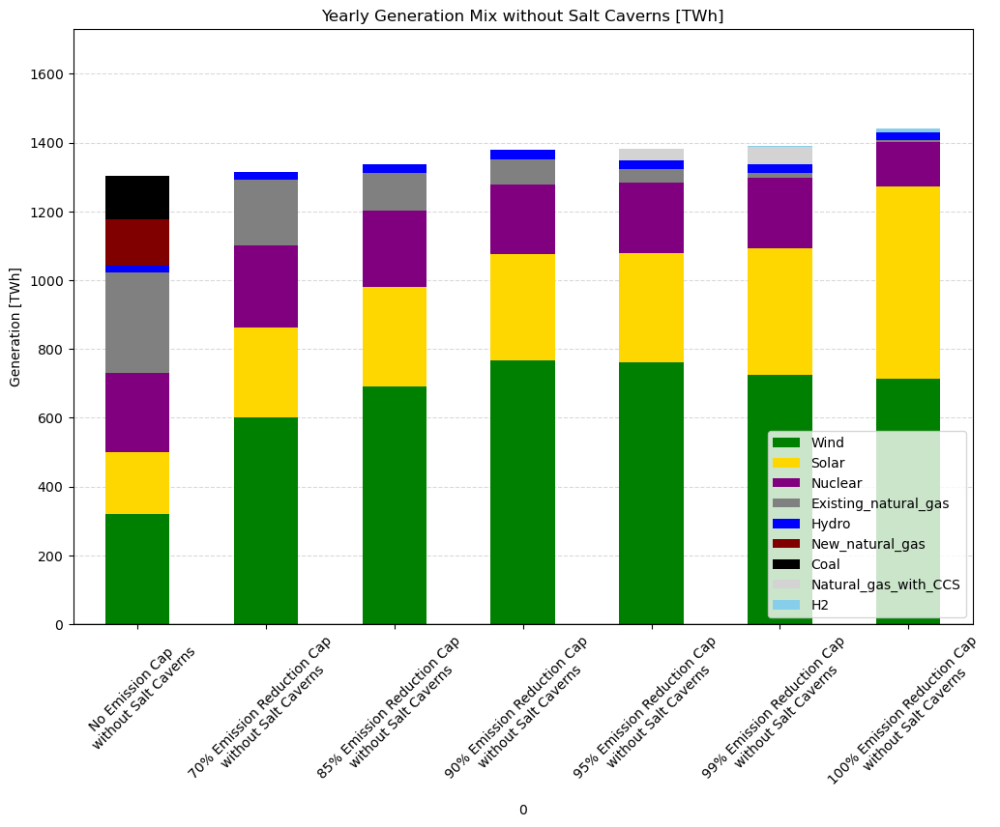

In [30]:
title = "With Salt Cavern scenarios - Without Salt Cavern Scenarios Yearly Generation Mix Delta [TWh]"
y_label = "Generation [TWh]"

df_diff = compare_scenarios(scenarios_no_caverns, scenarios_with_caverns, 
                            generation_power_barchart, title=title, y_label=y_label, units=1.1,
                            title_1='Yearly Generation Mix without Salt Caverns [TWh]',y_label_1='Generation [TWh]', units_1=1.1,
                            
                            title_2='Yearly Generation Mix with Salt Caverns [TWh]',y_label_2='Generation [TWh]', units_2=1.1)

### Installed Capacity Comparison [GW]

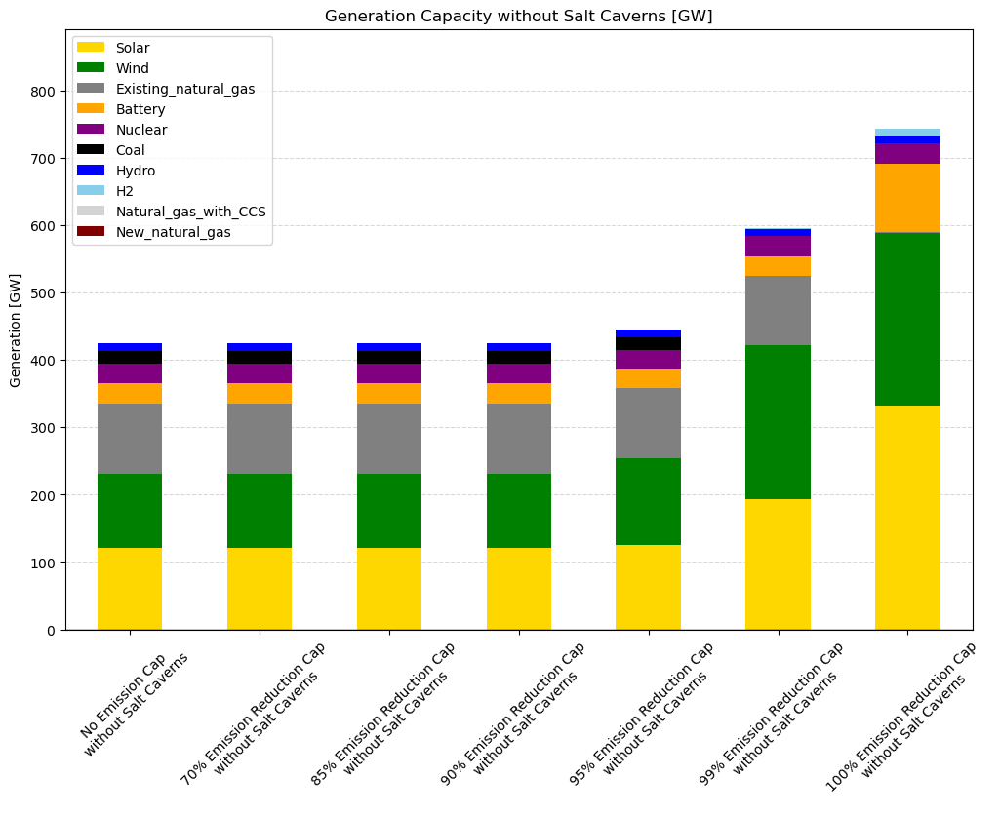

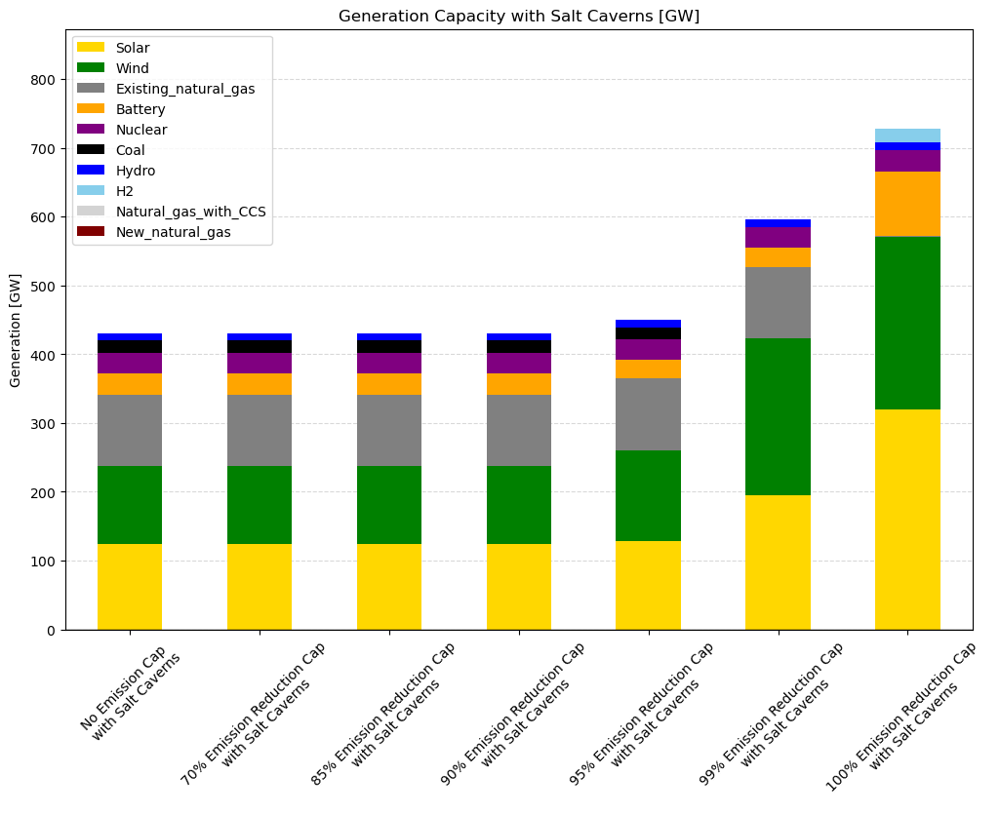

First scenario identifier: 
PJM_with_MI_subregions_no_caverns_0_red
first scenario identifier: 
PJM_with_MI_subregions_with_caverns_0_red
unique id is: 
_no_caverns
Scenario 1 indexes: 
Index(['PJM_with_MI_subregions_no_caverns_0_red',
       'PJM_with_MI_subregions_no_caverns_70_red',
       'PJM_with_MI_subregions_no_caverns_85_red',
       'PJM_with_MI_subregions_no_caverns_90_red',
       'PJM_with_MI_subregions_no_caverns_95_red',
       'PJM_with_MI_subregions_no_caverns_99_red',
       'PJM_with_MI_subregions_no_caverns_100_red'],
      dtype='object')
Scenario 2 indexes: 
Index(['PJM_with_MI_subregions_no_caverns_0_red',
       'PJM_with_MI_subregions_no_caverns_70_red',
       'PJM_with_MI_subregions_no_caverns_85_red',
       'PJM_with_MI_subregions_no_caverns_90_red',
       'PJM_with_MI_subregions_no_caverns_95_red',
       'PJM_with_MI_subregions_no_caverns_99_red',
       'PJM_with_MI_subregions_no_caverns_100_red'],
      dtype='object')
Scenarios present in 1 but missin

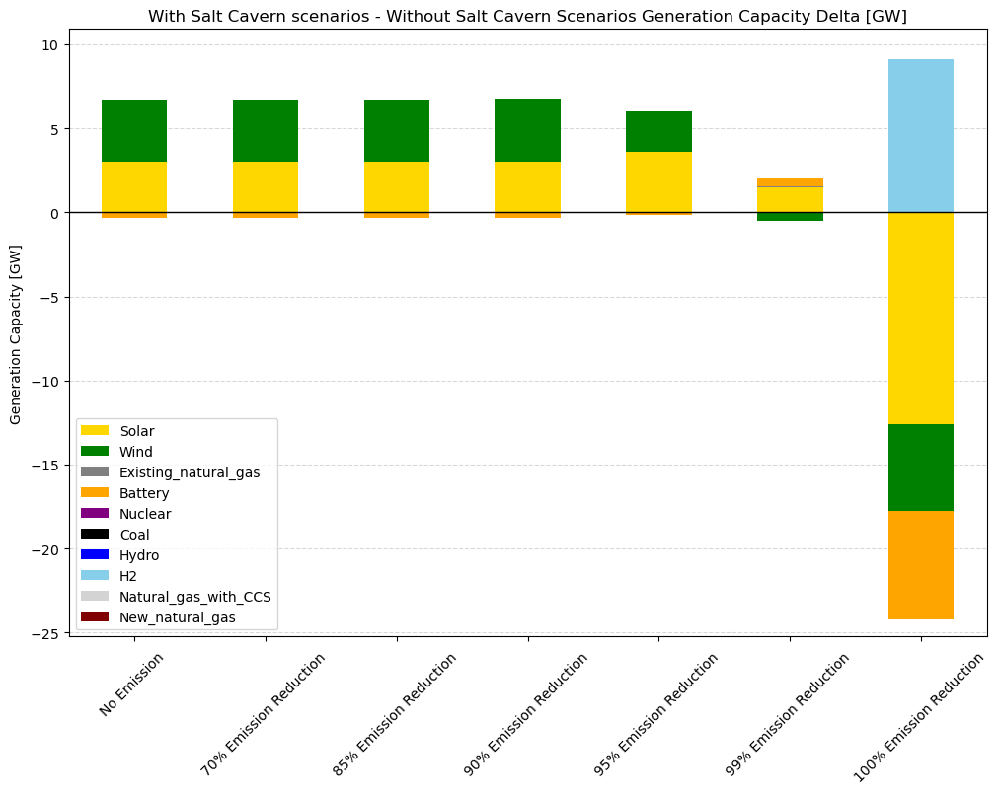

In [17]:
title = "With Salt Cavern scenarios - Without Salt Cavern Scenarios Generation Capacity Delta [GW]"
y_label = "Generation Capacity [GW]"

df_diff = compare_scenarios(scenarios_no_caverns, scenarios_with_caverns, generation_capacity_barchart,
                            title=title, y_label=y_label, units = 1,
                            title_1='Generation Capacity without Salt Caverns [GW]',y_label_1='Generation [GW]', units_1=1,
                            title_2='Generation Capacity with Salt Caverns [GW]',y_label_2='Generation [GW]', units_2=1)

### H2 Generation Capacity [Tons/hr]

In [18]:

def h2_storage_capacity_barchart(scenarios, title=title, y_label=y_label, units=2.1):
    df_main = pd.DataFrame()

    for scenario in scenarios:
        df = h2_capacity_analysis(scenario)
        
        df = df[['Tech_Type', 'EndEnergyCap']]
        df = df[df['Tech_Type'] != 'Total']
        df = df.rename(columns={'EndEnergyCap': scenario})
        # removes rows with 0 (non-storage tech)
        df = df.loc[df[scenario] != 0]

        # Transpose the dataframe    
        df = df.set_index('Tech_Type').T
        #df.plot(kind='bar', stacked=True, label=scenario)
        
        df_main = df_main.append(df, ignore_index=False)
    
    
    # Sort ascending values
    df_main = df_main[df_main.sum().sort_values(ascending=False).index]
    plot_stacked_barchart(df_main, title=title, y_label=y_label, units=units)
    return(df_main)
    
def h2_capacity_generation(scenarios, title=title, y_label=y_label, units=2):
    df_main = pd.DataFrame()

    for scenario in scenarios:
        df = h2_capacity_analysis(scenario)

        df = df[['Tech_Type', 'EndCap']]
        df = df[df['Tech_Type'] != 'Total']
        df = df.rename(columns={'EndCap': scenario})

        df = df[df['Tech_Type'] != 'Above_ground_storage']
        df = df[df['Tech_Type'] != 'Salt_cavern_storage']
        
        # Transpose the dataframe    
        df = df.set_index('Tech_Type').T
        #df.plot(kind='bar', stacked=True, label=scenario)
        
        df_main = df_main.append(df, ignore_index=False)
    #print(df_main)
    plot_stacked_barchart(df_main, title=title, y_label=y_label, units=units)
    return(df_main)


def h2_generation(scenarios, title=title, y_label=y_label, units=2):
    df_main = pd.DataFrame()

    for scenario in scenarios:
        df = h2_generation_analysis(scenario,H2_resource_categories=H2_resource_categories)


        df = df[['Tech_Type', 'AnnualSum']]
        df = df[df['Tech_Type'] != 'Total']
        df = df.rename(columns={'AnnualSum': scenario})#

        df = df[df['Tech_Type'] != 'Above_ground_storage']
        df = df[df['Tech_Type'] != 'Salt_cavern_storage']

        # Transpose the dataframe    
        df = df.set_index('Tech_Type').T
        #df.plot(kind='bar', stacked=True, label=scenario)
        
        df_main = df_main.append(df, ignore_index=False)
    #print(df_main)
    plot_stacked_barchart(df_main, title=title, y_label=y_label, units=units)
    return(df_main)


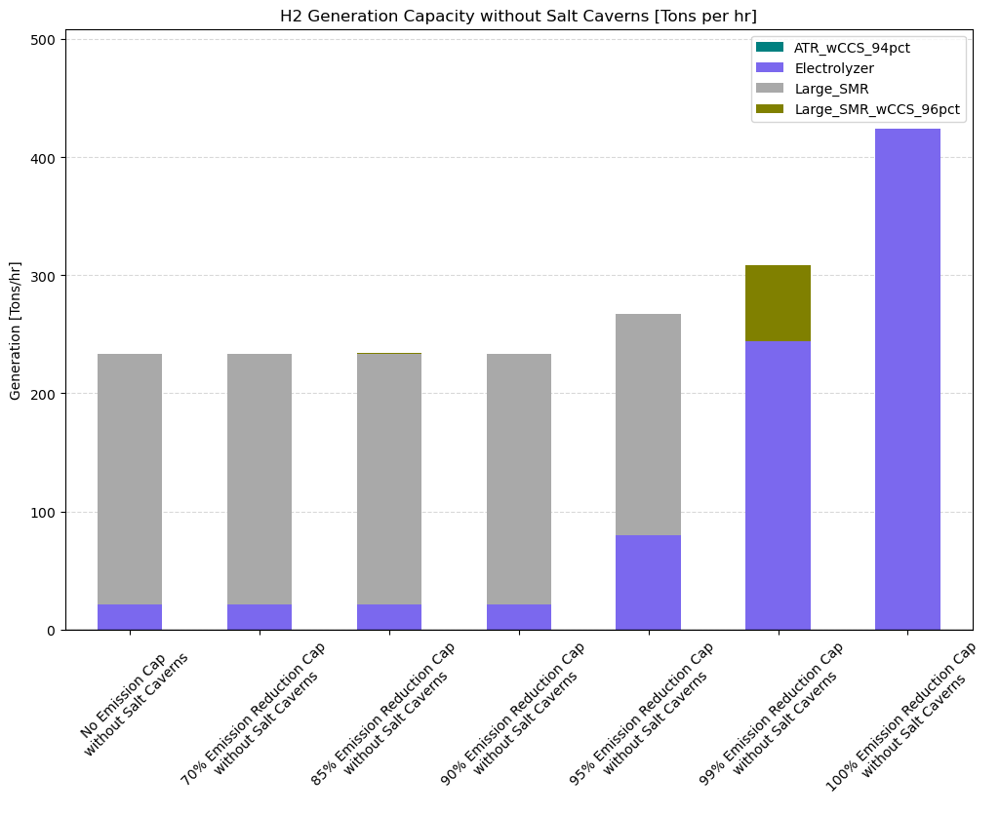

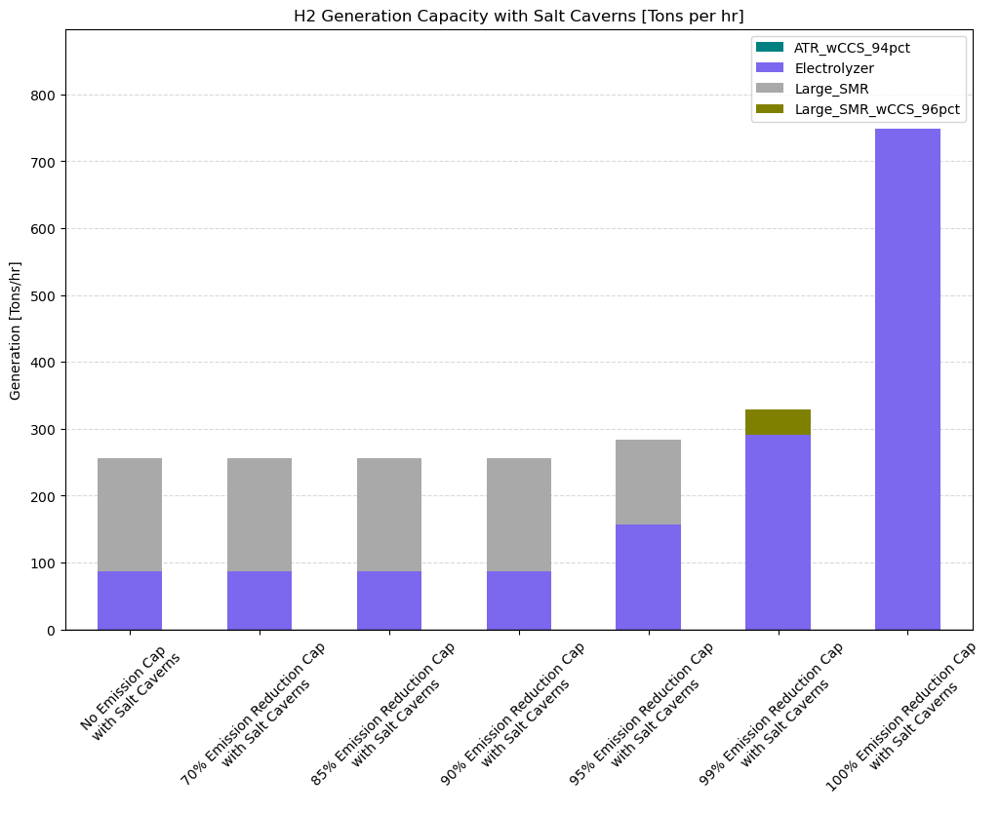

First scenario identifier: 
PJM_with_MI_subregions_no_caverns_0_red
first scenario identifier: 
PJM_with_MI_subregions_with_caverns_0_red
unique id is: 
_no_caverns
Scenario 1 indexes: 
Index(['No Emission Cap', '70% Emission Reduction Cap',
       '85% Emission Reduction Cap', '90% Emission Reduction Cap',
       '95% Emission Reduction Cap', '99% Emission Reduction Cap',
       '100% Emission Reduction Cap'],
      dtype='object')
Scenario 2 indexes: 
Index(['No Emission Cap', '70% Emission Reduction Cap',
       '85% Emission Reduction Cap', '90% Emission Reduction Cap',
       '95% Emission Reduction Cap', '99% Emission Reduction Cap',
       '100% Emission Reduction Cap'],
      dtype='object')
Scenarios present in 1 but missing in 2: Index([], dtype='object')
Scenarios present in 2 but missing in 1: Index([], dtype='object')
Tech_Type                    ATR_wCCS_94pct  Electrolyzer  Large_SMR  \
No Emission Cap                   -0.002369     65.820268 -44.151763   
70% Emission 

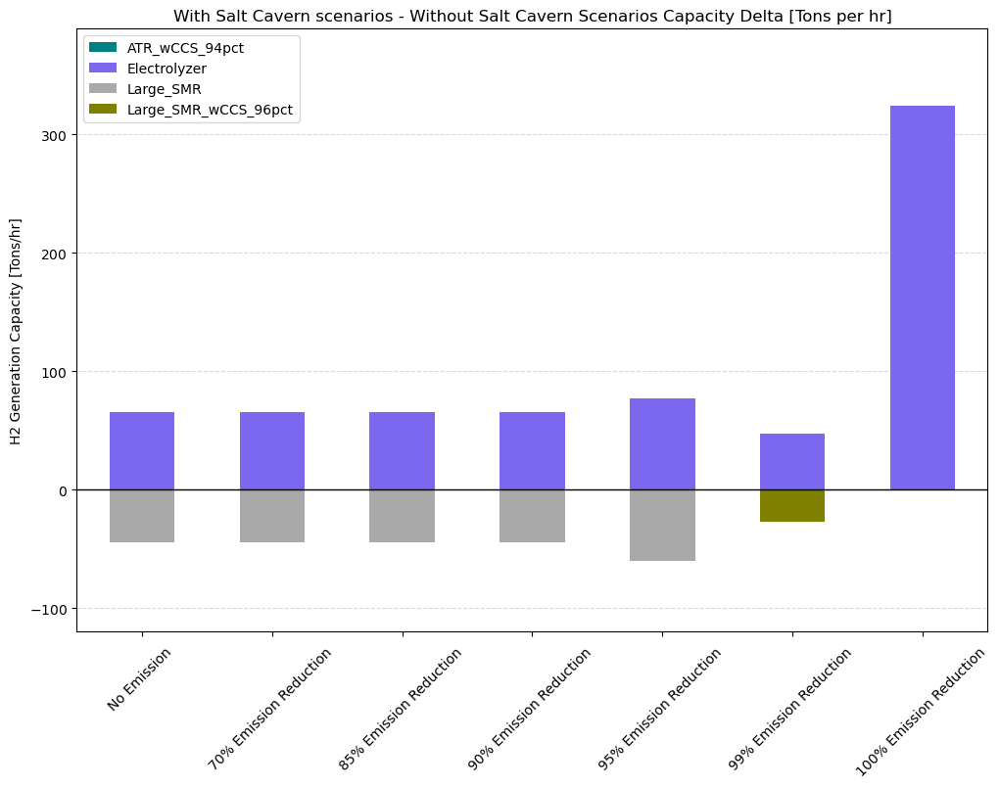

In [19]:
title = "With Salt Cavern scenarios - Without Salt Cavern Scenarios Capacity Delta [Tons per hr]"
y_label = "H2 Generation Capacity [Tons/hr]"

df_diff = compare_scenarios(scenarios_no_caverns, scenarios_with_caverns, h2_capacity_generation, units=2, title=title, y_label=y_label,
                            title_1='H2 Generation Capacity without Salt Caverns [Tons per hr]',y_label_1='Generation [Tons/hr]', units_1=2,
                            title_2='H2 Generation Capacity with Salt Caverns [Tons per hr]',y_label_2='Generation [Tons/hr]', units_2=2)

### H2 Yearly Generation [Mega Tons]

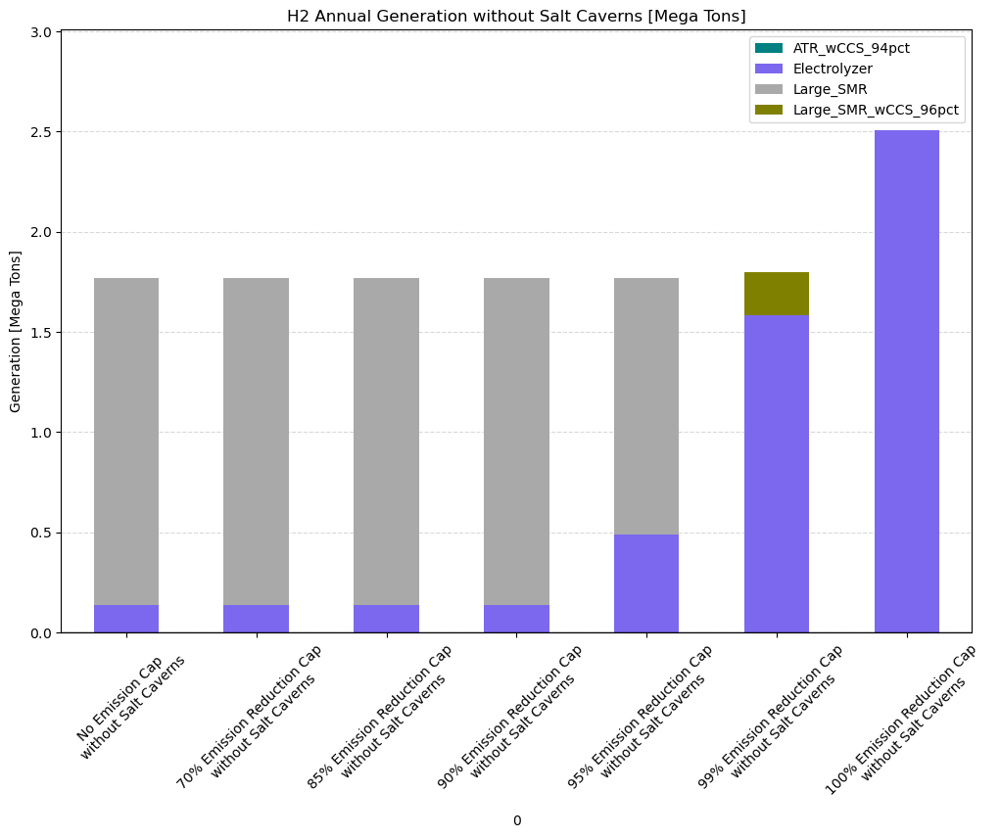

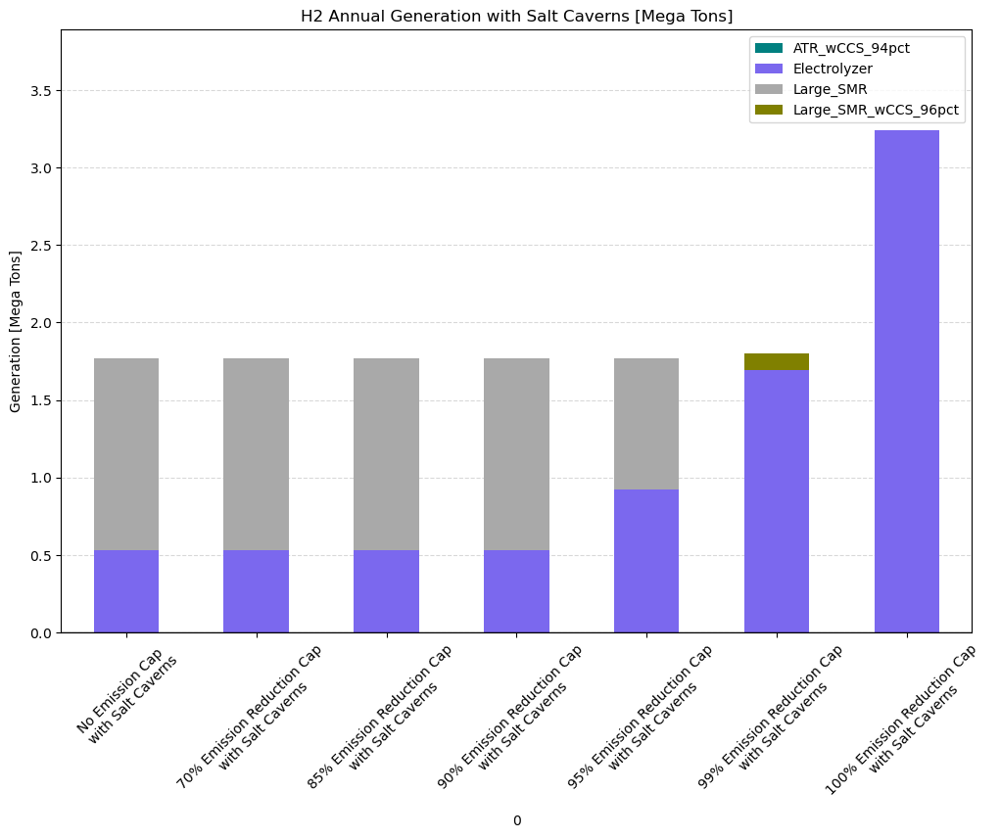

First scenario identifier: 
PJM_with_MI_subregions_no_caverns_0_red
first scenario identifier: 
PJM_with_MI_subregions_with_caverns_0_red
unique id is: 
_no_caverns
Scenario 1 indexes: 
Index(['PJM_with_MI_subregions_no_caverns_0_red',
       'PJM_with_MI_subregions_no_caverns_70_red',
       'PJM_with_MI_subregions_no_caverns_85_red',
       'PJM_with_MI_subregions_no_caverns_90_red',
       'PJM_with_MI_subregions_no_caverns_95_red',
       'PJM_with_MI_subregions_no_caverns_99_red',
       'PJM_with_MI_subregions_no_caverns_100_red'],
      dtype='object', name=0)
Scenario 2 indexes: 
Index(['PJM_with_MI_subregions_no_caverns_0_red',
       'PJM_with_MI_subregions_no_caverns_70_red',
       'PJM_with_MI_subregions_no_caverns_85_red',
       'PJM_with_MI_subregions_no_caverns_90_red',
       'PJM_with_MI_subregions_no_caverns_95_red',
       'PJM_with_MI_subregions_no_caverns_99_red',
       'PJM_with_MI_subregions_no_caverns_100_red'],
      dtype='object', name=0)
Scenarios present

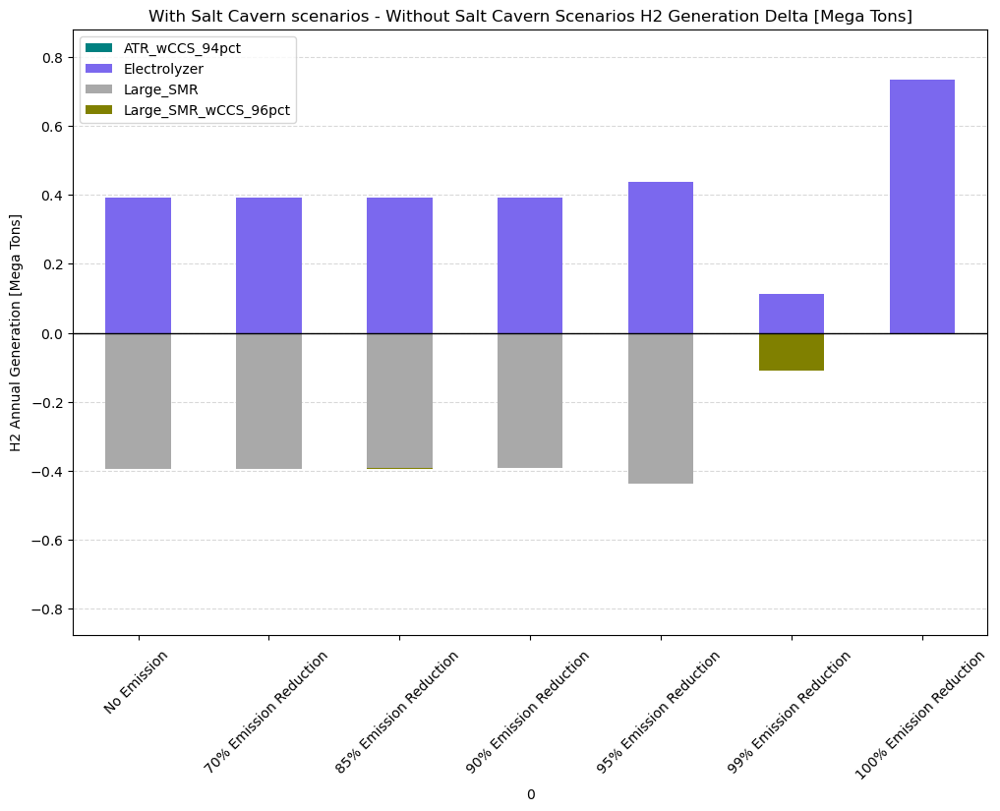

In [20]:
title = "With Salt Cavern scenarios - Without Salt Cavern Scenarios H2 Generation Delta [Mega Tons]"
y_label = "H2 Annual Generation [Mega Tons]"

df_diff = compare_scenarios(scenarios_no_caverns, scenarios_with_caverns, h2_generation, units=2.2, title=title, y_label=y_label,
                            title_1='H2 Annual Generation without Salt Caverns [Mega Tons]',y_label_1='Generation [Mega Tons]', units_1=2.2,
                            title_2='H2 Annual Generation with Salt Caverns [Mega Tons]',y_label_2='Generation [Mega Tons]', units_2=2.2)

### Curtailment Analysis

In [21]:
def curtailment_analysis(scenario, generation_resource_categories=generation_resource_categories):
    df = open_results_file('curtail.csv', scenario)
    df = df.T
    df = df.reset_index()
    df.columns = df.iloc[0]
    df = df[1:]
    df = identify_tech_type(df, generation_resource_categories, aggregate=False)
    df.set_index('Resource', inplace=True)
    df = df[(df['Tech_Type'] == 'Solar') | (df['Tech_Type'] == 'Wind')]

    
    return(df)

def curtailment_barchart(scenarios, title=title, y_label=y_label, units=1):
    df_main = pd.DataFrame()

    for scenario in scenarios:
        df = curtailment_analysis(scenario)
        
        df_tech = df.groupby(['Tech_Type']).sum()
        df_tech = df_tech.rename(columns={'AnnualSum': scenario})
       
        df_tech = df_tech[scenario]
        
        
        df_main = df_main.append(df_tech, ignore_index=False)

    #print(df_main)
    plot_stacked_barchart(df_main, title=title, y_label=y_label, units=units)
    return(df_main)

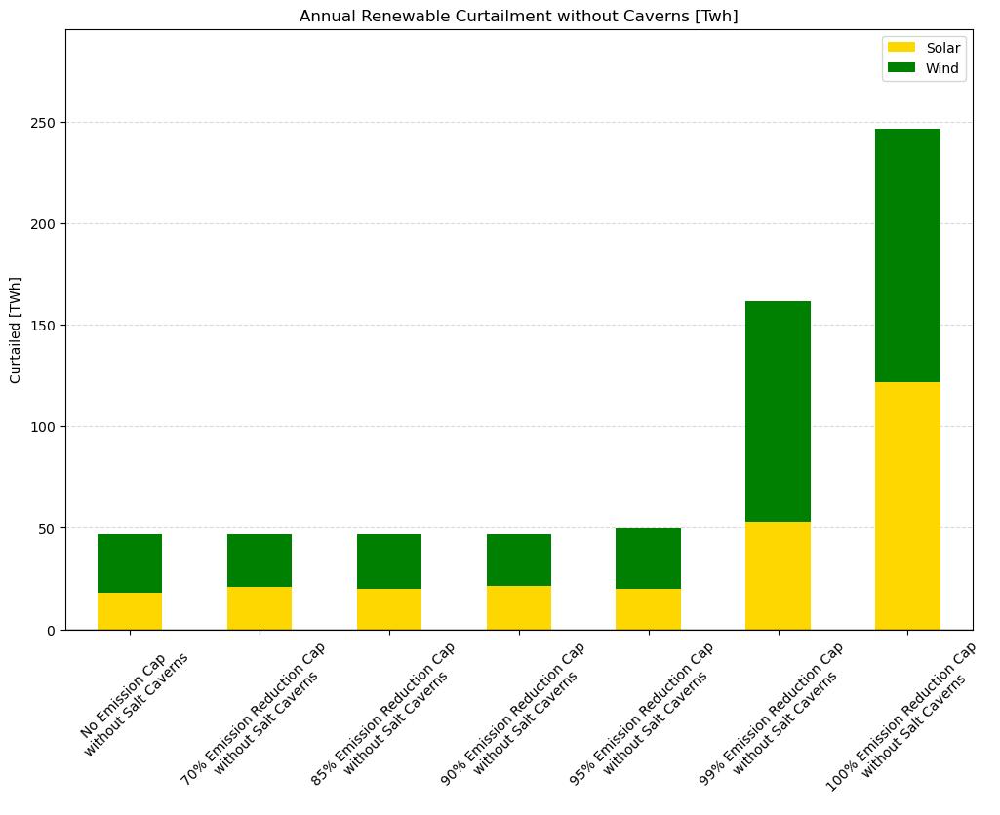

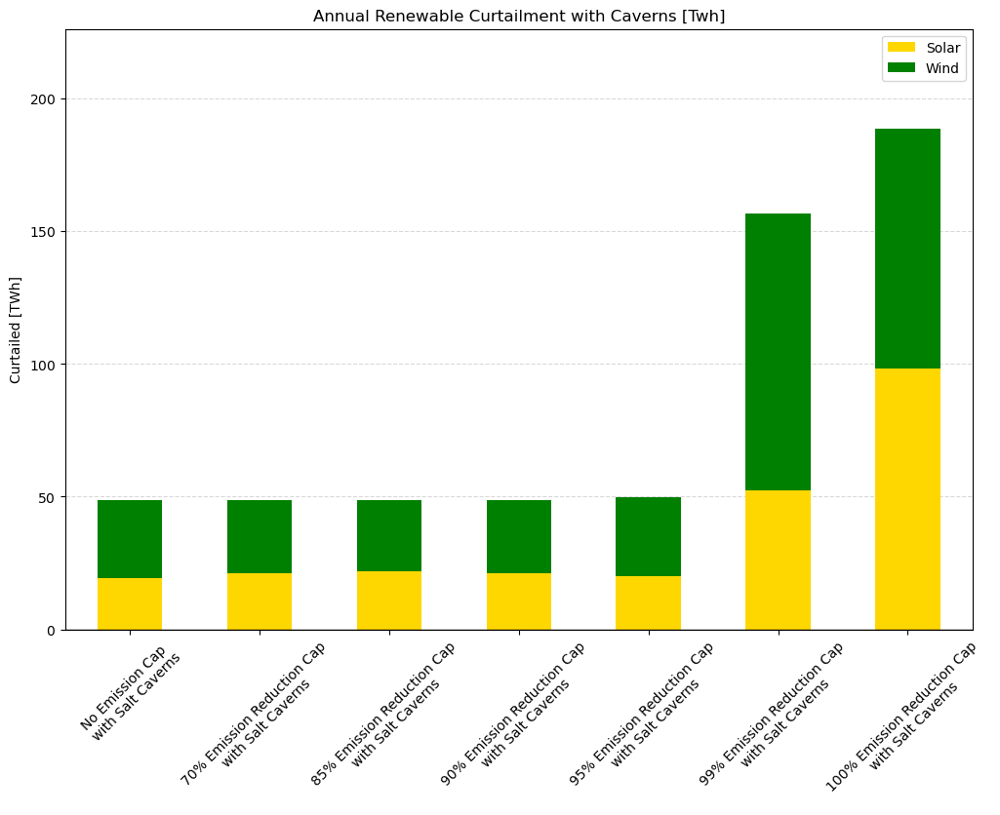

First scenario identifier: 
PJM_with_MI_subregions_no_caverns_0_red
first scenario identifier: 
PJM_with_MI_subregions_with_caverns_0_red
unique id is: 
_no_caverns
Scenario 1 indexes: 
Index(['PJM_with_MI_subregions_no_caverns_0_red',
       'PJM_with_MI_subregions_no_caverns_70_red',
       'PJM_with_MI_subregions_no_caverns_85_red',
       'PJM_with_MI_subregions_no_caverns_90_red',
       'PJM_with_MI_subregions_no_caverns_95_red',
       'PJM_with_MI_subregions_no_caverns_99_red',
       'PJM_with_MI_subregions_no_caverns_100_red'],
      dtype='object')
Scenario 2 indexes: 
Index(['PJM_with_MI_subregions_no_caverns_0_red',
       'PJM_with_MI_subregions_no_caverns_70_red',
       'PJM_with_MI_subregions_no_caverns_85_red',
       'PJM_with_MI_subregions_no_caverns_90_red',
       'PJM_with_MI_subregions_no_caverns_95_red',
       'PJM_with_MI_subregions_no_caverns_99_red',
       'PJM_with_MI_subregions_no_caverns_100_red'],
      dtype='object')
Scenarios present in 1 but missin

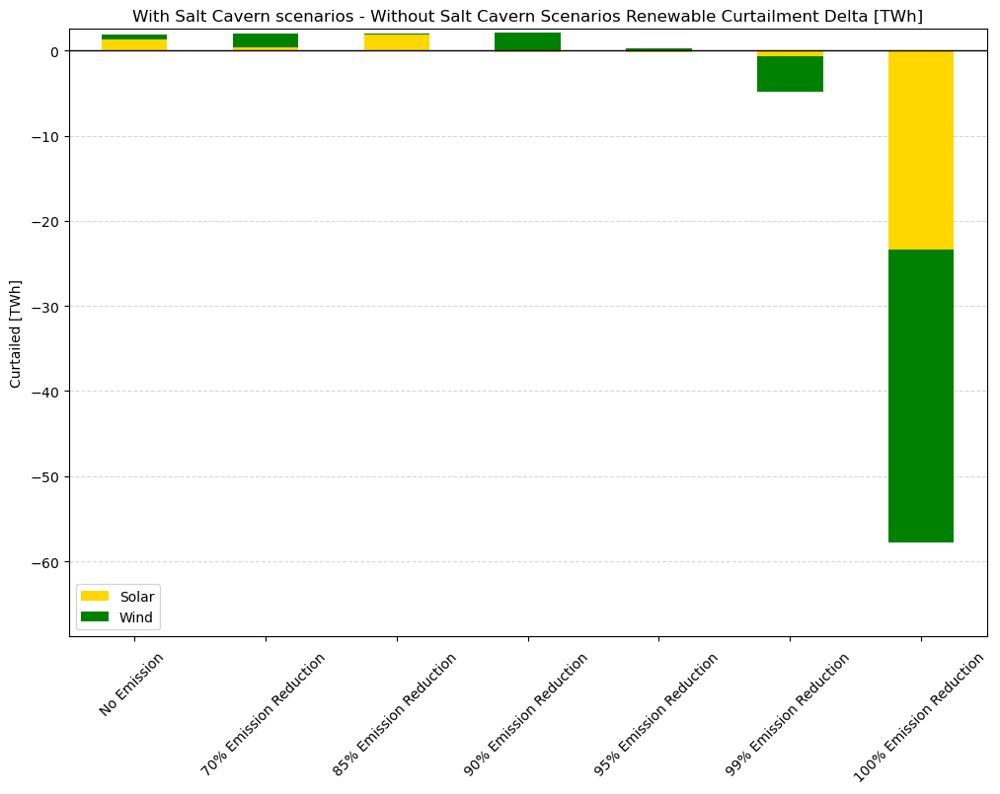

In [22]:
title = "With Salt Cavern scenarios - Without Salt Cavern Scenarios Renewable Curtailment Delta [TWh]"
y_label = "Curtailed [TWh]"

df_diff = compare_scenarios(scenarios_no_caverns, scenarios_with_caverns, curtailment_barchart, units=1.1, title=title, y_label=y_label,
                            title_1='Annual Renewable Curtailment without Caverns [Twh]',y_label_1='Curtailed [TWh]', units_1=1.1,
                            title_2='Annual Renewable Curtailment with Caverns [Twh]',y_label_2='Curtailed [TWh]', units_2=1.1)

### Cost Analysis

In [23]:

 

def costs_breakdown(scenarios, title=title, y_label=y_label, units=3):

    df_main = pd.DataFrame()
    for scenario in scenarios:

        df = open_results_file('costs_system.csv', scenario)
        # Set 'Costs' as the index
        df.set_index('Costs', inplace=True)

        # Keep only the 'Total' column
        df = df[['Total']]
        #df = df[df['Total'] != 0]
        df = df.rename(columns={'Total': scenario})
        df = df.drop('cTotal', errors='ignore')
        df = df.drop('cPower_Total', errors='ignore')
        df = df.drop('cHSC_Total', errors='ignore')
        df = df.drop('cCSC_Total', errors='ignore')
        # Join dataframes
        if df_main.empty:
            df_main = df
        else:
            df_main = df_main.join(df, how='outer')

    # Remove rows where all values are NaN
    df_main = df_main.dropna(how='all')
    # Remove 'cTotal' row
    df_main = df_main.drop('cTotal', errors='ignore')
    df_main = df_main.T

    plot_stacked_barchart(df_main, title=title, y_label=y_label, units=units)
    return(df_main)
    
def costs_scenarios(scenarios, title=title, y_label=y_label, units=3):
    
    df_main = pd.DataFrame()
    for scenario in scenarios:

        df = open_results_file('costs_system.csv', scenario)
        # Set 'Costs' as the index
        df.set_index('Costs', inplace=True)

        # Keep only the 'Total' column and 'cTotal' row
        df = df.loc[['cTotal'], ['Total']]
        df = df.rename(columns={'Total': scenario})
        # Join dataframes
        if df_main.empty:
            df_main = df
        else:
            df_main = df_main.join(df, how='outer')

        # Find the scenario that contains 'NoCap'
    base_scenario = df_main.columns[df_main.columns.str.contains('NoCap')][0]
            
    # Transpose the DataFrame so that the scenarios are the rows and costs are the columns
    df_main = df_main.T

    # Normalize the data with respect to the 'NoCap' scenario and convert to percentage increase
    df_main = (df_main / df_main.loc[base_scenario])

    plot_stacked_barchart(df_main, title=title, y_label=y_label, units=units)
    return(df_main)



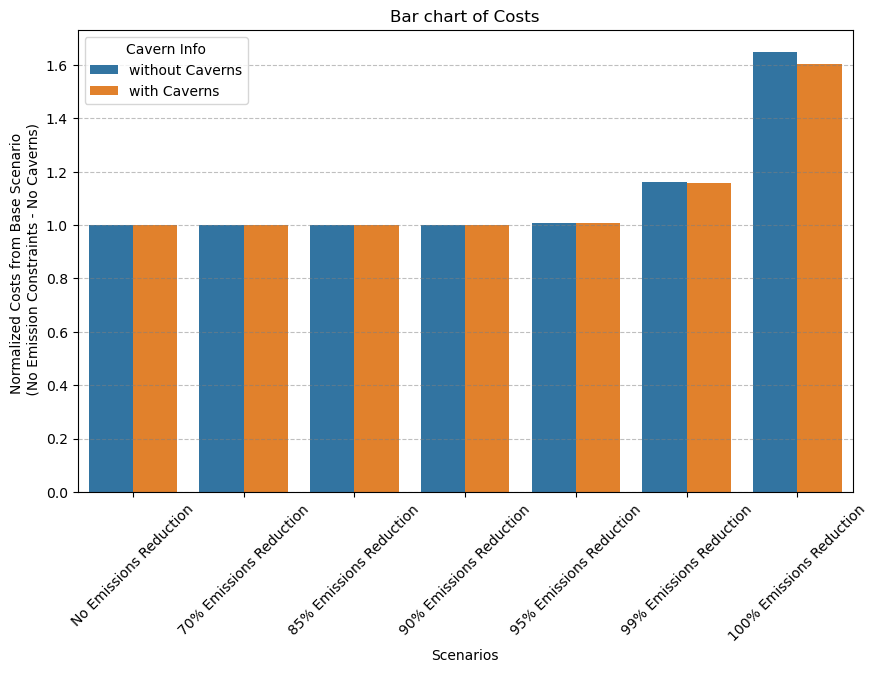

In [24]:
def extract_emission_scenario(s):
    if '_0_red' in s:
        return 'No Emissions Reduction'
    else:
        reduction = s.split('_')[-2]
        return f'{reduction}% Emissions Reduction'

    
scenarios_without_caverns = scenarios_no_caverns
scenarios_with_caverns

df_main = pd.DataFrame()
cavern_info = {} # Here's where we'll store the metadata

base_scenario = [s for s in scenarios_without_caverns if '_0_red' in s and 'no_cavern' in s][0]
df_base_scenario = open_results_file('costs_system.csv', base_scenario)
df_base_scenario.set_index('Costs', inplace=True)
df_base_scenario = df_base_scenario.loc[['cTotal'], ['Total']]
df_base_scenario = df_base_scenario.rename(columns={'Total': base_scenario})
base_scenario_cost = df_base_scenario.iloc[0][0]

for scenario in scenarios_without_caverns + scenarios_with_caverns:

    df = open_results_file('costs_system.csv', scenario)
    df.set_index('Costs', inplace=True)
    df = df.loc[['cTotal'], ['Total']]
    df = df.rename(columns={'Total': scenario})

    cavern_info[scenario] = 'with Caverns' if scenario in scenarios_with_caverns else 'without Caverns' # Update the metadata

    if df_main.empty:
        df_main = df
    else:
        df_main = df_main.join(df, how='outer')

df_main = df_main.T
df_main = df_main.astype(float) / base_scenario_cost
df_main.sort_values('cTotal')


df_plot = df_main.copy()#.sort_values('cTotal')
df_plot['Cavern Info'] = df_plot.index.map(cavern_info) # Add the metadata back    

    
# Reset the index so we can use the 'Scenario' as a column
df_plot.reset_index(inplace=True)
df_plot.rename(columns={'index':'Scenario'}, inplace=True)

# Create the new column 'Emission Scenario' using the function defined above
df_plot['Emission Scenario'] = df_plot['Scenario'].apply(extract_emission_scenario)



plt.figure(figsize=(10,6))
sns.barplot(data=df_plot, x='Emission Scenario', y='cTotal', hue='Cavern Info')
plt.title('Total Costs for Different Emission Scenarios')
plt.ylabel('Total Costs')
plt.xlabel('Emission Scenarios')
plt.grid(True,linestyle='--', which='major', color='gray', alpha=.5, axis='y') 
plt.xlabel('Scenarios')  
plt.ylabel('Normalized Costs from Base Scenario \n (No Emission Constraints - No Caverns)')
plt.title('Bar chart of Costs')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.legend(title='Cavern Info')
plt.show()



                               Difference  Order
90% Emission Reduction Cap\n    -0.001389      4
100% Emission Reduction Cap\n   -0.044864      7
No Emission Cap\n               -0.001393      1
99% Emission Reduction Cap\n    -0.005479      6
95% Emission Reduction Cap\n    -0.002373      5
70% Emission Reduction Cap\n    -0.001373      2
85% Emission Reduction Cap\n    -0.001385      3


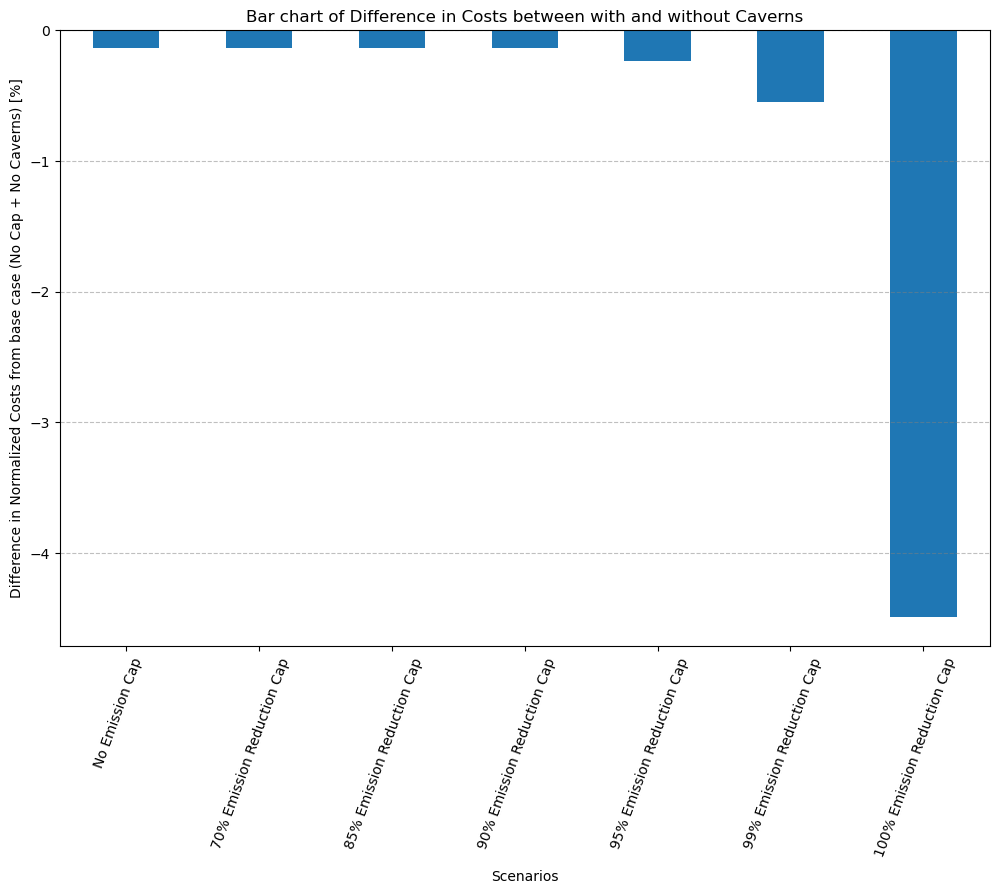

In [25]:
scenarios_without_caverns = scenarios_no_caverns

df_main = pd.DataFrame()
cavern_info = {} # Here's where we'll store the metadata

base_scenario = [s for s in scenarios_without_caverns if '_0_red' in s and 'no_cavern' in s][0]
df_base_scenario = open_results_file('costs_system.csv', base_scenario)
df_base_scenario.set_index('Costs', inplace=True)
df_base_scenario = df_base_scenario.loc[['cTotal'], ['Total']]
df_base_scenario = df_base_scenario.rename(columns={'Total': base_scenario})
base_scenario_cost = df_base_scenario.iloc[0][0]

for scenario in scenarios_without_caverns + scenarios_with_caverns:

    df = open_results_file('costs_system.csv', scenario)
    df.set_index('Costs', inplace=True)
    df = df.loc[['cTotal'], ['Total']]
    df = df.rename(columns={'Total': scenario})

    cavern_info[scenario] = 'with Caverns' if scenario in scenarios_with_caverns else 'without Caverns' # Update the metadata

    if df_main.empty:
        df_main = df
    else:
        df_main = df_main.join(df, how='outer')

df_main = df_main.T
df_main = (df_main.astype(float) - base_scenario_cost) / base_scenario_cost
df_main.sort_values('cTotal')

df_plot = df_main.copy()
df_plot['Cavern Info'] = df_plot.index.map(cavern_info) # Add the metadata back
df_plot.rename(index=rename_dict, inplace=True)

# List to hold the differences
differences = []

# Loop over unique scenario names
for scenario in set(df_plot.index.str.replace(" with Salt Caverns", "").str.replace(" without Salt Caverns", "")):
    # Get the values for the scenario with and without caverns
    with_caverns = df_plot.loc[scenario + " with Salt Caverns", "cTotal"]
    without_caverns = df_plot.loc[scenario + " without Salt Caverns", "cTotal"]
    
    # Calculate the difference and append to the list
    differences.append(with_caverns - without_caverns)

# Create a new DataFrame with the differences
df_differences = pd.DataFrame(differences, index=set(df_plot.index.str.replace(" with Salt Caverns", "").str.replace(" without Salt Caverns", "")), columns=["Difference"])



# Define the order
order_dict = {"No Emission Cap\n": 1,
              "70% Emission Reduction Cap\n": 2,
              "85% Emission Reduction Cap\n": 3,
              "90% Emission Reduction Cap\n": 4,
              "95% Emission Reduction Cap\n": 5,
              "99% Emission Reduction Cap\n": 6,
              "100% Emission Reduction Cap\n": 7}

# Add a new column to the DataFrame with the order
df_differences["Order"] = df_differences.index.map(order_dict)
print(df_differences)
# Sort by the new column
df_differences.sort_values("Order", inplace=True)

# Drop the order column
df_differences.drop("Order", axis=1, inplace=True)

# Plot the differences
# Convert 'Difference' to percentage
df_differences['Difference'] = df_differences['Difference'] * 100


# Create a figure with specified size (width, height)
fig, ax = plt.subplots(figsize=(12, 8))

# Plot
df_differences.plot(kind='bar', legend=False, ax=ax)
plt.grid(True, linestyle='--', which='major', color='gray', alpha=.5, axis='y')
plt.xlabel('Scenarios')  
plt.ylabel('Difference in Normalized Costs from base case (No Cap + No Caverns) [%]')  # indicate percentages in y-label
plt.title('Bar chart of Difference in Costs between with and without Caverns')
plt.xticks(rotation=70)  # Rotate x-axis labels for better visibility
plt.show()

#save_and_show_plot(fig, 'your_image_name')




### Emissions Analysis

## With Above Ground Storage vs. Without Above Ground Storage

### Yearly Generation [TWh]

In [1321]:
title = "With Above Ground Storage scenarios - Without Above Ground Storage Scenarios Yearly Generation Mix Delta [TWh]"
y_label = "Generation [TWh]"

df_diff = compare_scenarios(scenarios_no_above_ground_storage, scenarios_with_caverns,
                            generation_power_barchart, title=title, y_label=y_label, units=1.1,
                            title_1='Yearly Generation Mix with Above Ground Storage [TWh]',y_label_1='Generation [TWh]', units_1=1.1,
                            title_2='Yearly Generation Mix without Above Ground Storage [TWh]',y_label_2='Generation [TWh]', units_2=1.1)

FileNotFoundError: [Errno 2] No such file or directory: 'Example_Systems/PJM_with_MI_subregions/PJM_with_MI_subregions_no_above_ground_0_red'

### Installed Capacity Comparison [GW]

In [ ]:
title = "With Above Ground Storage scenarios - Without Above Ground Storage Scenarios Generation Capacity Delta [GW]"
y_label = "Generation Capacity [GW]"

df_diff = compare_scenarios(scenarios_no_above_ground_storage, scenarios_with_caverns, generation_capacity_barchart,
                            title=title, y_label=y_label, units = 1,
                            title_1='Generation Capacity with Above Ground Storage [GW]',y_label_1='Generation [GW]', units_1=1,
                            title_2='Generation Capacity Mix without Above Ground Storage [GW]',y_label_2='Generation [GW]', units_2=1)

### H2 Generation Capacity [Tons/hr]

In [ ]:
title = "With Above Ground Storage scenarios - Without Above Ground Storage Scenarios Capacity Delta [Tons per hr]"
y_label = "H2 Generation Capacity [Tons per hr]"

df_diff = compare_scenarios(scenarios_no_above_ground_storage, scenarios_with_caverns,
                            h2_capacity_generation, units=2, title=title, y_label=y_label,
                            title_1='H2 Generation Capacity with Above Ground Storage [Tons per hr]',y_label_1='Generation [Tons per hr]', units_1=2,
                            title_2='H2 Generation Capacity without Above Ground Storage [Tons per hr]',y_label_2='Generation [Tons per hr]', units_2=2)

### H2 Yearly Generation [Mega Tons]

In [ ]:
title = "With Above Ground Storage scenarios - Without Above Ground Storage Scenarios Capacity Delta [Tons per hr]"
y_label = "H2 Annual Generation [Mega Tons]"

df_diff = compare_scenarios(scenarios_no_above_ground_storage, scenarios_with_caverns,
                            h2_generation, units=2.2, title=title, y_label=y_label,
                             title_1='Annual H2 Generation with Above Ground Storage [Mega Tons]',y_label_1='Generation [Mega Tons]', units_1=2.2,
                            title_2='Annual H2 Generation without Above Ground Storage [Mega Tons]',y_label_2='Generation [Mega Tons]', units_2=2.2)

### Curtailment Analysis

In [ ]:
title = "With Above Ground Storage - Without Above Ground Storage Scenarios Renewable Curtailment Delta [TWh]"
y_label = "Curtailed [TWh]"

df_diff = compare_scenarios(scenarios_no_above_ground_storage, scenarios_with_caverns,
                            curtailment_barchart, units=1.1, title=title, y_label=y_label,
                            title_1='Annual Renewable Curtailment with Above Ground Storage [Twh]',y_label_1='Curtailed [TWh]', units_1=1.1,
                            title_2='Annual Renewable Curtailment without Above Ground Storage [Twh]',y_label_2='Curtailed [TWh]', units_2=1.1)

In [ ]:
df_diff = compare_scenarios(scenarios_no_above_ground_storage, scenarios_with_caverns,
                            h2_generation, units=2.2, title=title, y_label=y_label,
                             title_1='Annual H2 Generation with Above Ground Storage [Mega Tons]',y_label_1='Generation [Mega Tons]', units_1=2.2,
                            title_2='Annual H2 Generation without Above Ground Storage [Mega Tons]',y_label_2='Generation [Mega Tons]', units_2=2.2)

# Broad Scenarios Barcharts

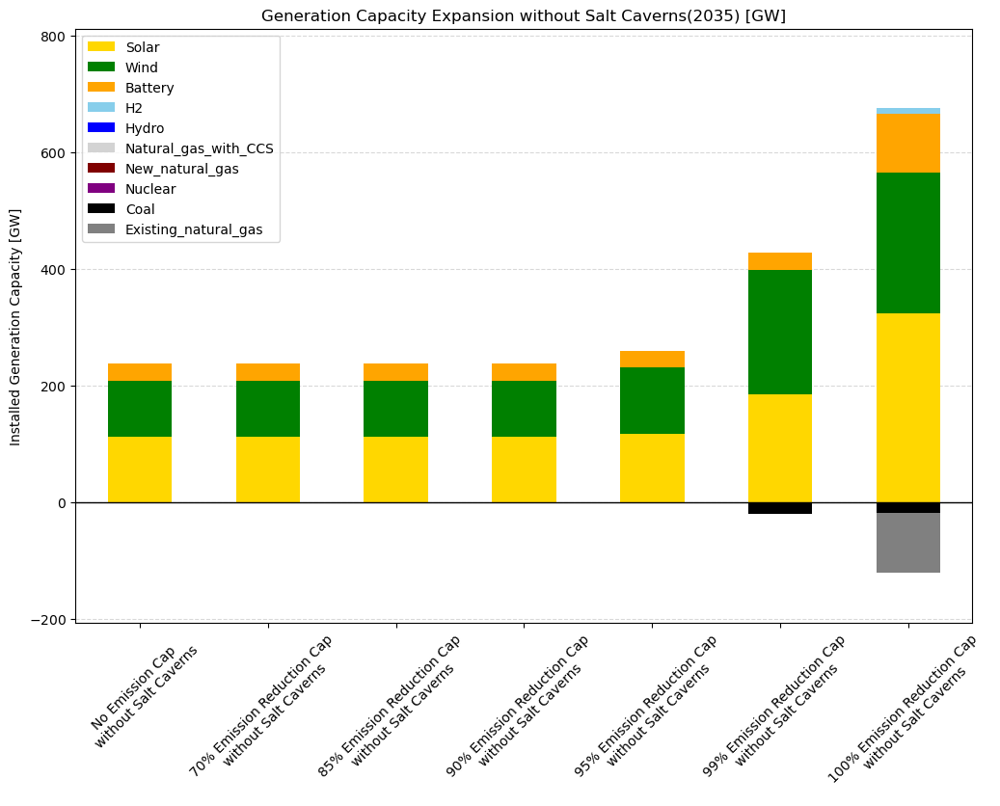

Tech_Type,Solar,Wind,Battery,H2,Hydro,Natural_gas_with_CCS,New_natural_gas,Nuclear,Coal,Existing_natural_gas
PJM_with_MI_subregions_no_caverns_0_red,112796.011060,95220.336660,30781.965817,19.113047,0.0,0.0,0.0,-1160.933690,-0.039033,-0.096071
PJM_with_MI_subregions_no_caverns_70_red,112790.751176,95222.541774,30778.307710,20.784200,0.0,0.0,0.0,-1160.693957,-0.082290,-0.237497
PJM_with_MI_subregions_no_caverns_85_red,112792.212136,95226.908452,30776.488323,22.981090,0.0,0.0,0.0,-1160.564868,-0.049251,-0.181059
PJM_with_MI_subregions_no_caverns_90_red,112789.636995,95224.548525,30781.475181,19.196331,0.0,0.0,0.0,-1160.825078,-0.092394,-0.265070
PJM_with_MI_subregions_no_caverns_95_red,116990.740677,114741.792976,27397.174026,1.866406,0.0,0.0,0.0,-1160.735570,-77.732856,-0.045686
PJM_with_MI_subregions_no_caverns_99_red,184852.741784,214385.235674,28810.906320,283.815622,0.0,0.0,0.0,-1160.659681,-18294.622233,-964.289331
PJM_with_MI_subregions_no_caverns_100_red,323918.862115,241723.702050,100627.145713,10677.339085,0.0,0.0,0.0,2.015694,-18295.200000,-102975.400718


In [28]:
# No caverns generation retirement
title = 'Generation Capacity Expansion without Salt Caverns(2035) [GW]'
y_label = 'Installed Generation Capacity [GW]'

generation_capacity_retirement_barchart(scenarios=scenarios_no_caverns, title=title, y_label=y_label)

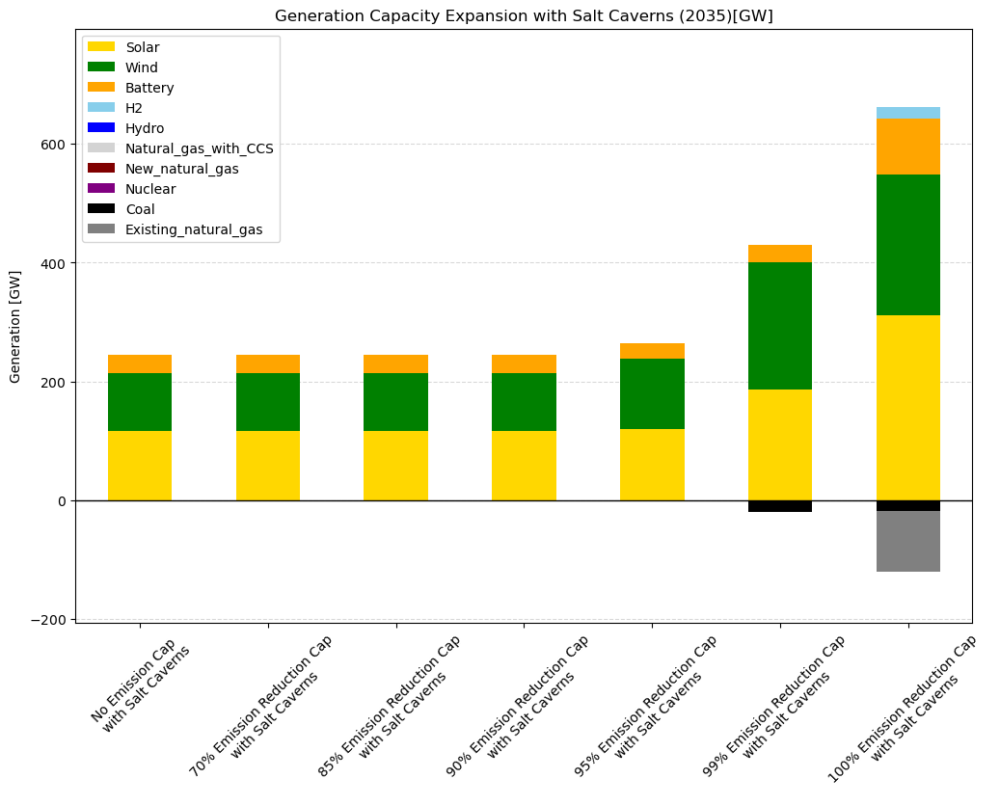

Tech_Type,Solar,Wind,Battery,H2,Hydro,Natural_gas_with_CCS,New_natural_gas,Nuclear,Coal,Existing_natural_gas
PJM_with_MI_subregions_with_caverns_0_red,115813.468213,98928.672147,30448.967666,14.783352,0.0,0.0,0.0,-1160.982213,-0.023960,-0.067876
PJM_with_MI_subregions_with_caverns_70_red,115786.228795,98964.034113,30444.910127,14.590206,0.0,0.0,0.0,-1160.841973,-0.132109,-0.321494
PJM_with_MI_subregions_with_caverns_85_red,115793.207214,98959.331598,30446.248822,14.019228,0.0,0.0,0.0,-1160.880710,-0.106924,-0.285987
PJM_with_MI_subregions_with_caverns_90_red,115805.547636,98946.318721,30451.274870,10.711633,0.0,0.0,0.0,-1161.035671,-0.067960,-0.180339
PJM_with_MI_subregions_with_caverns_95_red,120559.531097,117155.899584,27258.796639,1.597121,0.0,0.0,0.0,-1160.861805,-61.515880,-0.032989
PJM_with_MI_subregions_with_caverns_99_red,186341.583185,213857.913129,29341.400199,287.329996,0.0,0.0,0.0,-1160.780229,-18294.784654,-905.871355
PJM_with_MI_subregions_with_caverns_100_red,311302.265551,236555.424944,94175.043377,19770.184258,0.0,0.0,0.0,1.214482,-18295.200000,-102975.400315


In [29]:
# With caverns generation retirement
title = 'Generation Capacity Expansion with Salt Caverns (2035)[GW]'
y_label = 'Generation [GW]'
generation_capacity_retirement_barchart(scenarios=scenarios_with_caverns, title=title, y_label=y_label)

In [ ]:
# With caverns generation retirement
title = 'Generation Capacity Expansion without Above Ground Storage (2035)[GW]'
y_label = 'Generation [GW]'
generation_capacity_retirement_barchart(scenarios=scenarios_no_above_ground_storage, title=title, y_label=y_label)

In [ ]:
# With caverns generation retirement
title = 'Generation Capacity Mix without Salt Caverns (2035)[GW]'
y_label = 'Generation [GW]'
generation_capacity_barchart(scenarios=scenarios_no_caverns, title=title, y_label=y_label)

In [ ]:
# With caverns generation retirement
title = 'Generation Capacity Mix with Salt Caverns (2035)[GW]'
y_label = 'Generation [GW]'
generation_capacity_barchart(scenarios=scenarios_with_caverns, title=title, y_label=y_label)

In [ ]:
# With caverns generation retirement
title = 'Generation Power Mix without Salt Caverns (2035)[GWh]'
y_label = 'Generation Power [GWh]'
generation_power_barchart(scenarios=scenarios_no_caverns, title=title, y_label=y_label)


In [ ]:
# With caverns generation retirement
title = 'Generation Power Mix with Salt Caverns (2035)[GWh]'
y_label = 'Generation Power [GWh]'
generation_power_barchart(scenarios=scenarios_with_caverns, title=title, y_label=y_label)


In [ ]:
# With caverns generation retirement
title = 'Generation Power Mix with Salt Caverns (2035)[GWh]'
y_label = 'Generation Power [GWh]'
generation_power_barchart(scenarios=scenarios_with_caverns, title=title, y_label=y_label)


In [ ]:
# With caverns generation retirement
title = 'H2 Production Capacity Mix with Salt Caverns (2035)[MT]'
y_label = 'H2 Production Capacity [MT]'
h2_capacity_generation(scenarios=scenarios_with_caverns, title=title, y_label=y_label)


In [ ]:
# With caverns generation retirement
title = 'H2 Annual Generation without Salt Caverns (2035)[MT]'
y_label = 'H2 Generation [MT]'
h2_generation(scenarios=scenarios_no_caverns, title=title, y_label=y_label)

In [ ]:
# With caverns generation retirement
title = 'H2 Annual Generation with Salt Caverns (2035)[MT]'
y_label = 'H2 Generation [MT]'
h2_generation(scenarios=scenarios_with_caverns, title=title, y_label=y_label)

### H2 Storage Plotting

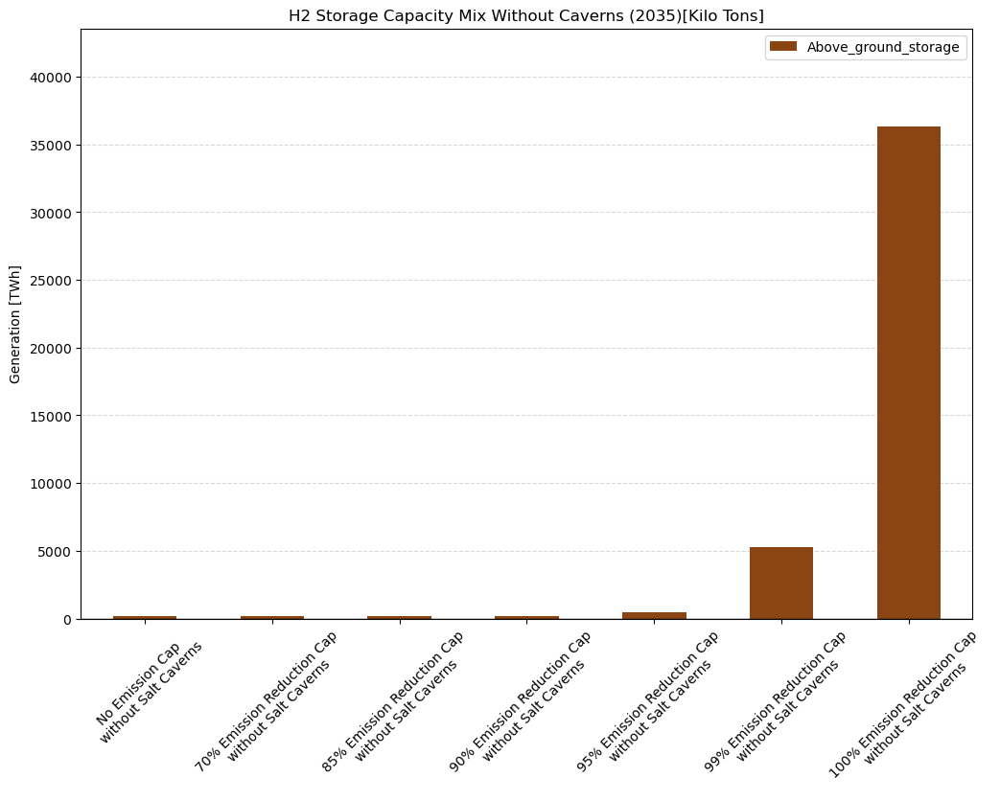

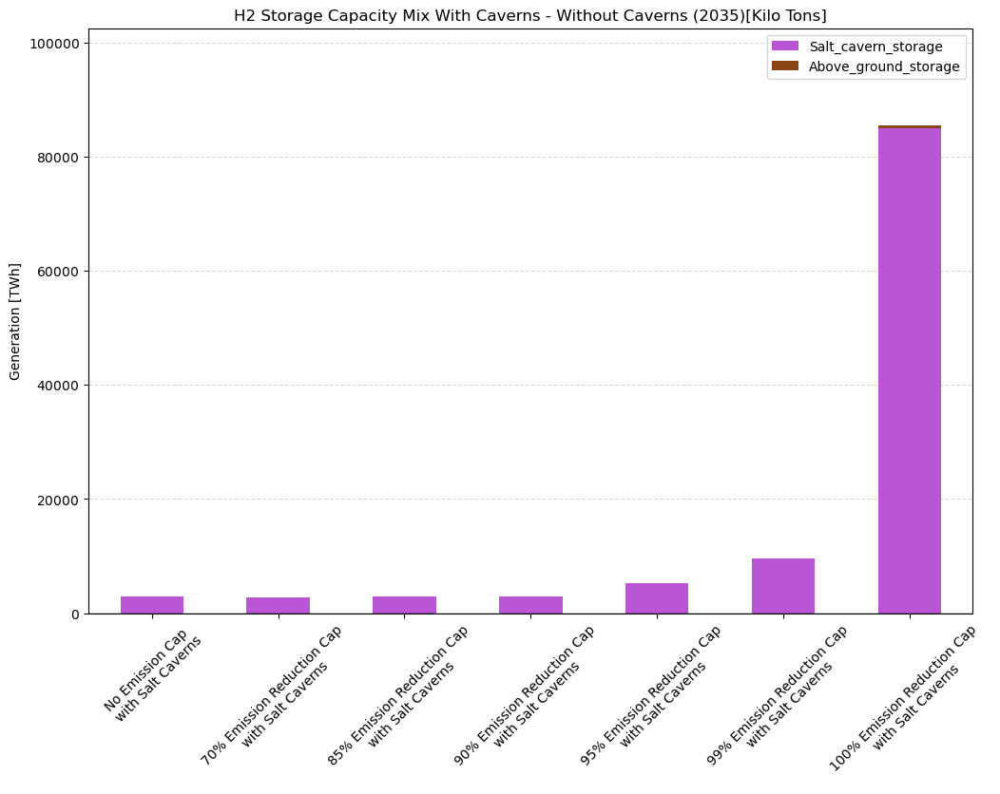

Scenarios present in 1 but missing in 2: Index([], dtype='object')
Scenarios present in 2 but missing in 1: Index([], dtype='object')
Tech_Type                    Above_ground_storage  Salt_cavern_storage
No Emission Cap                       -155.914779                  NaN
70% Emission Reduction Cap            -155.638773                  NaN
85% Emission Reduction Cap            -156.232223                  NaN
90% Emission Reduction Cap            -156.448877                  NaN
95% Emission Reduction Cap            -443.984836                  NaN
99% Emission Reduction Cap           -5252.269270                  NaN
100% Emission Reduction Cap         -35927.967727                  NaN


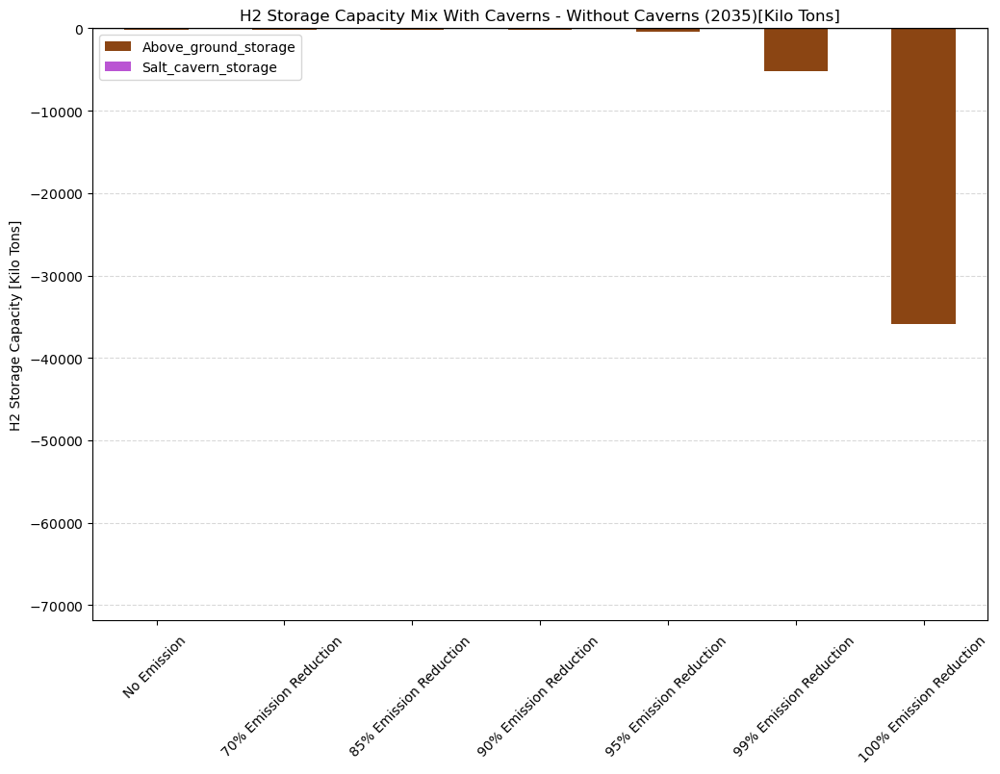

In [828]:
title = 'H2 Storage Capacity Mix With Caverns - Without Caverns (2035)[Kilo Tons]'
y_label = 'H2 Storage Capacity [Kilo Tons]'
units = 2 # Tons H2
df_diff = compare_scenarios(scenarios_no_caverns, scenarios_with_caverns, 
                            h2_storage_capacity_barchart, title=title, y_label=y_label, units=units,
                            title_1='H2 Storage Capacity Mix Without Caverns (2035)[Kilo Tons]',y_label_1='Generation [TWh]', units_1=units,
                            title_2='H2 Storage Capacity Mix With Caverns - Without Caverns (2035)[Kilo Tons]',y_label_2='Generation [TWh]', units_2=units)

In [33]:
# Without AGS
title = 'H2 Storage Capacity Mix with only Salt Cavern Storage (2035)[Kilo Tons]'
y_label = 'H2 Storage Capacity [Kilo Tons]'
h2_storage_capacity_barchart(scenarios=scenarios_no_above_ground_storage, title=title, y_label=y_label)


FileNotFoundError: [Errno 2] No such file or directory: 'Example_Systems/PJM_with_MI_subregions/PJM_with_MI_subregions_no_above_ground_0_red'

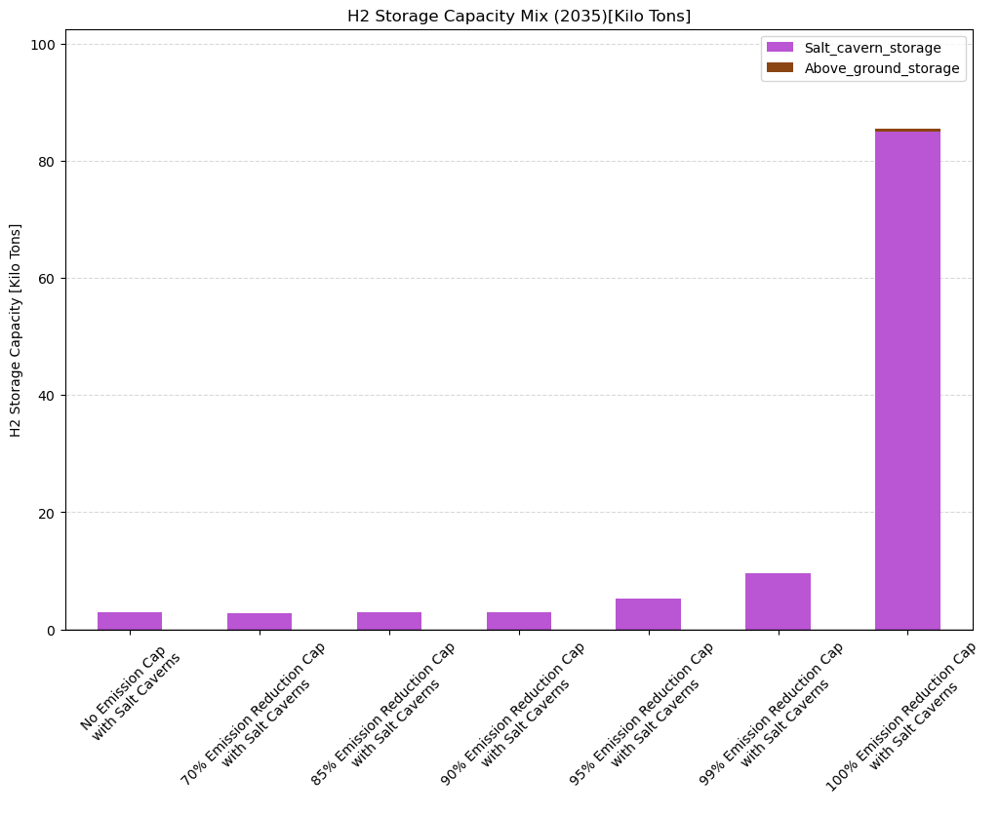

Tech_Type,Salt_cavern_storage,Above_ground_storage
PJM_with_MI_subregions_with_caverns_0_red,2864.345403,1.905769
PJM_with_MI_subregions_with_caverns_70_red,2842.016747,1.244065
PJM_with_MI_subregions_with_caverns_85_red,2853.083004,1.148802
PJM_with_MI_subregions_with_caverns_90_red,2864.441269,0.716898
PJM_with_MI_subregions_with_caverns_95_red,5285.203908,0.593989
PJM_with_MI_subregions_with_caverns_99_red,9531.507358,1.062932
PJM_with_MI_subregions_with_caverns_100_red,85033.863935,368.282849


In [32]:
# With caverns generation retirement
title = 'H2 Storage Capacity Mix (2035)[Kilo Tons]'
y_label = 'H2 Storage Capacity [Kilo Tons]'
h2_storage_capacity_barchart(scenarios=scenarios_with_caverns, title=title, y_label=y_label)


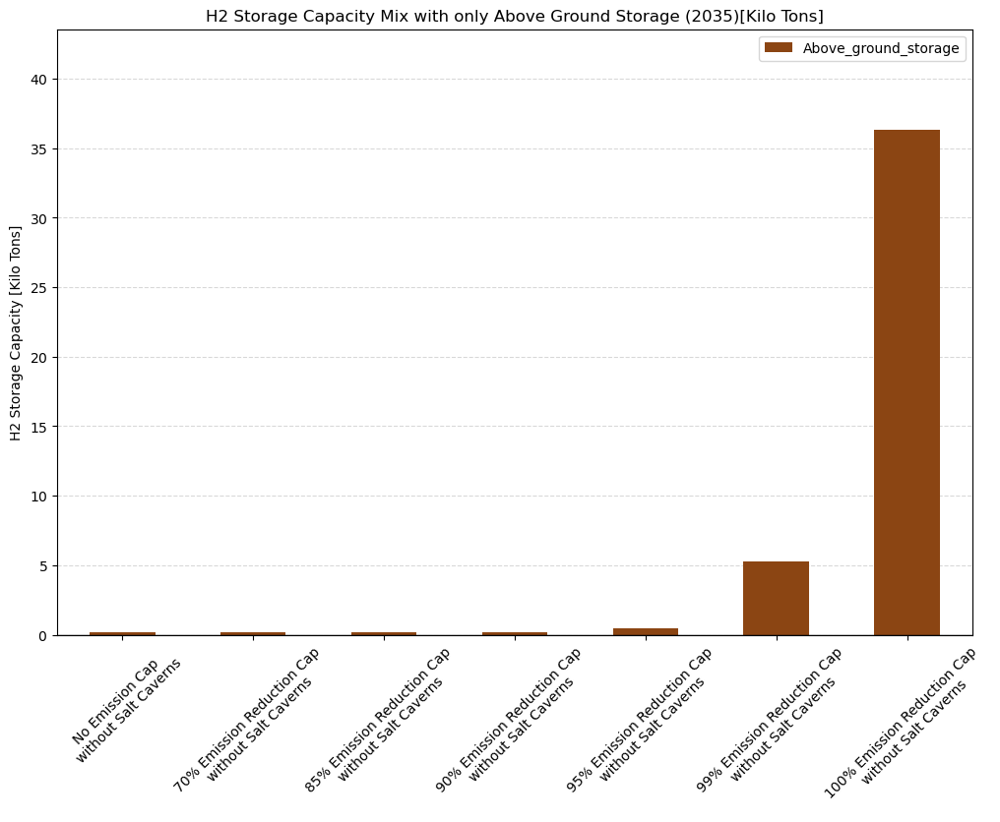

Tech_Type,Above_ground_storage
PJM_with_MI_subregions_no_caverns_0_red,157.820548
PJM_with_MI_subregions_no_caverns_70_red,156.882838
PJM_with_MI_subregions_no_caverns_85_red,157.381025
PJM_with_MI_subregions_no_caverns_90_red,157.165775
PJM_with_MI_subregions_no_caverns_95_red,444.578825
PJM_with_MI_subregions_no_caverns_99_red,5253.332201
PJM_with_MI_subregions_no_caverns_100_red,36296.250575


In [31]:
# With caverns generation retirement
title = 'H2 Storage Capacity Mix with only Above Ground Storage (2035)[Kilo Tons]'
y_label = 'H2 Storage Capacity [Kilo Tons]'
h2_storage_capacity_barchart(scenarios=scenarios_no_caverns, title=title, y_label=y_label)


# Spatial Analysis

## Zonal Barcharts

In [34]:



def spatial_scenario_dict_creator(result_file, scenarios=scenarios):
    dataframes_dict = {}
    for scenario in scenarios:
        #print(scenario)

        df = open_results_file(result_file, scenario)
        df = df.T
        #identify_tech_type(df, resources, aggregate=False)
        df = df.reset_index()
        df.columns = df.iloc[0]
        df = df[1:]
        df = df.rename(columns={'Zone': 'Zone_N'})

        df = identify_tech_type(df, resources=H2_resource_categories, aggregate=False)
        df = df.iloc[:-1]
        df = df.reset_index()
        df['Zone'] = df['Resource'].apply(lambda resource: next((zone for zone in zones if zone in resource), None))

        # Group the dataframe by 'Zone_N'
        zoned = df.groupby('Zone')

        # Create a double key dictionary of dataframes. Keys are scenario and zone

        for zone, group in zoned:
            dataframes_dict[zone, scenario] = group
    return(dataframes_dict)

dataframes_dict = spatial_scenario_dict_creator(result_file='HSC_h2_generation_discharge.csv', scenarios=scenarios)
dataframes_dict[zones[0], scenarios[0]]

,index,Resource,Zone_N,AnnualSum,t1,t2,t3,t4,t5,t6,...,t1841,t1842,t1843,t1844,t1845,t1846,t1847,t1848,Tech_Type,Zone
0,1,MIS_INKY_Electrolyzer,1.0,1.68827,0.000269,0.000276,0.000279,0.000281,0.000282,0.000284,...,0.000158,0.000095,0.000092,0.000093,0.000093,0.000096,0.000129,0.000129,Electrolyzer,MIS_INKY
15,16,MIS_INKY_Large_SMR,1.0,507174.3,57.900595,57.901737,57.902407,57.902723,57.902785,57.902719,...,57.886643,57.877506,57.877042,57.876317,57.877413,57.878871,57.88366,57.884169,Large_SMR,MIS_INKY
30,31,MIS_INKY_Large_SMR_wCCS_96pct,1.0,8.705625,0.001152,0.001153,0.001154,0.001155,0.001155,0.001155,...,0.000811,0.000798,0.000793,0.000791,0.000792,0.000794,0.000797,0.000797,Large_SMR_wCCS_96pct,MIS_INKY
45,46,MIS_INKY_ATR_wCCS_94pct,1.0,6.205028,0.000712,0.000712,0.000712,0.000712,0.000712,0.000712,...,0.000707,0.000707,0.000707,0.000707,0.000707,0.000707,0.000707,0.000707,ATR_wCCS_94pct,MIS_INKY
60,61,MIS_INKY_Above_ground_storage,1.0,75.927505,0.028127,0.028536,0.027753,0.026644,0.025017,0.021867,...,0.003632,0.004645,0.005122,0.005498,0.005165,0.004737,0.004599,0.004384,Above_ground_storage,MIS_INKY


### H2 Generation Plots

In [35]:
def df_HSC_h2_generation_discharge_dict_creator(scenario):
    dataframes_dict = {}
   
    #print(scenario)

    df = open_results_file('HSC_h2_generation_discharge.csv', scenario)
    df = df.T
    #identify_tech_type(df, resources, aggregate=False)
    df = df.reset_index()
    df.columns = df.iloc[0]
    df = df[1:]
    df = df.rename(columns={'Zone': 'Zone_N'})

    df = identify_tech_type(df, resources=H2_resource_categories, aggregate=False)
    df = df.iloc[:-1]
    df = df.reset_index()
    df['Zone'] = df['Resource'].apply(lambda resource: next((zone for zone in zones if zone in resource), None))

    # Group the dataframe by 'Zone_N'
    zoned = df.groupby('Zone')

    # Create a double key dictionary of dataframes. Keys are scenario and zone

    for zone, group in zoned:
        dataframes_dict[zone, scenario] = group
    return(dataframes_dict)



#df_dict = df_HSC_h2_generation_discharge_dict_creator(scenario=scenarios[3])

In [36]:
def multiple_zone_barchart_plot(dataframes_dict, scenarios=scenarios, zones=zones):

    # Finds max value which allows me to set scale for all the barplots relative to each other

    
    
    max_value = 0

    for keys, df in dataframes_dict.items():
        filtered_df = df[~df['Tech_Type'].str.contains('storage')]
        max_in_df = filtered_df['AnnualSum'].max()

        if max_in_df > max_value:
            max_value = max_in_df
    
    max_value = max_value / 1000
    
    # Find load data for each zone
    h2_load_zoned = zone_h2_load_data()

    
    
    for zone in zones:

        df_main = pd.DataFrame()
           
        # Tons H2 --> Metric Tons H2
        load_data=h2_load_zoned[zone]/1000
        
        
        for scenario in scenarios:
            dff = dataframes_dict[(zone,scenario)]

            dff = dff[['Tech_Type', 'AnnualSum']]
            #dff = dff.set_index('Tech_Type')


            dff = dff.rename(columns={'AnnualSum': scenario})#

            dff = dff[dff['Tech_Type'] != 'Above_ground_storage']
            dff = dff[dff['Tech_Type'] != 'Salt_cavern_storage']

            # Transpose the dataframe    
            dff = dff.set_index('Tech_Type').T
            #dff = dff.columns = dff.columns.droplevel(0)
            #dff = dff.set_index('Tech_Type', inplace=True)
            #

            #dff.reset_index()
            df_main = df_main.append(dff, ignore_index=False)

        # Tons --> Metric Tons    
        df_main = df_main / 1000
        
        
        plot_stacked_barchart(df_main=df_main, title=zone + ': Annualy Generated H2', legend_title="H2 Generator", y_label="Annual Generated H2 [Metric Tons]", units=2,
                              retirement=False, sort_values=False, legend_custom=False, comparing=False,
                               spatial_shared_y_limit=max_value, load_data=load_data)


    #df_main


In [ ]:
multiple_zone_barchart_plot(dataframes_dict = dataframes_dict, scenarios = scenarios)

In [1314]:
zones

['MIS_LMI_1',
 'MIS_LMI_2',
 'MIS_LMI_3',
 'MIS_LMI_4',
 'MIS_INKY',
 'PJM_WMAC',
 'PJM_SMAC',
 'PJM_West',
 'PJM_COMD',
 'PJM_ATSI',
 'PJM_PENE',
 'PJM_EMAC',
 'PJM_Dom',
 'PJM_AP',
 'S_C_KY']

### H2 Consumption Plots

In [1322]:
# Returns yearly load data for each zone [metric tons]
def zone_h2_load_data(load_file = '../HSC_load_data.csv', scenario=scenario):

    df = open_results_file(file_name=load_file, scenario=scenario)
    #set_trace()
    zone_ID_dict, zone_number_dict = zone_ID()
    # Create a list of all columns in df that contain 'zn' in their names
    zn_columns = [col for col in df.columns if 'z' in col]
    # Create a new dictionary with the zone names from zone_ID_dict as keys and the corresponding column values from df as values
    # Multiplied by 8760 to go from tons/hr ---> tons/year
    new_dict = {}
    for key in zn_columns:
        modified_key = key.replace("Load_H2_tonne_per_hr_", "")
        value = df[key].values[0]*8760

        new_dict[zone_ID_dict[modified_key]] = int(value)

    # Print the new dictionary
    return(new_dict)

def h2_balance_zones_df(scenario):
    file_name='HSC_h2_balance.csv'
    df = open_results_file(file_name=file_name, scenario=scenario)
    df = df.T
    df.columns = df.iloc[0]
    df = df.iloc[1:]
    df = df.rename(columns={'Zone': 'Zone_N'})

    df['Zone_N'] = 'z' + df['Zone_N'].astype(int).astype(str)
    df['Zone'] = df['Zone_N'].map(zone_ID_dict)

    df = df[['Zone', 'AnnualSum']]
    df.index = df.index.str.split('.').str[0]

    keywords = ['Generation', 'H2_Pipeline_Import/Export', 'H2G2P', 'Demand']
    df = df[df.index.isin(keywords)]

    # Create a pivot table where each zone's data forms a sub-DataFrame
    df_pivot = df.pivot(columns='Zone', values='AnnualSum')

    # Simplify the DataFrame removing unnecessary multi-indexing
    df_pivot.columns.name = None
    df_pivot.index.name = None
    df = df_pivot.T
    return df

def h2_balance_zones_dict(scenarios):

    dict_h2_balance = {}

    for scenario in scenarios:
        df_h2_balance = h2_balance_zones_df(scenario=scenario)

        for zone in zones:
            dict_h2_balance[zone, scenario] = df_h2_balance.loc[zone]
            
    return(dict_h2_balance)


def max_value_nested_dict(dataframes_dict):
    
    max_val = -float('inf')  # Initialize with negative infinity

    # Assume 'nested_dict' is your nested dictionary with DataFrame as values
    for key, df in dataframes_dict.items():
        current_max = df.values.max()  # Find the max value in current DataFrame
        max_val = max(max_val, current_max)  # Update the max_val if current_max is greater

    return(max_val)


In [1323]:
zone_h2_load_data(load_file = '../HSC_load_data.csv', scenario=scenario)


{'MIS_INKY': 507204,
 'PJM_WMAC': 38368,
 'PJM_SMAC': 46778,
 'PJM_West': 227322,
 'PJM_AP': 130129,
 'PJM_COMD': 138473,
 'PJM_ATSI': 227322,
 'PJM_Dom': 45880,
 'PJM_PENE': 38368,
 'S_C_KY': 149358,
 'PJM_EMAC': 50545,
 'MIS_LMI_1': 45628,
 'MIS_LMI_2': 3924,
 'MIS_LMI_3': 12184,
 'MIS_LMI_4': 106717}

In [1349]:
def multiple_zone_barchart_h2_balance(dataframes_dict, scenarios=scenarios, zones=zones, load_data=True):

    
    
    max_value = max_value_nested_dict(dataframes_dict)
    max_value = max_value / 1000  # Tons --> Kilo Tons
    
    df_main_list=[]
    for zone in zones:
        df_main = pd.DataFrame()
    
        for scenario in scenarios:
            h2_load_zoned = zone_h2_load_data(scenario=scenario)
            if load_data == True:
                load_data = h2_load_zoned[zone]
                print(zone)
                print(load_data)
            dff = dataframes_dict[zone,scenario]
            dff = dff.rename(scenario)
            #print(dff)

            dff = dff[['Generation', 'H2_Pipeline_Import/Export', 'H2G2P']]
            #dff = dff * -1
            #dff['Demand'] = dff['Demand'] * -1
            #dff['H2G2P'] = dff['H2G2P'] * -1

            
            
            #dff.reset_index()
            df_main = df_main.append(dff, ignore_index=False)
            #print(df_main)

        # Tons --> kilo Tons    
        df_main = df_main
        load_data = load_data   

            
        plot_stacked_barchart(df_main=df_main, title='Annual H2 Balance in Zone: ' + str(load_data) + zone, legend_title="", y_label="Annual H2 in Zone "+ zone + " [Kilo Tons]", units=5,
                              retirement=False, sort_values=False, legend_custom=False, comparing=False,
                               spatial_shared_y_limit=max_value, load_data=load_data)
        
        df_main_list.append(df_main)
    return(df_main_list)


#### Without Caverns

MIS_LMI_1
45628


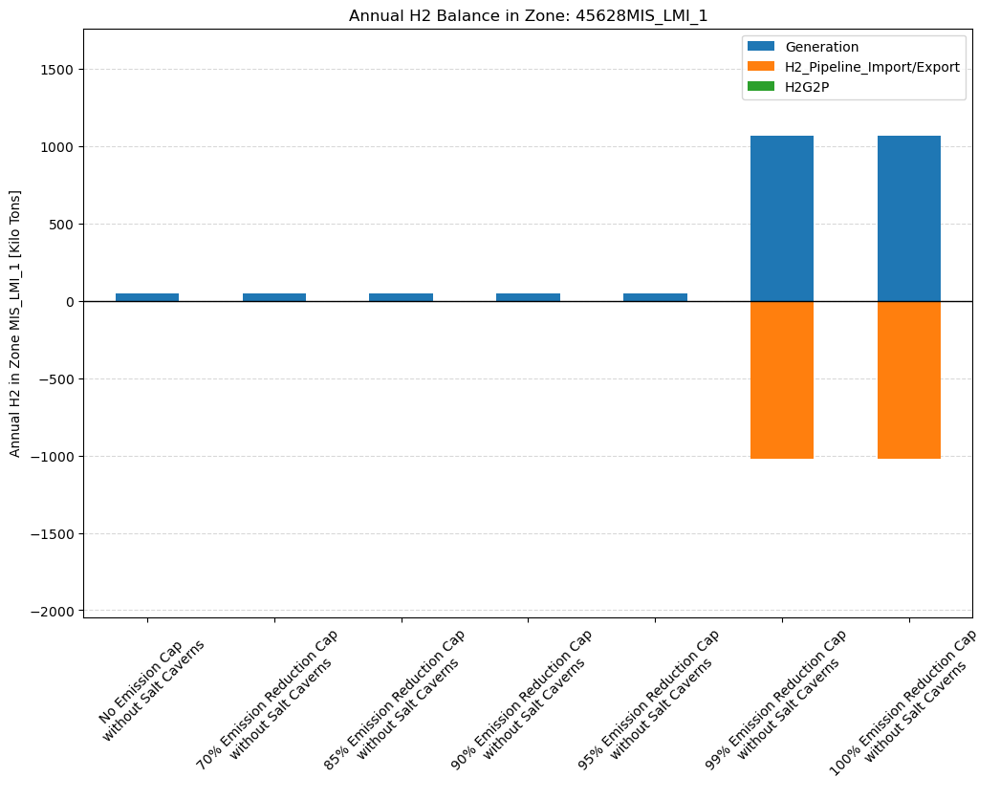

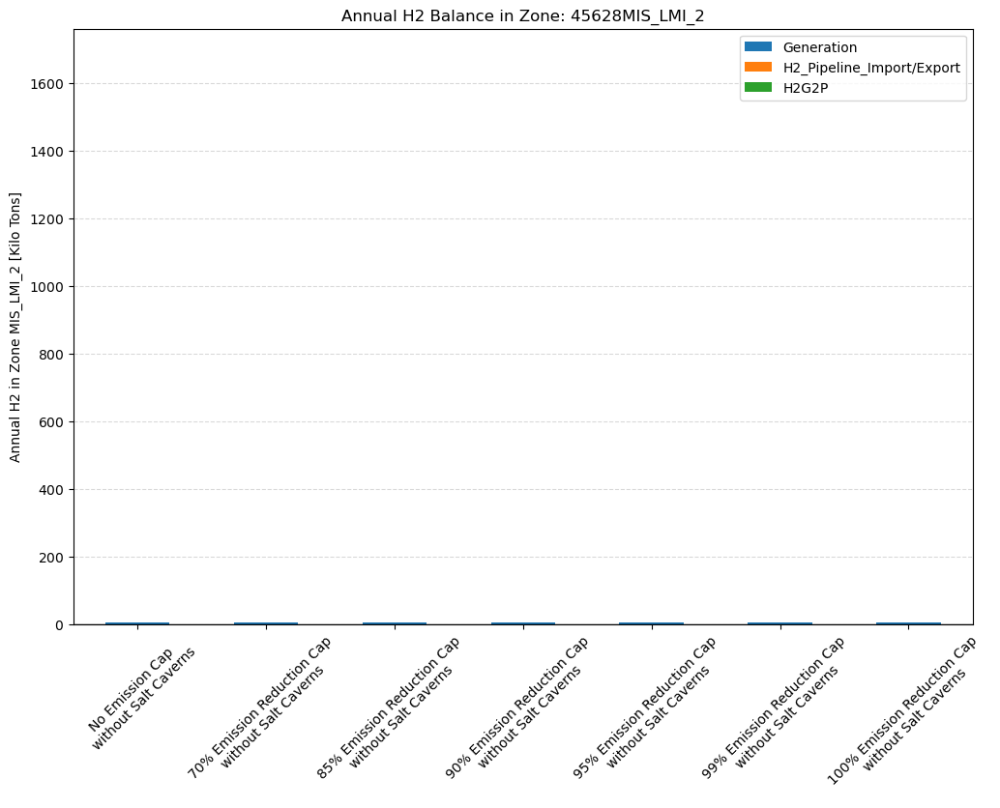

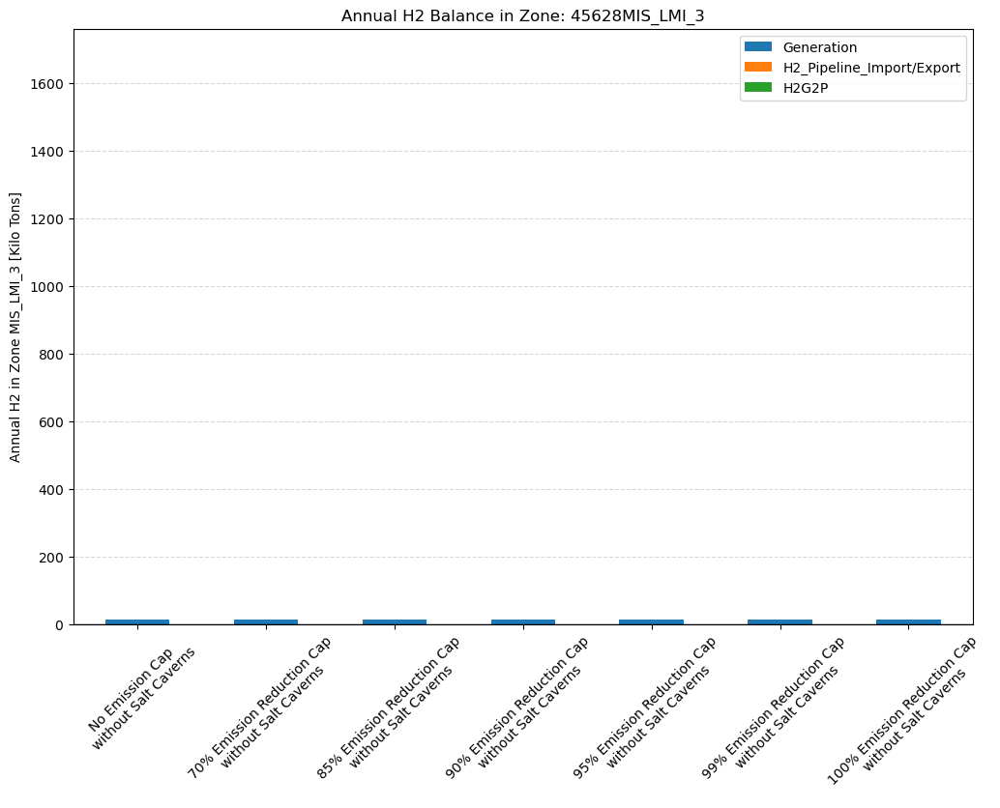

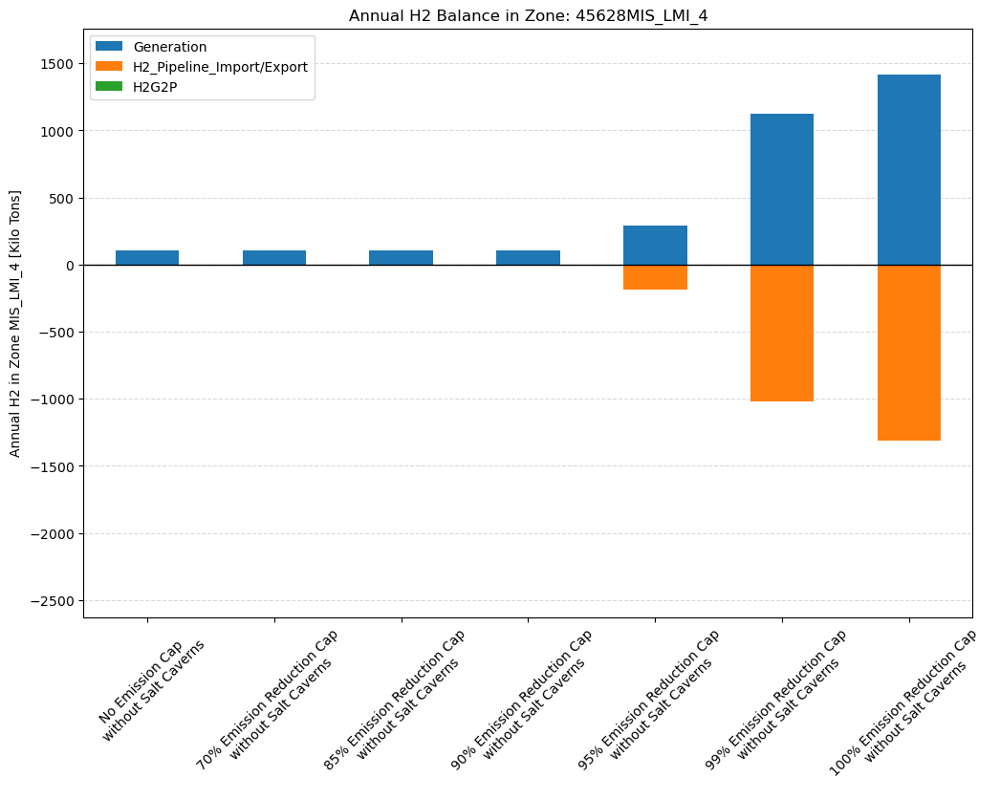

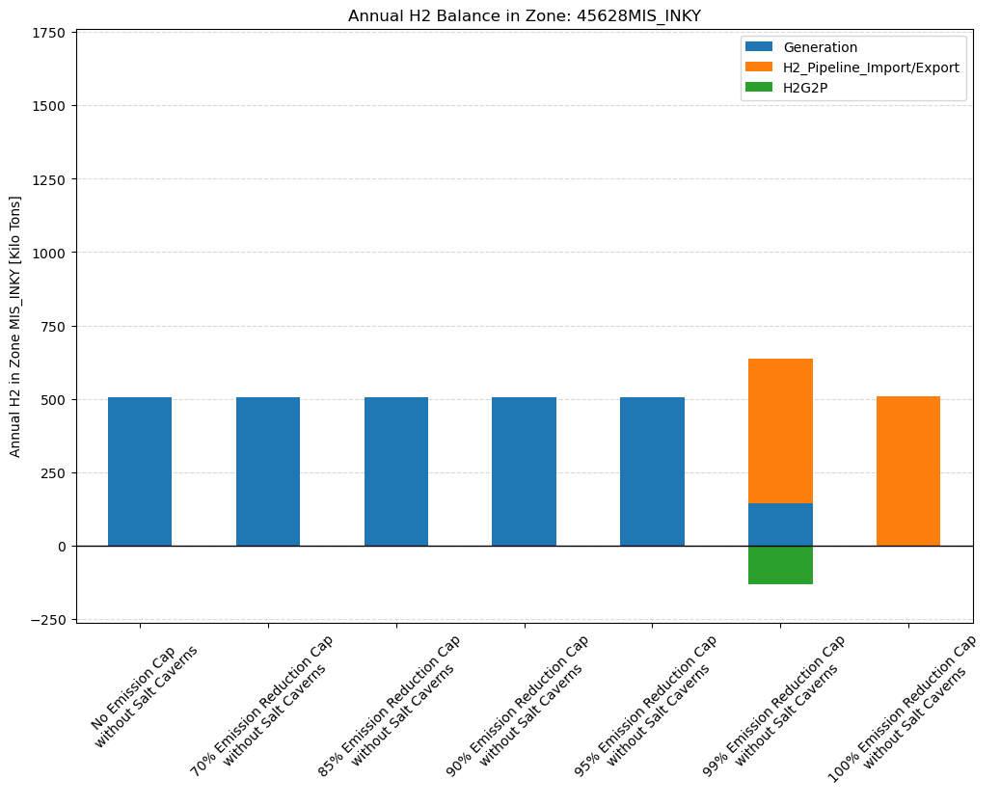

...

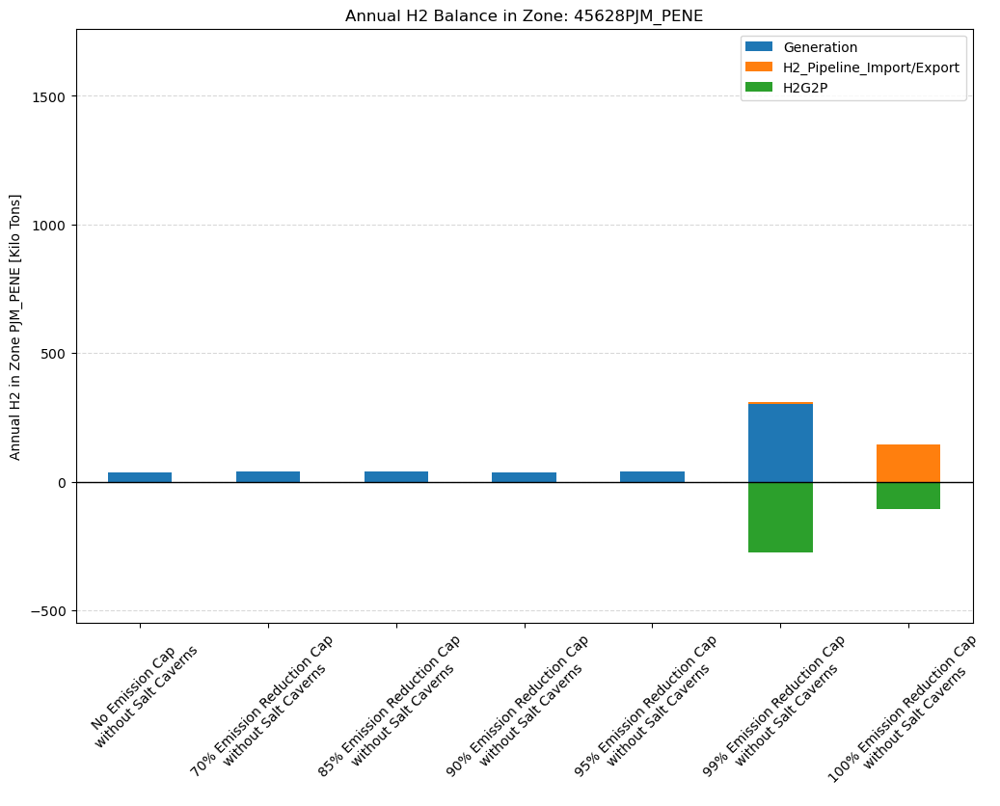

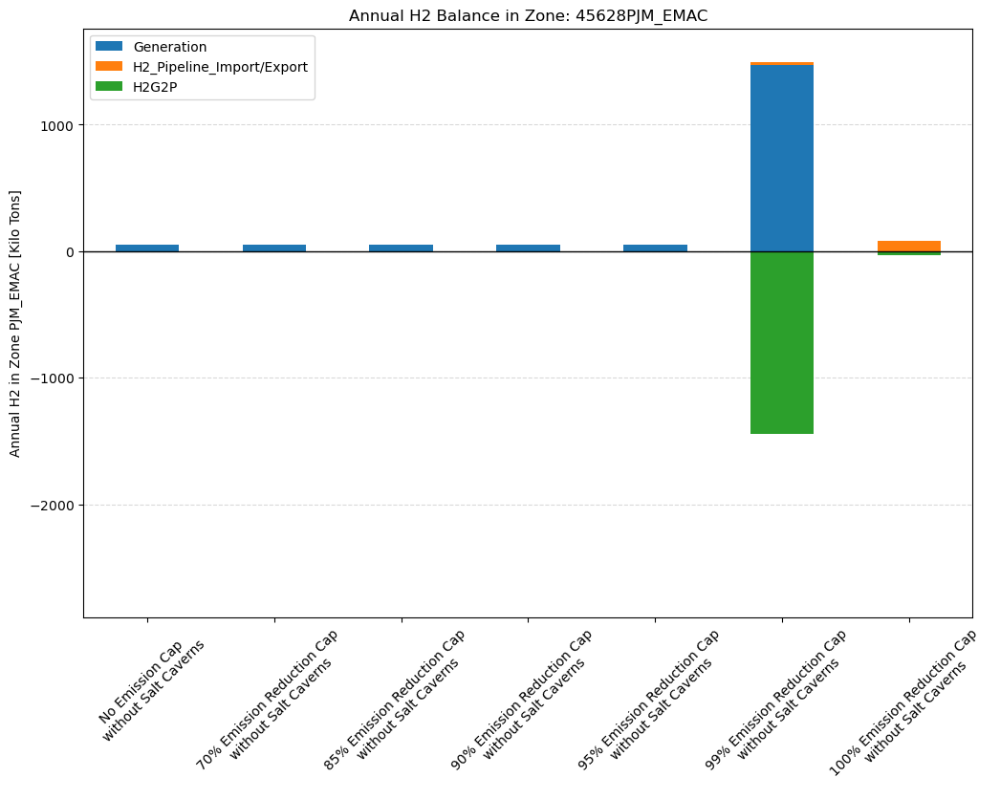

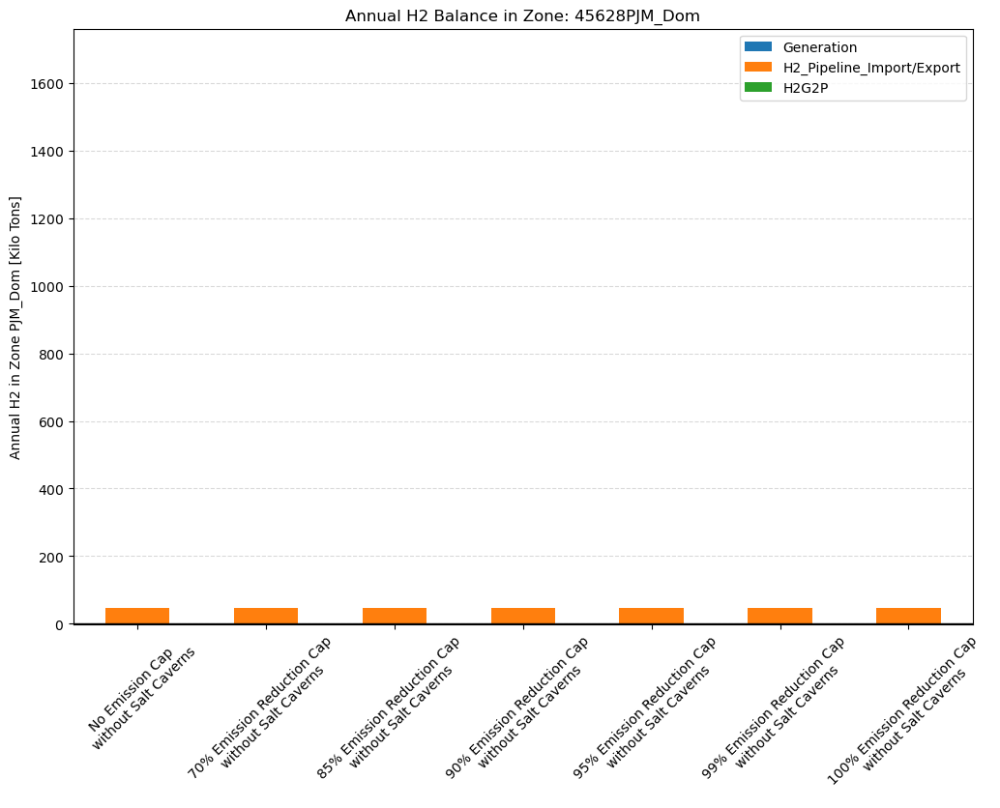

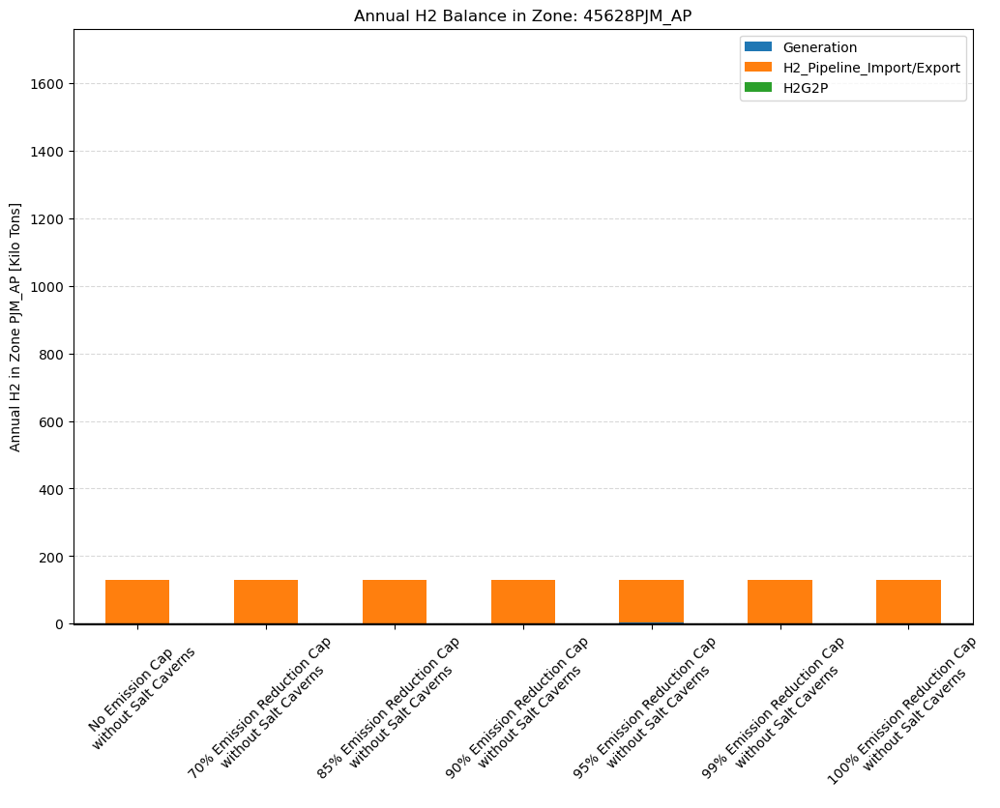

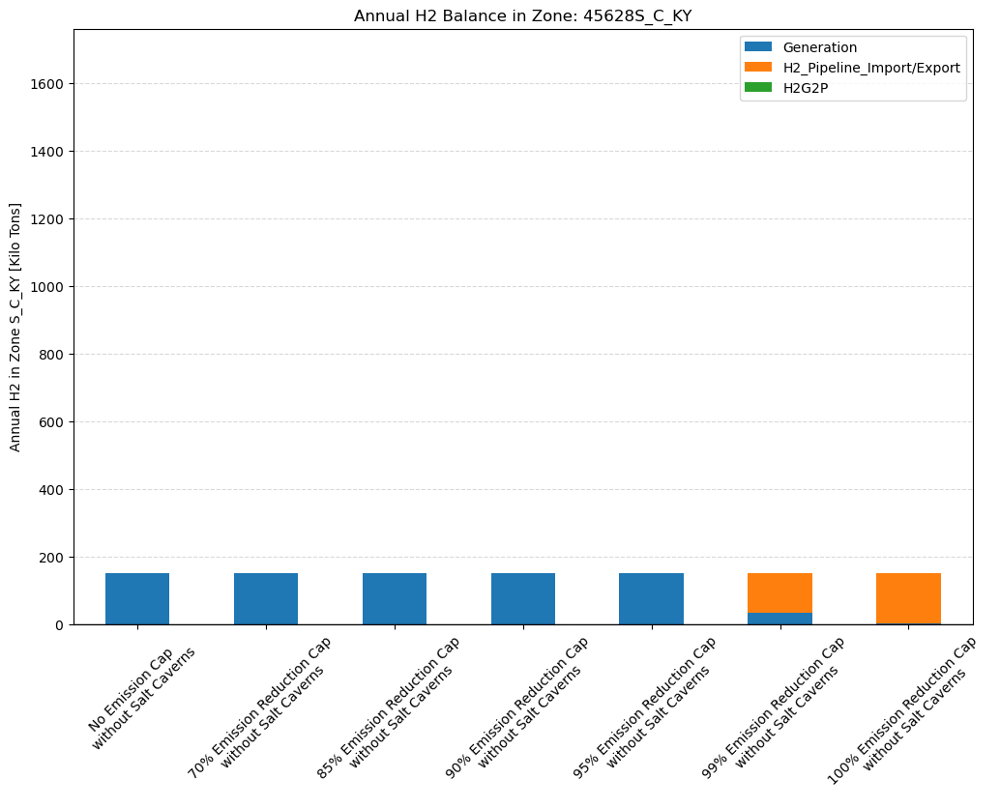

[[...],
 [...],
 [...],
 [...],
 [...],
 [...],
 [...],
 [...],
 [...],
 [...],
 [...],
 [...],
 [...],
 [...],
 [...]]

In [1348]:
h2_zones_dict_no_caverns = h2_balance_zones_dict(scenarios_no_caverns)
multiple_zone_barchart_h2_balance(dataframes_dict=h2_zones_dict_no_caverns, scenarios=scenarios_no_caverns, zones=zones)

#### With Caverns

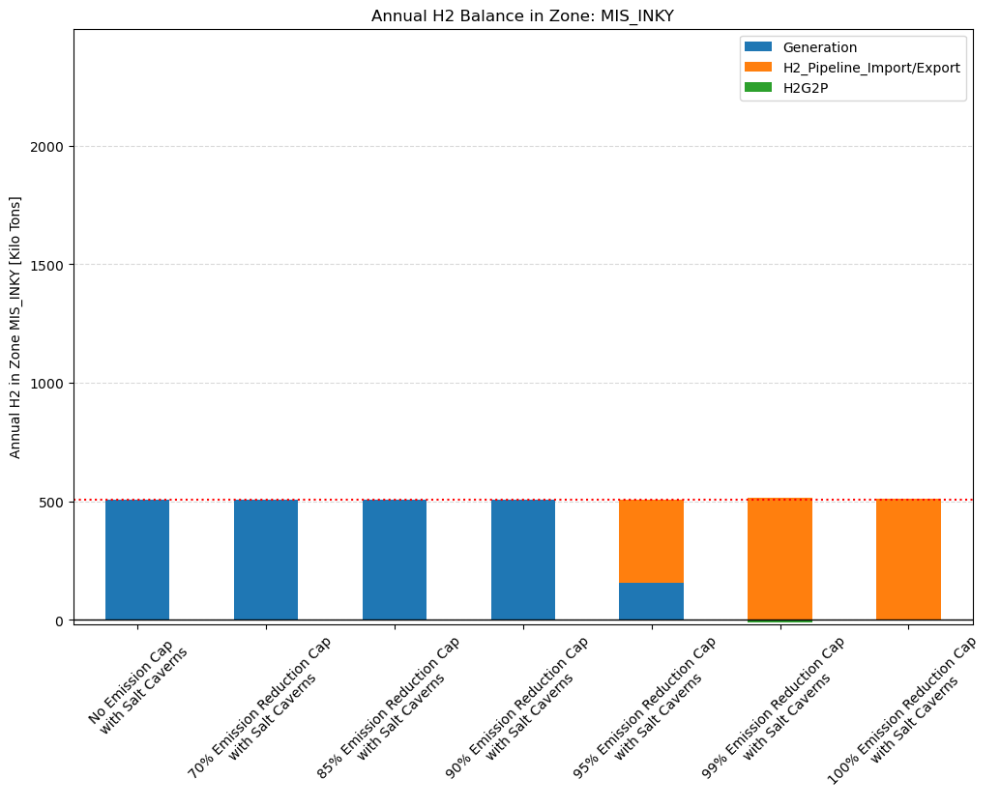

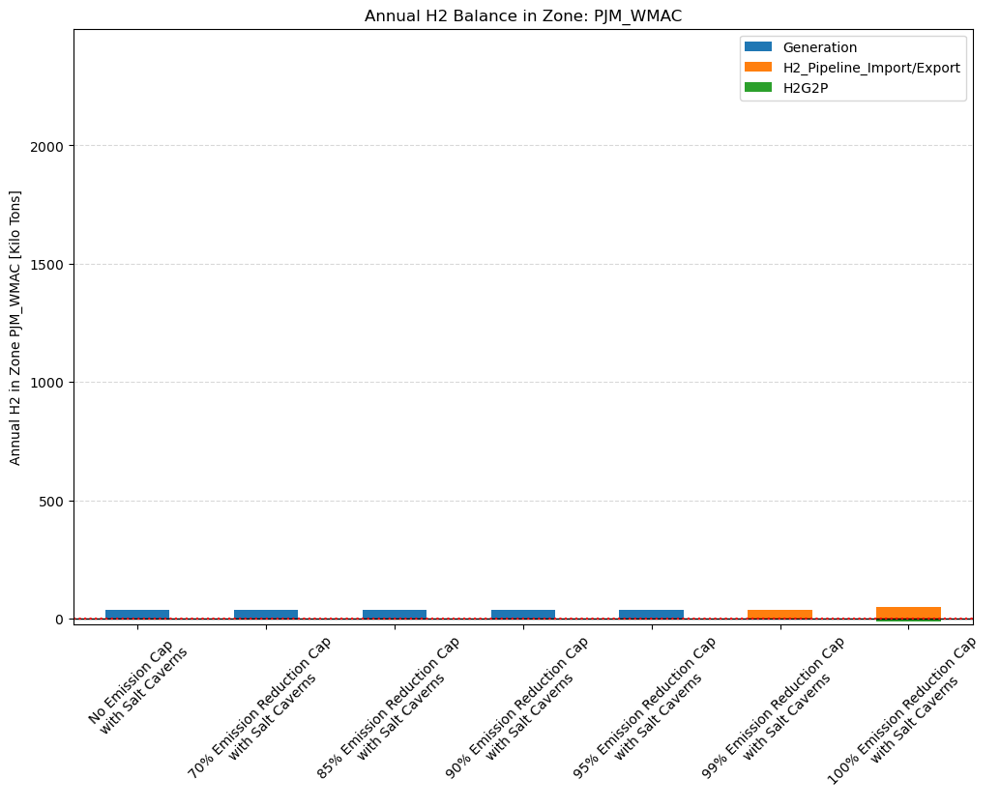

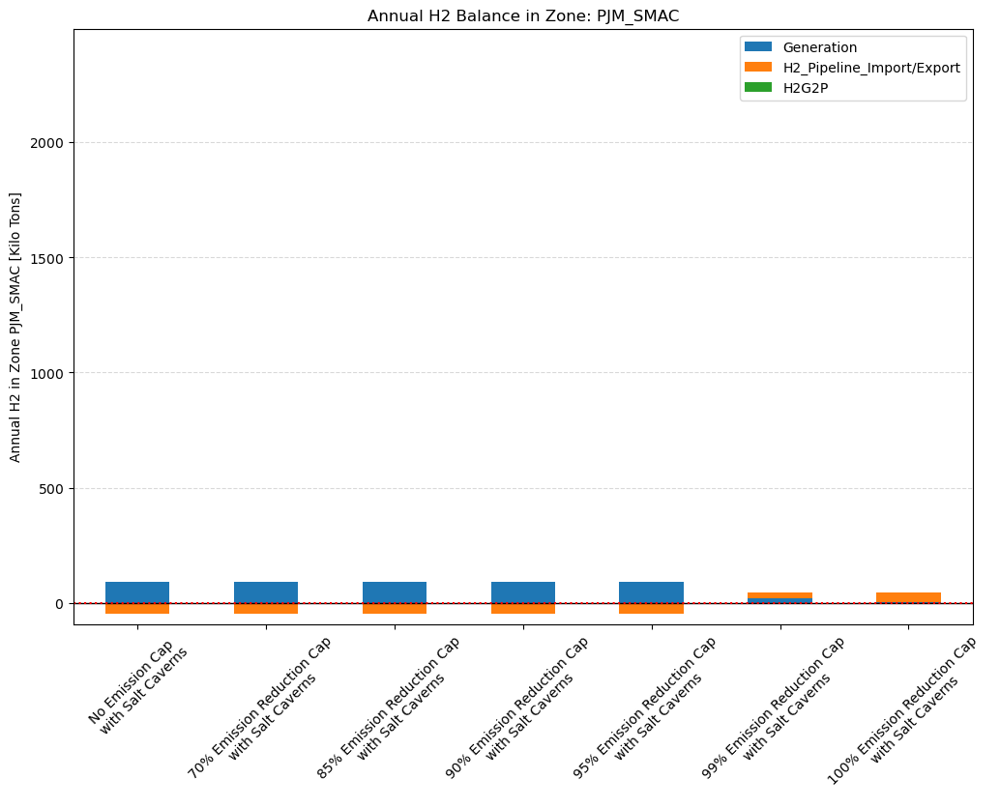

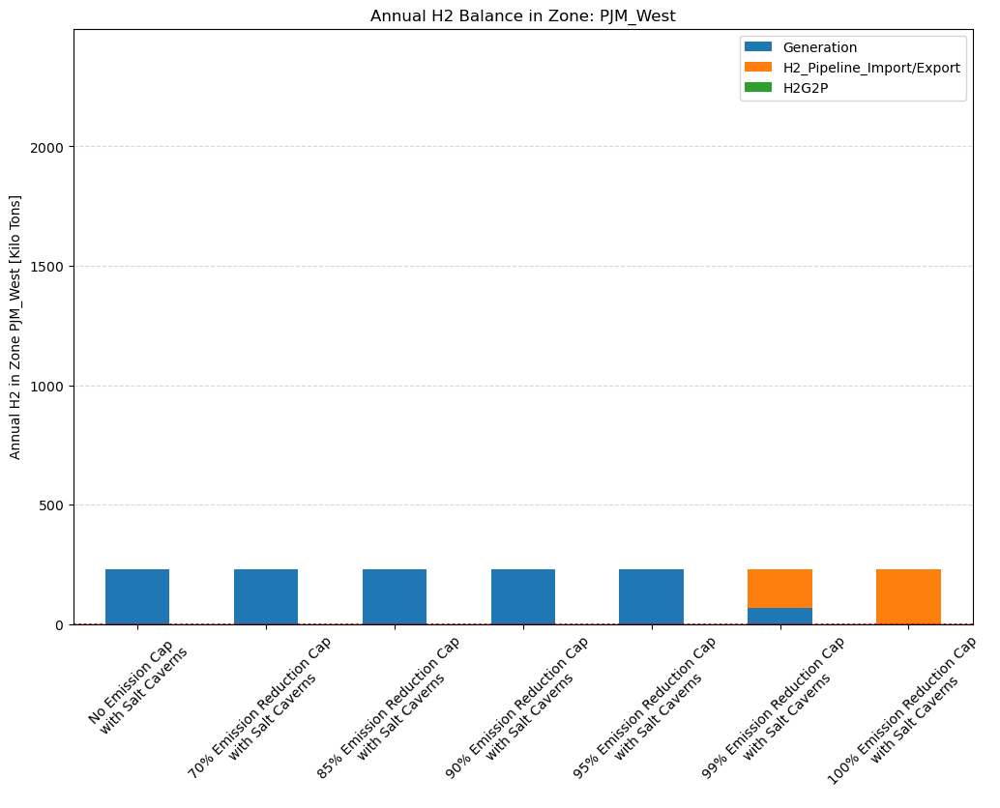

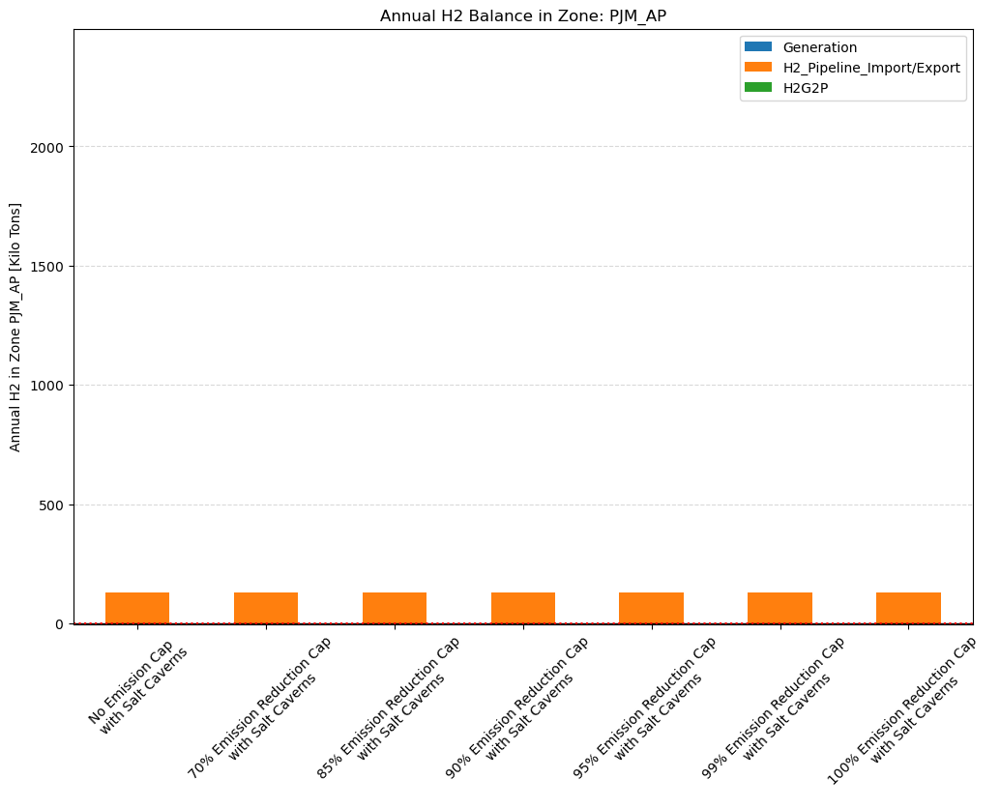

...

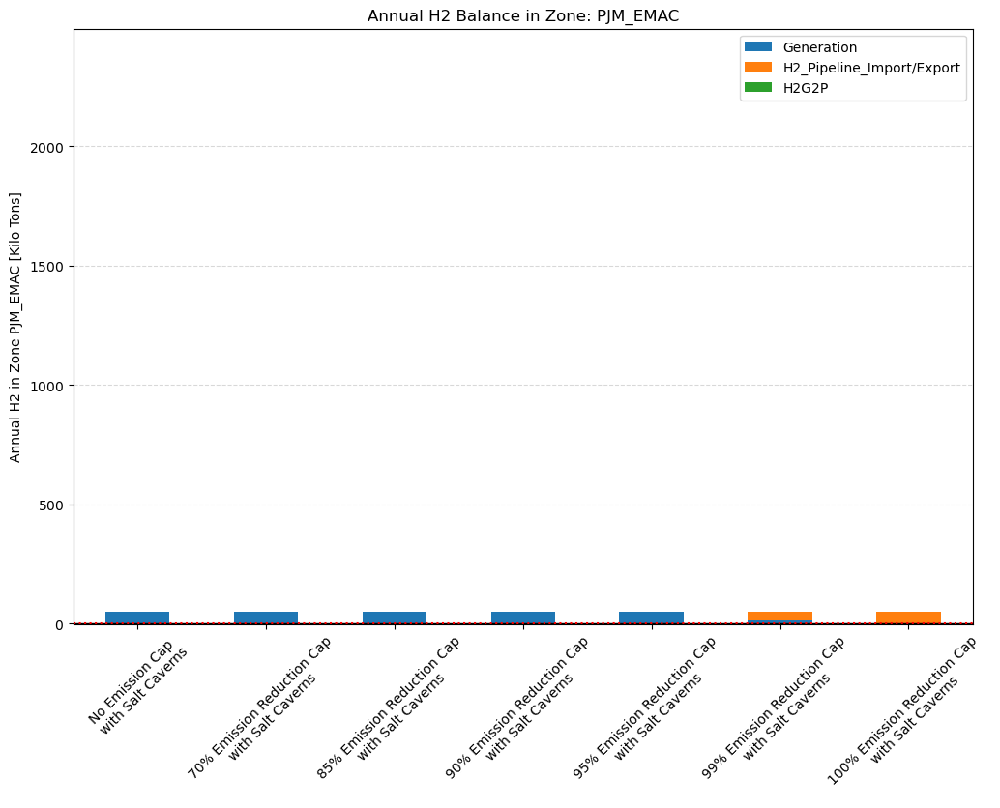

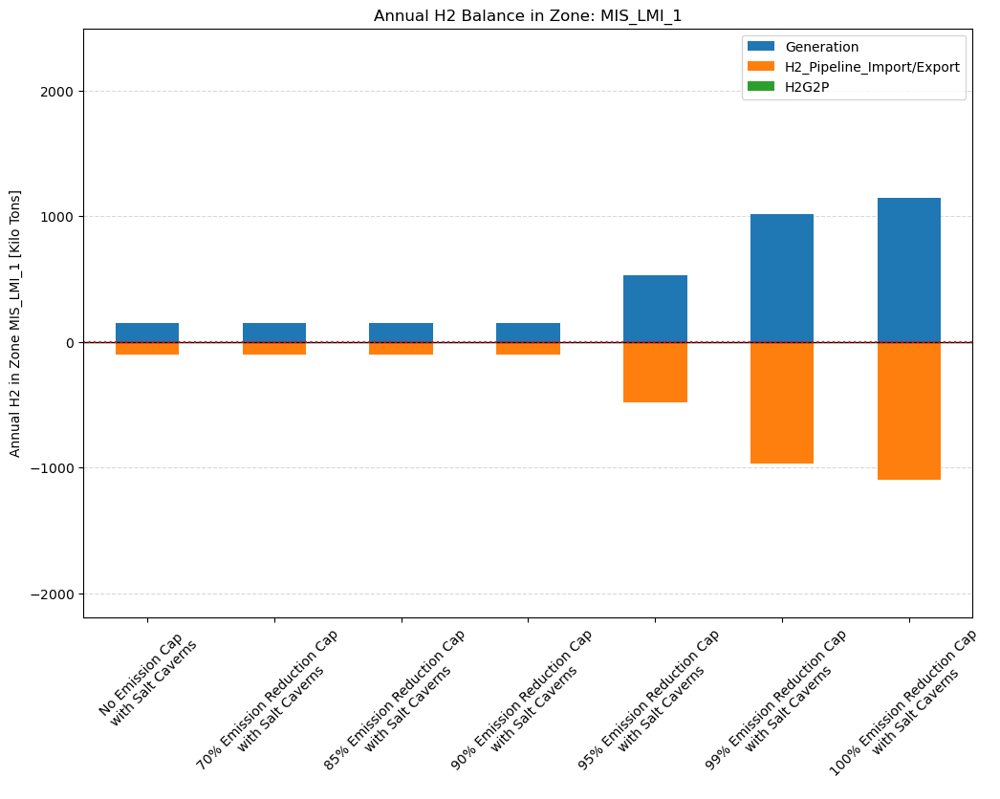

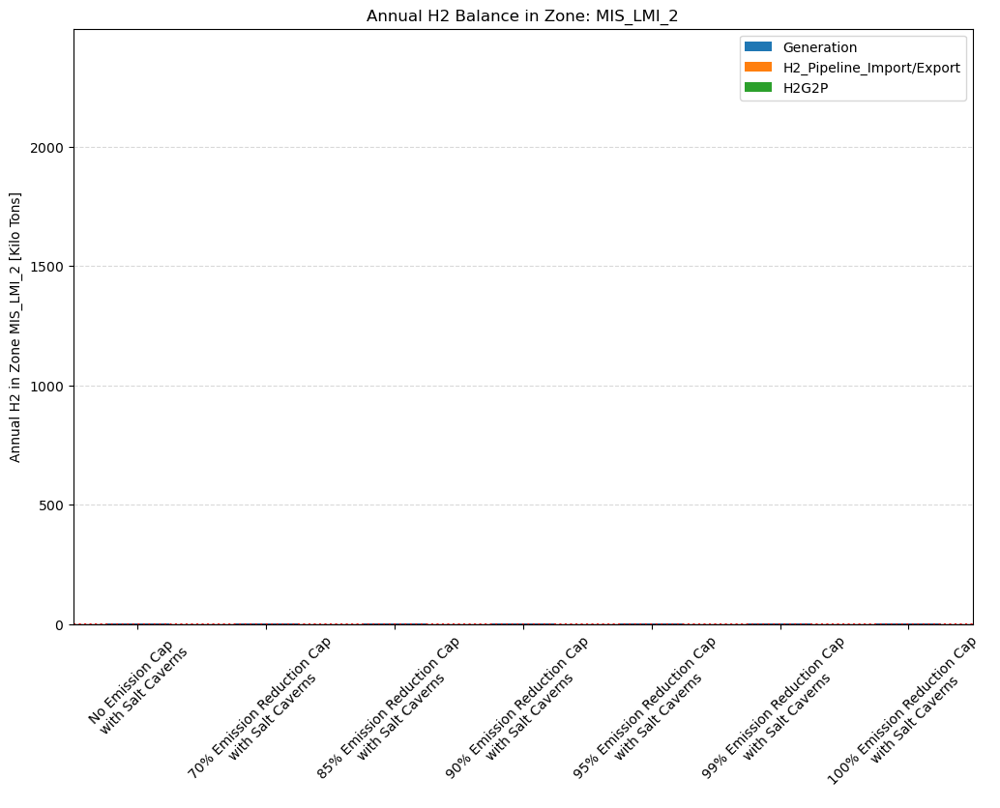

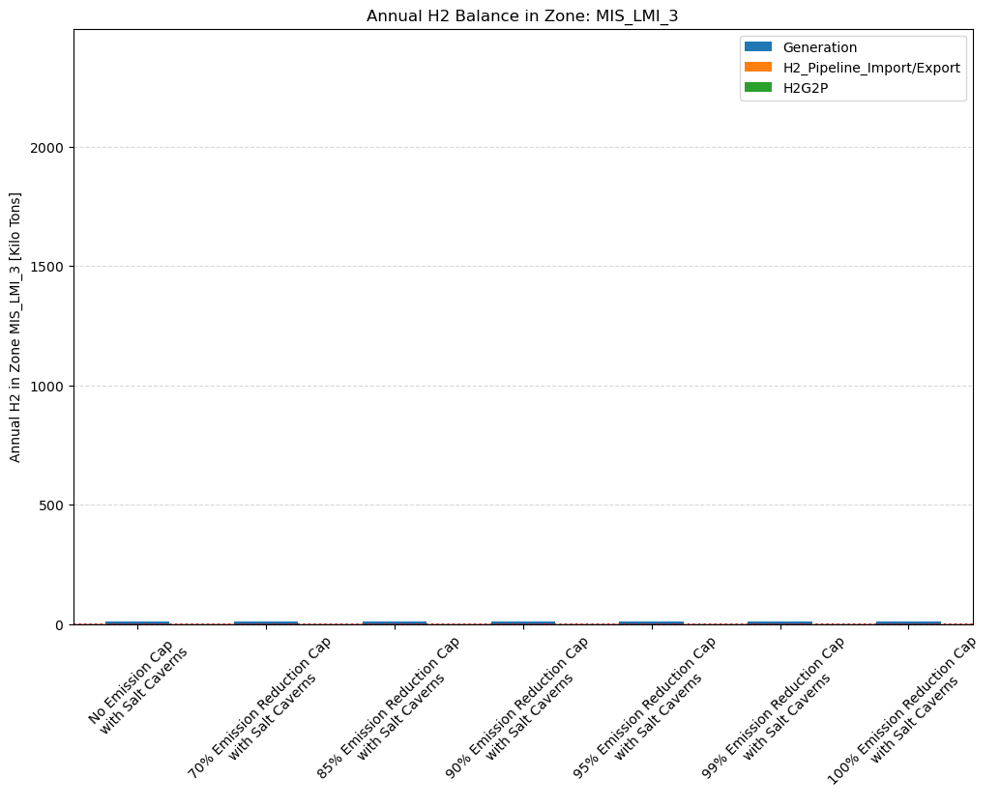

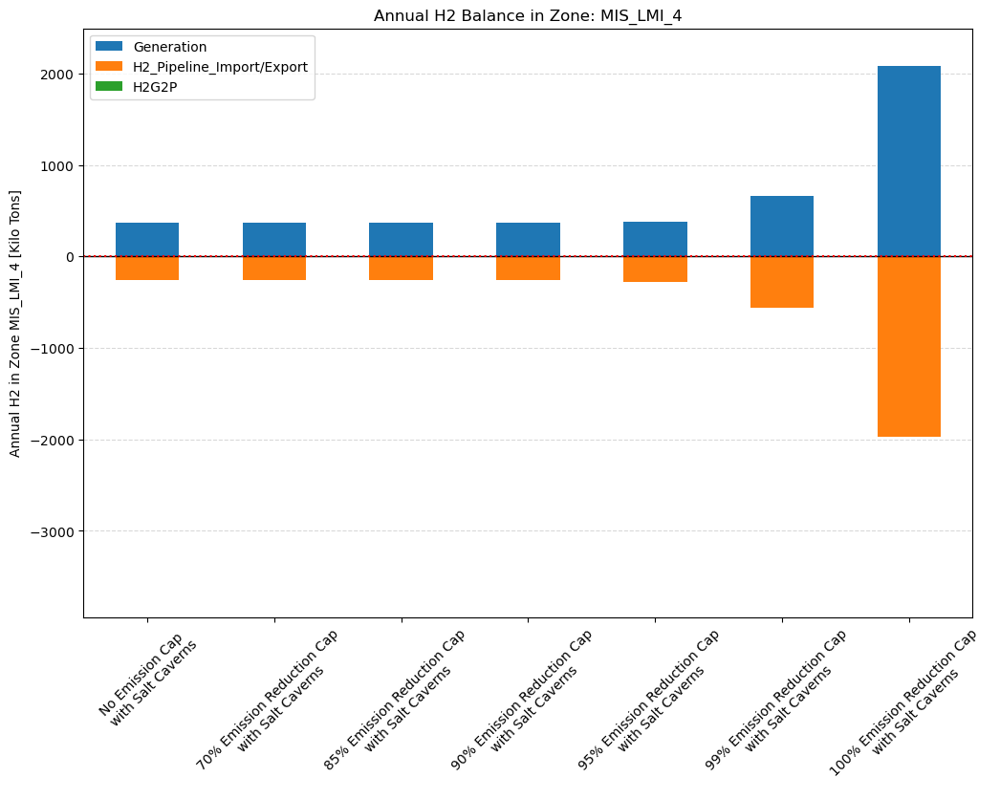

[[...],
 [...],
 [...],
 [...],
 [...],
 [...],
 [...],
 [...],
 [...],
 [...],
 [...],
 [...],
 [...],
 [...],
 [...]]

In [41]:
h2_zones_dict_with_caverns = h2_balance_zones_dict(scenarios_with_caverns)
multiple_zone_barchart_h2_balance(dataframes_dict=h2_zones_dict_with_caverns, scenarios=scenarios_with_caverns, zones=zones)

#### With Cavern No Above Ground Storage

In [ ]:
h2_zones_dict_no_above_ground = h2_balance_zones_dict(scenarios_no_above_ground_storage)
multiple_zone_barchart_h2_balance(dataframes_dict=h2_zones_dict_no_above_ground, scenarios=scenarios_no_above_ground_storage, zones=zones)

#### Comparison With Caverns vs Without Caverns (With Above Ground Storage)

In [ ]:
difference_dict = {}

h2_zones_dict_with_caverns = h2_balance_zones_dict(scenarios_with_caverns)
h2_zones_dict_no_caverns = h2_balance_zones_dict(scenarios_no_caverns)


for zone in zones:
    for s in scenarios_comparison:
        split_s = s.split('_')
        no_caverns_scenarios = '_'.join(split_s[:3] + ['no_caverns'] + split_s[3:])
        with_caverns_scenarios = '_'.join(split_s[:3] + ['with_caverns'] + split_s[3:])

        difference_dict[zone,s] =  h2_zones_dict_with_caverns[zone,with_caverns_scenarios] - h2_zones_dict_no_caverns[zone,no_caverns_scenarios]


multiple_zone_barchart_h2_balance(dataframes_dict=difference_dict, scenarios=scenarios_comparison, zones=zones, load_data=False)

#### Comparison With AGS vs Without AGS (With Caverns)

In [ ]:
# ABOVE GROUND WITH CAVERNS VS WITHOUT ABOVE GROUND

difference_dict = {}

for zone in zones:
    for s in scenarios_comparison:
        split_s = s.split('_')
        
        # Modify the construction of the scenario names
        with_caverns_scenarios = '_'.join(split_s[:3] + ['with_caverns'] + split_s[3:])
        no_above_ground_storage_scenarios = '_'.join(split_s[:3] + ['no_above_ground_storage'] + split_s[3:])

        # Update the data fetching from the dictionaries
        difference_dict[zone,s] = h2_zones_dict_with_caverns[zone,with_caverns_scenarios] - h2_zones_dict_no_above_ground[zone,no_above_ground_storage_scenarios]


multiple_zone_barchart_h2_balance(dataframes_dict=difference_dict, scenarios=scenarios_comparison, zones=zones, load_data=False)


In [ ]:
'''
scenarios_no_caverns = ['PJM_with_MI_no_caverns_0_red',
                        'PJM_with_MI_no_caverns_70_red',
                        'PJM_with_MI_no_caverns_85_red',
                        'PJM_with_MI_no_caverns_90_red',
                        'PJM_with_MI_no_caverns_95_red',
                        'PJM_with_MI_no_caverns_99_red',
                        'PJM_with_MI_no_caverns_100_red']
 
scenarios_with_caverns =  ['PJM_with_MI_with_caverns_0_red',
                            'PJM_with_MI_with_caverns_70_red',
                            'PJM_with_MI_with_caverns_85_red',
                            'PJM_with_MI_with_caverns_90_red',
                            'PJM_with_MI_with_caverns_95_red',
                            'PJM_with_MI_with_caverns_99_red',
                            'PJM_with_MI_with_caverns_100_red']


scenarios_no_above_ground_storage = ['PJM_with_MI_no_above_ground_storage_0_red',
                                    'PJM_with_MI_no_above_ground_storage_70_red',
                                    'PJM_with_MI_no_above_ground_storage_85_red',
                                    'PJM_with_MI_no_above_ground_storage_90_red',
                                    'PJM_with_MI_no_above_ground_storage_95_red',
                                    'PJM_with_MI_no_above_ground_storage_99_red',
                                    'PJM_with_MI_no_above_ground_storage_100_red']
'''

# Spatial Map Plots

## IPM Map Plot

In [618]:
import geopandas as gpd
import math
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Rectangle
import matplotlib.patches as mpatches
from matplotlib.collections import PatchCollection
from matplotlib.patches import FancyArrowPatch
from matplotlib.patches import FancyArrow
import matplotlib.colors as mcolors

import networkx as nx
from shapely.geometry import LineString, Point
from sklearn.preprocessing import MinMaxScaler


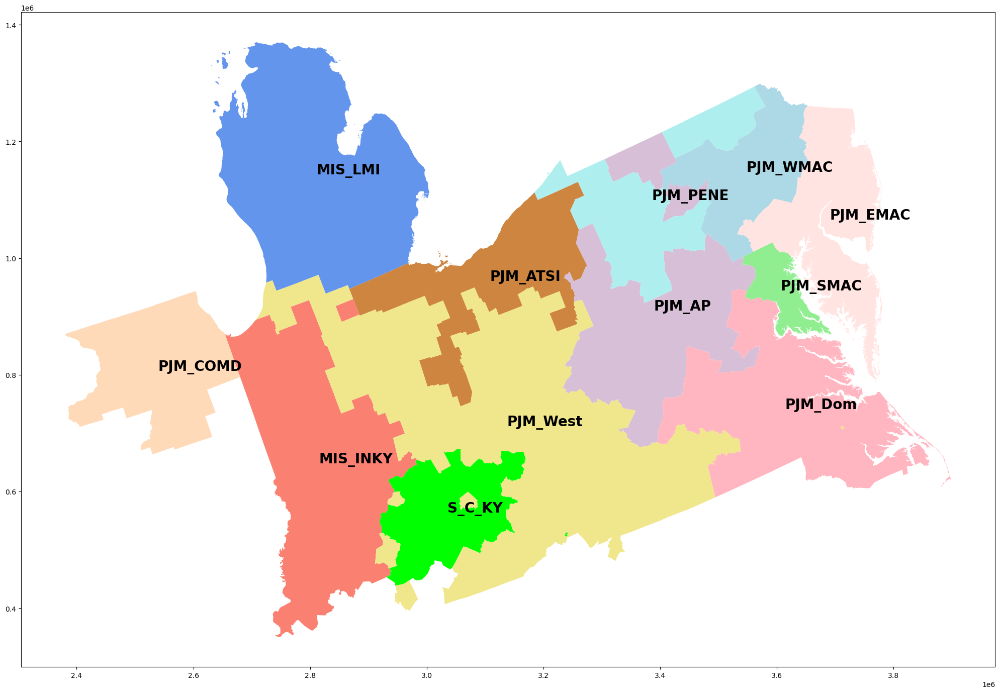

<Figure size 640x480 with 0 Axes>

In [48]:
colors_IPM_zones = {
    "MIS_INKY": "salmon",
    "PJM_WMAC": "lightblue",
    "PJM_SMAC": "lightgreen",
    "PJM_West": "khaki",
    "PJM_AP": "thistle",
    "PJM_COMD": "peachpuff",
    "PJM_ATSI": "peru",
    "PJM_Dom": "lightpink",
    "PJM_PENE": "paleturquoise",
    "S_C_KY": "lime",
    "PJM_EMAC": "mistyrose",
    "MIS_LMI": "cornflowerblue"
}


def plot_IPM_zones_filtered(IPM_shapefile_path='ipm_v6_regions', zones=zones, colors=colors_IPM_zones):
    
    gdf = gpd.read_file(IPM_shapefile_path)
    gdf = gdf[gdf['IPM_Region'].isin(list(colors_IPM_zones.keys()))]

    # Define color map (you may want to adjust colors according to your preferences)

    # Create a new figure
    fig, ax = plt.subplots(1, 1, figsize=(25, 20)) # Change the size according to your needs

    # Loop over each row in the GeoDataFrame
    for index, row in gdf.iterrows():
        # Plot the zone with the color specified in the color map
        gdf[gdf["IPM_Region"] == row["IPM_Region"]].plot(color=colors_IPM_zones[row["IPM_Region"]], ax=ax)

        # Add a label at the centroid of the zone
        centroid = row["geometry"].centroid
        plt.text(centroid.x, centroid.y, str(row["IPM_Region"]), fontsize=20, fontweight='bold')

    # Display the plot
    plt.show()
    plt.savefig('plots_folder/Autosave_plots/IPM_Analyzed_Zones')


    
plot_IPM_zones_filtered()

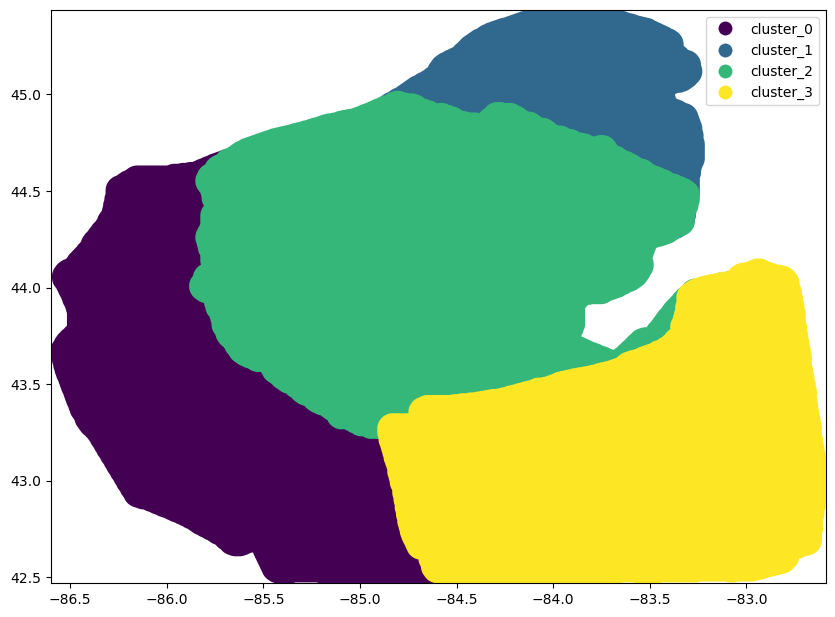

In [52]:
subregions_path = '/Users/lesarmstrong/Documents/GitHub/h2geostorage/cavern_optimization_scripts/clustering/MI_Geo_Sto'

# Read in the Shapefile with Geopandas
geo_df = gpd.read_file(subregions_path)

# Define the bounding box (minx, miny, maxx, maxy) for Michigan based on the geo_df
minx, miny, maxx, maxy = geo_df.total_bounds

# Plot the Shapefile with different colors for each region
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Plot the MI subregions and set the plot limits to the bounding box of Michigan
geo_df.plot(ax=ax, column='MI_Geo_Sto', legend=True, cmap='viridis', legend_kwds={'bbox_to_anchor': (1, 1)})

# Set the plot limits to the bounding box of Michigan
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

plt.show()

In [650]:
IPM_shapefile_path='ipm_v6_regions'
MI_shapefile_path = 'MI_Geo_Sto'
scenario = 'PJM_with_MI_subregions_with_caverns_99_red'

# Define the colors for the zones
colors_IPM_zones = {
    "MIS_INKY": "salmon",
    "PJM_WMAC": "lightblue",
    "PJM_SMAC": "lightgreen",
    "PJM_West": "khaki",
    "PJM_AP": "thistle",
    "PJM_COMD": "peachpuff",
    "PJM_ATSI": "peru",
    "PJM_Dom": "lightpink",
    "PJM_PENE": "paleturquoise",
    "S_C_KY": "lime",
    "PJM_EMAC": "mistyrose",
    "MIS_LMI": "cornflowerblue",
    "MIS_LMI_1": "skyblue",
    "MIS_LMI_2": "slateblue",
    "MIS_LMI_3": "cadetblue",
    "MIS_LMI_4": "dodgerblue"
}
print(scenario)


PJM_with_MI_subregions_with_caverns_99_red


## Storage Capacity Map Plot

Tech_Type       Zone  Above_ground_storage  Salt_cavern_storage
0           MIS_INKY              0.081974                  NaN
1          MIS_LMI_1              0.022919          4607.251023
2          MIS_LMI_2              0.021580            29.016656
3          MIS_LMI_3              0.021987            71.458457
4          MIS_LMI_4              0.021881          4823.781222
5             PJM_AP              0.097445                  NaN
6           PJM_ATSI              0.114473                  NaN
7           PJM_COMD              0.102467                  NaN
8            PJM_Dom              0.058333                  NaN
9           PJM_EMAC              0.064610                  NaN
10          PJM_PENE              0.168423                  NaN
11          PJM_SMAC              0.045658                  NaN
12          PJM_WMAC              0.087808                  NaN
13          PJM_West              0.051315                  NaN
14            S_C_KY              0.1020

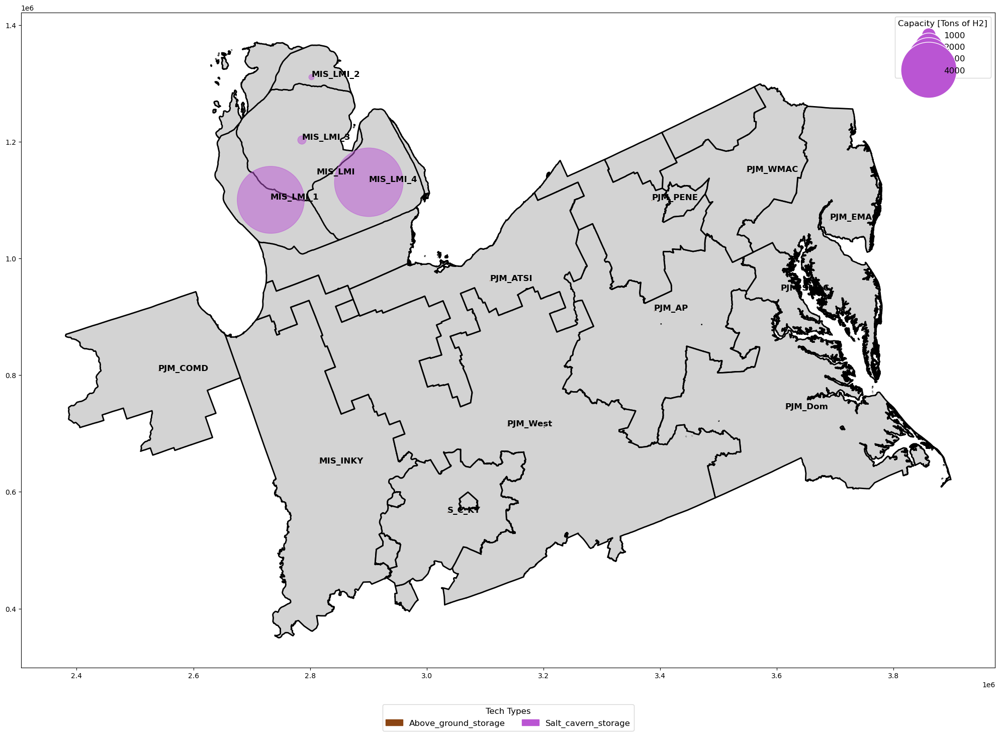

In [616]:
from IPython.core.debugger import set_trace

title = "H2 Storage Capacity"
def h2_storage_capacity_maped(scenario, title=title, units=2.0):
    #debugging
    #set_trace()
    units=2.0 # Tons h2

    df_main = pd.DataFrame()


    df = h2_capacity_analysis(scenario, aggregate=False)
    # Changes zone numbers to zone name
    df['Zone'] = df['Zone'].map(zone_number_dict)
    df = df[['Tech_Type', 'EndEnergyCap', 'Zone']]
    df = df[df['Tech_Type'] != 'Total']
    # Assuming df is your DataFrame
    df = df[df['Tech_Type'].isin(['Salt_cavern_storage', 'Above_ground_storage'])]
    df = df.rename(columns={'EndEnergyCap': 'H2_storage_capacity'})                     

    # Pivot the DataFrame to have each tech type as a column
    df_pivot = df.pivot(index='Zone', columns='Tech_Type', values='H2_storage_capacity')
    
    # Reset the index
    df_pivot = df_pivot.reset_index()
    df  = df_pivot
    
    return(df)


import numpy as np

def generate_round_numbers(min_value, max_value, N):
    # Calculate the difference between max and min values
    diff = max_value - min_value

    # Calculate the step
    step = diff / (N - 1)

    # Round the step to the nearest power of 10
    step = 10**np.round(np.log10(step))

    # Generate the evenly spread round numbers excluding zero
    round_numbers = [min_value + step*i for i in range(N) if (min_value + step*i) != 0]

    # Round the numbers to the nearest step excluding zero
    round_numbers = [np.round(num / step) * step for num in round_numbers if np.round(num / step) * step != 0]
    print(round_numbers)
    
    
    n = math.ceil(max_value / round_numbers[0]) - N + 1
    print(n)
    
    return round_numbers



def load_and_process_shapefiles(IPM_shapefile_path, MI_shapefile_path, colors):
    # Load the IPM regions Shapefile
    gdf = gpd.read_file(IPM_shapefile_path)

    # Filter out the MIS_LMI zone
    gdf = gdf[gdf['IPM_Region'].isin(list(colors.keys()))]

    # Load the MI_Geo_Sto Shapefile
    mi_gdf = gpd.read_file(MI_shapefile_path)

    # Replace the names of the clusters
    mi_gdf = mi_gdf.replace({'MI_Geo_Sto': {'cluster_0': 'MIS_LMI_1', 'cluster_1': 'MIS_LMI_2', 'cluster_2': 'MIS_LMI_3', 'cluster_3': 'MIS_LMI_4'}})
    mi_gdf = mi_gdf.rename(columns={'MI_Geo_Sto': 'IPM_Region'})

    # Set the CRS of the MI Shapefile to NAD83
    mi_gdf.crs = "EPSG:4269"

    # Check the CRS of both Shapefiles
    crs_IPM = gdf.crs
    crs_MI = mi_gdf.crs

    mi_gdf = mi_gdf.to_crs(crs_IPM)

    # Append the MI_Geo_Sto GeoDataFrame to the IPM regions GeoDataFrame
    gdf = gdf.append(mi_gdf)
    
    gdf.to_file("IPM_with_MI_subregions.shp")
    return gdf

def plot_zones(gdf, colors, ax, fill_map=True):
    # Loop over each row in the GeoDataFrame
    for index, row in gdf.iterrows():
        if fill_map:
            # Plot the zone with the color specified in the color map
            gdf[gdf["IPM_Region"] == row["IPM_Region"]].plot(color=colors[row["IPM_Region"]], ax=ax)
        else:
            # Plot the outline of the zone
            gdf[gdf["IPM_Region"] == row["IPM_Region"]].plot(color='lightgray', edgecolor='black', linewidth=2, ax=ax)

        # Add a label at the centroid of the zone
        centroid = row["geometry"].centroid
        plt.text(centroid.x, centroid.y, str(row["IPM_Region"]), fontsize=12, fontweight='bold')

def plot_storage(gdf, storage_df, H2_colors, circle_size_multiplier, ax):
    # Get unique tech types present in the DataFrame
    # Create a list of columns to drop
    columns_to_drop = ['Zone']
    # Check if 'Total_Capacity' exists in the DataFrame's columns
    if 'Total_Capacity' in storage_df.columns:
        columns_to_drop.append('Total_Capacity')

    # Get unique tech types present in the DataFrame after dropping specified columns
    unique_tech_types = storage_df.columns.drop(columns_to_drop)

    # Loop over each unique Tech_Type in the storage DataFrame
    for tech_type in unique_tech_types:
        # Filter the DataFrame for the current Tech_Type
        df_filtered = storage_df[[tech_type, 'Zone']].dropna()

        # Loop over each row in the filtered DataFrame
        for index, row in df_filtered.iterrows():
            # Get the corresponding row in the GeoDataFrame
            gdf_row = gdf[gdf["IPM_Region"] == row["Zone"]]

            if not gdf_row.empty:
                # Get the centroid of the zone
                centroid = gdf_row.iloc[0]["geometry"].centroid

                # Plot a circle at the centroid with an area proportional to the storage capacity
                # Use the color specified in the color map for the current Tech_Type
                ax.scatter(centroid.x, centroid.y, s=row[tech_type] * circle_size_multiplier, color=H2_colors[tech_type], alpha=0.5)

def create_legends(storage_df, H2_colors, circle_size_multiplier, ax, legend_size_multiplier=1):
    # Get unique tech types present in the DataFrame
    unique_tech_types = storage_df.columns.drop('Zone')

    # Add first legend: color
    legend_elements = [Patch(facecolor=H2_colors[tech_type], edgecolor=H2_colors[tech_type], label=tech_type) for tech_type in unique_tech_types]
    leg1 = ax.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=len(unique_tech_types), title='Tech Types', fontsize=12*legend_size_multiplier, title_fontsize=12*legend_size_multiplier)

    # Calculate representative values for storage capacities
    min_capacity = storage_df.drop(columns='Zone').min().min()
    max_capacity = storage_df.drop(columns='Zone').max().max()

    # Generate round numbers for the legend labels
    legend_labels = generate_round_numbers(min_capacity, max_capacity, N=5)

    # Add second legend: size
    # Skip the label if it's zero
    
    legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'{int(label)}', markerfacecolor='#BA55D3', markersize=10*circle_size_multiplier*(i+1)) for i, label in enumerate(legend_labels) if label != 0]
    leg2 = ax.legend(handles=legend_elements, loc='upper right', title='Capacity [Tons of H2]', fontsize=12*legend_size_multiplier, title_fontsize=12*legend_size_multiplier)
    
    # Manually add the first legend back
    ax.add_artist(leg1)
    
    return leg1, leg2

def plot_IPM_zones_filtered_updated(IPM_shapefile_path, MI_shapefile_path, colors, storage_df, title='',units=1, circle_size_multiplier=2, fill_map=True):
    # Load and process the shapefiles
    gdf = load_and_process_shapefiles(IPM_shapefile_path, MI_shapefile_path, colors)
    
    # Create a new figure
    fig, ax = plt.subplots(1, 1, figsize=(25, 20))

    # Plot the zones
    plot_zones(gdf, colors, ax, fill_map)

    # Plot the storage capacities
    plot_storage(gdf, storage_df, H2_colors, circle_size_multiplier, ax)

    # Create the legends
    leg1, leg2 = create_legends(storage_df, H2_colors, circle_size_multiplier, ax)

    # Display the plot
    plt.show()


# Replace 'df' with your actual DataFrame
df = h2_storage_capacity_maped(scenario, title=title, units=2.0)
print(df)
df.to_csv('h2_storage_capacity_df.csv')
plot_IPM_zones_filtered_updated(IPM_shapefile_path, subregions_path, colors_IPM_zones, units=2.0, storage_df=df, fill_map=False)


In [664]:
H2_colors
def h2_storage_capacity_maped(scenario, title=title, units=2.0):
    #debugging
    #set_trace()
    units=2.0 # Tons h2

    df_main = pd.DataFrame()

    # Interested Tech:
    tech = ['Salt_cavern_storage', 'Above_ground_storage']
    

    df = h2_capacity_analysis(scenario, aggregate=False)
    # Changes zone numbers to zone name
    df['Zone'] = df['Zone'].map(zone_number_dict)
    df = df[['Tech_Type', 'EndEnergyCap', 'Zone']]
    df = df[df['Tech_Type'] != 'Total']
    # Assuming df is your DataFrame
    df = df[df['Tech_Type'].isin(tech)]
    df = df.rename(columns={'EndEnergyCap': 'H2_storage_capacity'})                     

    # Pivot the DataFrame to have each tech type as a column
    df_pivot = df.pivot(index='Zone', columns='Tech_Type', values='H2_storage_capacity')
    
    # Reset the index
    df_pivot = df_pivot.reset_index()
    df_pivot['Total_Capacity'] = df_pivot.apply(pd.to_numeric, errors='coerce').sum(axis=1)
    for tech_type in tech:
        df_pivot[tech_type + '_proportion'] = df_pivot[tech_type] / df_pivot['Total_Capacity']
    #print(df_pivot)

    df  = df_pivot
    
    return(df, tech)

df, tech = h2_storage_capacity_maped(scenario)
df

Tech_Type,Zone,Above_ground_storage,Salt_cavern_storage,Total_Capacity,Salt_cavern_storage_proportion,Above_ground_storage_proportion
0,MIS_INKY,261.752957,NaN,261.752957,NaN,1.0
1,MIS_LMI_1,2640.790766,0.0,2640.790766,0.0,1.0
2,MIS_LMI_2,11.892866,0.0,11.892866,0.0,1.0
3,MIS_LMI_3,38.171080,0.0,38.171080,0.0,1.0
4,MIS_LMI_4,1671.152632,0.0,1671.152632,0.0,1.0
5,PJM_AP,158.468480,NaN,158.468480,NaN,1.0
6,PJM_ATSI,116.833577,NaN,116.833577,NaN,1.0
7,PJM_COMD,50.671926,NaN,50.671926,NaN,1.0
8,PJM_Dom,26.158229,NaN,26.158229,NaN,1.0
9,PJM_EMAC,15.564654,NaN,15.564654,NaN,1.0


   IPM_Region                                           geometry
9    MIS_INKY  MULTIPOLYGON (((2872957.275 757004.201, 287296...
11    MIS_LMI  MULTIPOLYGON (((2969916.943 993245.736, 296992...
29     PJM_AP  MULTIPOLYGON (((3540097.788 831467.204, 354004...
30   PJM_ATSI  MULTIPOLYGON (((3261835.422 1013040.136, 32618...
31   PJM_COMD  POLYGON ((2603204.844 943327.237, 2603304.422 ...
32    PJM_Dom  MULTIPOLYGON (((3883572.601 611525.234, 388355...
33   PJM_EMAC  MULTIPOLYGON (((3763560.527 778866.945, 376359...
34   PJM_PENE  MULTIPOLYGON (((3408962.385 1085516.571, 34089...
35   PJM_SMAC  MULTIPOLYGON (((3676783.701 871210.170, 367683...
36   PJM_West  MULTIPOLYGON (((3709979.209 711723.416, 371014...
37   PJM_WMAC  MULTIPOLYGON (((3539792.953 1054572.808, 35397...
38     S_C_KY  MULTIPOLYGON (((3236679.865 523756.293, 323669...
Tech_Type       Zone  Above_ground_storage  Salt_cavern_storage  \
0           MIS_INKY            261.752957                  NaN   
1          MIS_LMI_1 

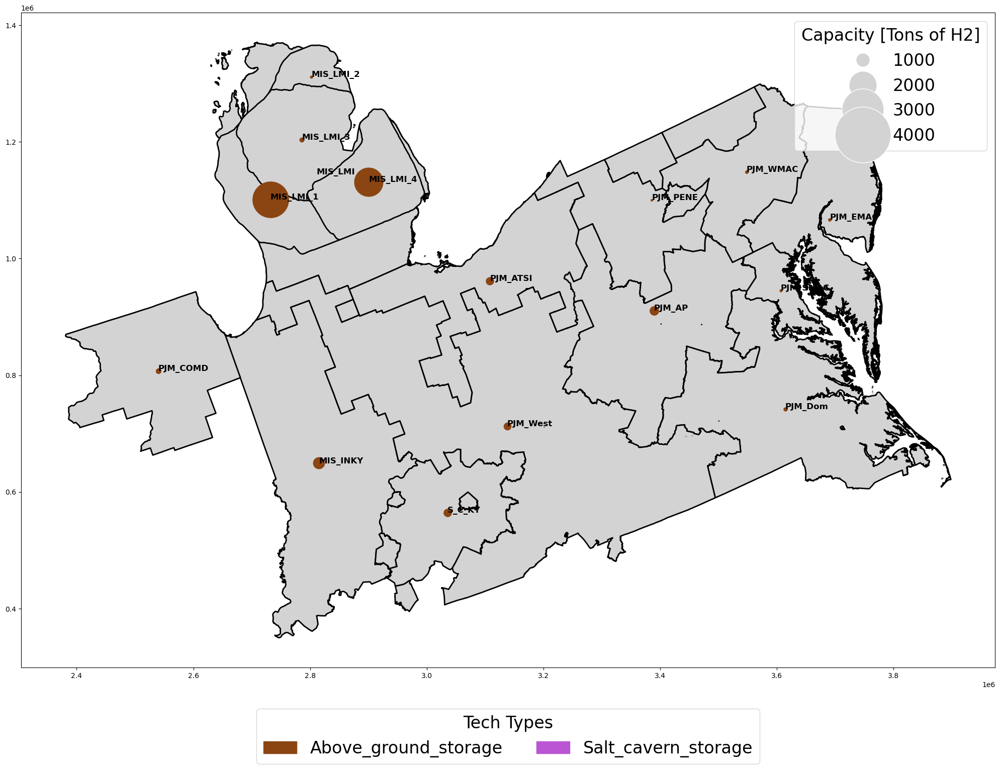

In [695]:
from IPython.core.debugger import set_trace

title = "H2 Storage Capacity"

# Source: https://stackoverflow.com/questions/56337732/how-to-plot-scatter-pie-chart-using-matplotlib
def draw_pie(dist, xpos, ypos, size, colors, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10,8))

    # for incremental pie slices
    cumsum = np.cumsum(dist)
    cumsum = cumsum/ cumsum[-1]
    pie = [0] + cumsum.tolist()

    for r1, r2, color in zip(pie[:-1], pie[1:], colors):
        angles = np.linspace(2 * np.pi * r1, 2 * np.pi * r2)
        x = [0] + np.cos(angles).tolist()
        y = [0] + np.sin(angles).tolist()

        xy = np.column_stack([x, y])

        ax.scatter([xpos], [ypos], marker=xy, s=size, color=color)

    return ax


def h2_storage_capacity_maped(scenario, title=title, units=2.0):
    #debugging
    #set_trace()
    units=2.0 # Tons h2

    df_main = pd.DataFrame()

    # Interested Tech:
    tech = ['Salt_cavern_storage', 'Above_ground_storage']
    

    df = h2_capacity_analysis(scenario, aggregate=False)
    # Changes zone numbers to zone name
    df['Zone'] = df['Zone'].map(zone_number_dict)
    df = df[['Tech_Type', 'EndEnergyCap', 'Zone']]
    df = df[df['Tech_Type'] != 'Total']
    # Assuming df is your DataFrame
    df = df[df['Tech_Type'].isin(tech)]
    df = df.rename(columns={'EndEnergyCap': 'H2_storage_capacity'})                     

    # Pivot the DataFrame to have each tech type as a column
    df_pivot = df.pivot(index='Zone', columns='Tech_Type', values='H2_storage_capacity')
    
    # Reset the index
    df_pivot = df_pivot.reset_index()
    df_pivot['Total_Capacity'] = df_pivot.apply(pd.to_numeric, errors='coerce').sum(axis=1)
    for tech_type in tech:
        df_pivot[tech_type + '_proportion'] = df_pivot[tech_type] / df_pivot['Total_Capacity']
    #print(df_pivot)

    df  = df_pivot
    
    return(df, tech)



def generate_round_numbers(min_value, max_value, N):
    # Calculate the difference between max and min values
    diff = max_value - min_value

    # Calculate the step
    step = diff / (N - 1)

    # Round the step to the nearest power of 10
    step = 10**np.round(np.log10(step))

    # Generate the evenly spread round numbers excluding zero
    round_numbers = [min_value + step*i for i in range(N) if (min_value + step*i) != 0]

    # Round the numbers to the nearest step excluding zero
    round_numbers = [np.round(num / step) * step for num in round_numbers if np.round(num / step) * step != 0]
    print(round_numbers)
    
    
    n = math.ceil(max_value / round_numbers[0]) - N + 1
    print(n)
    
    return round_numbers



def load_and_process_shapefiles(IPM_shapefile_path, MI_shapefile_path):
    #set_trace()
    # Load the IPM regions Shapefile
    gdf = gpd.read_file(IPM_shapefile_path)

    # Filter out the MIS_LMI zone
    gdf = gdf[gdf['IPM_Region'].isin(list(colors_IPM_zones.keys()))]
    #print(gdf)
    # Load the MI_Geo_Sto Shapefile
    mi_gdf = gpd.read_file(MI_shapefile_path)

    # Replace the names of the clusters
    mi_gdf = mi_gdf.replace({'MI_Geo_Sto': {'cluster_0': 'MIS_LMI_1', 'cluster_1': 'MIS_LMI_2', 'cluster_2': 'MIS_LMI_3', 'cluster_3': 'MIS_LMI_4'}})
    mi_gdf = mi_gdf.rename(columns={'MI_Geo_Sto': 'IPM_Region'})

    # Set the CRS of the MI Shapefile to NAD83
    mi_gdf.crs = "EPSG:4269"

    # Check the CRS of both Shapefiles
    crs_IPM = gdf.crs
    crs_MI = mi_gdf.crs

    mi_gdf = mi_gdf.to_crs(crs_IPM)

    # Append the MI_Geo_Sto GeoDataFrame to the IPM regions GeoDataFrame
    gdf = gdf.append(mi_gdf)
    
    gdf.to_file("IPM_with_MI_subregions.shp")
    return gdf

def plot_zones(gdf, ax, fill_map=True):
    # Loop over each row in the GeoDataFrame
    for index, row in gdf.iterrows():
        if fill_map:
            # Plot the zone with the color specified in the color map
            gdf[gdf["IPM_Region"] == row["IPM_Region"]].plot(color=colors_IPM_zones[row["IPM_Region"]], ax=ax)
        else:
            # Plot the outline of the zone
            gdf[gdf["IPM_Region"] == row["IPM_Region"]].plot(color='lightgray', edgecolor='black', linewidth=2, ax=ax)

        # Add a label at the centroid of the zone
        centroid = row["geometry"].centroid
        plt.text(centroid.x, centroid.y, str(row["IPM_Region"]), fontsize=12, fontweight='bold')

def plot_storage(gdf, storage_df, colors, circle_size_multiplier, tech, ax):
    # Get unique tech types present in the DataFrame
    # Create a list of columns to drop
    print(storage_df)
    for index, row in storage_df.iterrows():
        # Get the corresponding row in the GeoDataFrame
        gdf_row = gdf[gdf["IPM_Region"] == row["Zone"]]
        #print(gdf_row)
        if not gdf_row.empty:
            # Get the centroid of the zone
            centroid = gdf_row.iloc[0]["geometry"].centroid
            
            # Calculate distribution
            t = row['Total_Capacity']
            #print(t)
            # Get proportion columns
            data = row[[col for col in row.index if '_proportion' in col]]
            data = data.rename(index=lambda x: x.replace('_proportion', ''))
            #set_trace()
            # Remove NaN values from the data Series
            data = data.dropna()
            
            tech_values = data.values.tolist()
            # Assuming `data` is your DataFrame
            data['Color'] = data.index.map(colors)
            # Collect all the values from the data Series
            
            colors_values = data['Color'].values.tolist()
            
            # Draw the pie chart
            draw_pie(tech_values, centroid.x, centroid.y, t, colors=colors_values, ax=ax)
            

                
def create_legends(storage_df, H2_colors, circle_size_multiplier, ax, legend_size_multiplier=2):
    # Generate a list of column names to drop
    cols_to_drop = ['Zone', 'Total_Capacity'] + [col for col in storage_df.columns if '_proportion' in col]

    # Drop the columns
    unique_tech_types = storage_df.columns.drop(cols_to_drop)


    # Add first legend: color
    legend_elements = [Patch(facecolor=H2_colors[tech_type], edgecolor=H2_colors[tech_type], label=tech_type) for tech_type in unique_tech_types]
    leg1 = ax.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=len(unique_tech_types), title='Tech Types', fontsize=12*legend_size_multiplier, title_fontsize=12*legend_size_multiplier)

    # Calculate representative values for storage capacities
    min_capacity = storage_df.drop(columns='Zone').min().min()
    max_capacity = storage_df.drop(columns='Zone').max().max()

    # Generate round numbers for the legend labels
    legend_labels = generate_round_numbers(min_capacity, max_capacity, N=5)

    # Add second legend: size
    # Skip the label if it's zero
    
    legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'{int(label)}', markerfacecolor='lightgrey', markersize=10*circle_size_multiplier*(i+1)) for i, label in enumerate(legend_labels) if label != 0]
    leg2 = ax.legend(handles=legend_elements, loc='upper right', title='Capacity [Tons of H2]', fontsize=12*legend_size_multiplier, title_fontsize=12*legend_size_multiplier)
    
    # Manually add the first legend back
    ax.add_artist(leg1)
    
    return leg1, leg2

def plot_IPM_zones_filtered_updated(IPM_shapefile_path, MI_shapefile_path, colors, storage_df, tech, title='',units=1, circle_size_multiplier=2, fill_map=True):
    # Load and process the shapefiles
    gdf = load_and_process_shapefiles(IPM_shapefile_path, MI_shapefile_path)

    # Create a new figure
    fig, ax = plt.subplots(1, 1, figsize=(25, 20))

    # Plot the zones
    plot_zones(gdf, ax, fill_map)

    # Plot the storage capacities
    plot_storage(gdf, storage_df, colors, circle_size_multiplier, tech, ax)
    #def plot_storage(gdf, storage_df, colors, circle_size_multiplier, tech, ax):
    # Create the legends
    leg1, leg2 = create_legends(storage_df, H2_colors, circle_size_multiplier, ax)

    # Display the plot
    plt.show()


# Replace 'df' with your actual DataFrame
df, tech = h2_storage_capacity_maped(scenario, title=title, units=2.0)
#print(df)
df.to_csv('h2_storage_capacity_df.csv')
IPM_shapefile_path='ipm_v6_regions'
MI_shapefile_path = 'MI_Geo_Sto'
scenario = 'PJM_with_MI_subregions_no_caverns_99_red'

plot_IPM_zones_filtered_updated(IPM_shapefile_path, MI_shapefile_path, H2_colors, tech=tech, units=2.0, storage_df=df, fill_map=False)


In [1059]:
{'MI_Geo_Sto': {'cluster_0': 'MIS_LMI_1', 'cluster_1': 'MIS_LMI_2', 'cluster_2': 'MIS_LMI_3', 'cluster_3': 'MIS_LMI_4'}}

{'MI_Geo_Sto': {'cluster_0': 'MIS_LMI_1',
  'cluster_1': 'MIS_LMI_2',
  'cluster_2': 'MIS_LMI_3',
  'cluster_3': 'MIS_LMI_4'}}

# Capacity Piechart Maps Class


This class plots Capacity/Generation across specified zones given a dataframe where the indeces are the zone names and
the columns are the Technology Type. The values are values that we are plotting in the barchart. They can be
generation or capacity. An example of such dataframe (df) is shown below. You also can add a dictionary of colors that correspond to the tech with the colors= color_dict parameters

| Zone     | ATR_wCCS_94pct | Electrolyzer | Large_SMR | Large_SMR_wCCS_96pct |
|----------|----------------|--------------|-----------|----------------------|
| MIS_INKY | 0.000808       | 0.000416     | 64.347867 | 0.001582             |
| MIS_LMI_1| 0.000827       | 5.662757     | 2.654826  | 0.001598             |
| MIS_LMI_2| 0.000837       | 0.454855     | 0.250395  | 0.001599             |
| MIS_LMI_3| 0.000831       | 1.452748     | 0.743795  | 0.001599             |
| MIS_LMI_4| 0.000826       | 13.589826    | 5.963612  | 0.001599             |
| PJM_AP   | 0.000785       | 0.000450     | 0.439403  | 0.001532             |
| PJM_ATSI | 0.000822       | 0.000393     | 44.738205 | 0.001622             |
| PJM_COMD | 0.000803       | 0.000289     | 17.565000 | 0.001600             |
| PJM_Dom  | 0.000679       | 0.000252     | 0.017448  | 0.001436             |
| PJM_EMAC | 0.000809       | 0.000496     | 6.451459  | 0.001576             |
| PJM_PENE | 0.000830       | 0.000395     | 4.879354  | 0.001593             |
| PJM_SMAC | 0.000808       | 0.000330     | 11.815193 | 0.001576             |
| PJM_WMAC | 0.000830       | 0.000392     | 4.873706  | 0.001583             |
| PJM_West | 0.000798       | 0.000324     | 28.878054 | 0.001561             |
| S_C_KY   | 0.000827       | 0.000425     | 18.936076 | 0.001575             |


In [32]:
# SETTINGS:
scenario = 'PJM_with_MI_with_caverns_99_red'
scenario_title = rename_dict[scenario]
IPM_shapefile_path='ipm_v6_regions'
subregions_shapefile_path = 'MI_Geo_Sto'
replace_cluster_name = {'MI_Geo_Sto': {'cluster_0': 'MIS_LMI_1', 'cluster_1': 'MIS_LMI_2', 'cluster_2': 'MIS_LMI_3', 'cluster_3': 'MIS_LMI_4'}}
rename_columns_subregions = {'MI_Geo_Sto': 'IPM_Region'}
subregions_crs = "EPSG:4269"


def load_and_process_shapefiles(IPM_shapefile_path, subregions_shapefile_path,
                                replace_cluster_name='', rename_columns_subregions=rename_columns_subregions,
                               subregions_crs="EPSG:4269"):     
    # Load the IPM regions Shapefile
    #set_trace()
    #gdf = gpd.read_file(self.IPM_shapefile_path)
    IPM_shapefile = gpd.read_file(IPM_shapefile_path)
    subregions_gdf = gpd.read_file(subregions_path)
    # Replace the names of the clusters
    if replace_cluster_name != '':
        subregions_gdf = subregions_gdf.replace(replace_cluster_name)
        subregions_gdf = subregions_gdf.rename(columns=rename_columns_subregions )

    # Set the CRS of the MI Shapefile to NAD83
    subregions_gdf.crs = subregions_crs

    # Check the CRS of both Shapefiles
    crs_IPM = IPM_shapefile.crs
    crs_MI = subregions_gdf.crs

    subregions_gdf = subregions_gdf.to_crs(crs_IPM)

    gdf = IPM_shapefile
    # Filter out the MIS_LMI zone
    gdf = gdf[gdf['IPM_Region'].isin(list(colors_IPM_zones.keys()))]
    
    # Append the MI_Geo_Sto GeoDataFrame to the IPM regions GeoDataFrame
    gdf = gdf.append(subregions_gdf)
    gdf.to_file("IPM_with_MI_subregions.shp")

    return gdf

gdf = load_and_process_shapefiles(IPM_shapefile_path=IPM_shapefile_path, subregions_shapefile_path=subregions_shapefile_path,
                                  replace_cluster_name=replace_cluster_name, rename_columns_subregions=rename_columns_subregions)


# Define the colors for the zones
colors_IPM_zones = {
    "MIS_INKY": "salmon",
    "PJM_WMAC": "lightblue",
    "PJM_SMAC": "lightgreen",
    "PJM_West": "khaki",
    "PJM_AP": "thistle",
    "PJM_COMD": "peachpuff",
    "PJM_ATSI": "peru",
    "PJM_Dom": "lightpink",
    "PJM_PENE": "paleturquoise",
    "S_C_KY": "lime",
    "PJM_EMAC": "mistyrose",
    "MIS_LMI": "cornflowerblue",
    "MIS_LMI_1": "skyblue",
    "MIS_LMI_2": "slateblue",
    "MIS_LMI_3": "cadetblue",
    "MIS_LMI_4": "dodgerblue"
}


NameError: name 'gpd' is not defined

In [1385]:


class CapacityMap:
    def __init__(self, df, gdf=gdf, units='', max_circle_area_size=10000, zone_name=True,
                 colors_IPM_zones=colors_IPM_zones, title='', colors='', save_plot=False):
        
        self.df = df
        # Getting tech types from column names
        self.tech_types = self.df.columns.tolist()
        # Getting dataframe in right format
        self.df = self.df.reset_index()
        self.df['Total_Capacity'] = self.df.apply(pd.to_numeric, errors='coerce').sum(axis=1)
        for tech_type in self.tech_types:
            self.df[tech_type + '_proportion'] = self.df[tech_type] / self.df['Total_Capacity']
    
        self.colors = colors
        # Create default colors if non assigned.
        if self.colors == '':
            # Get the number of tech types
            num_tech_types = len(self.tech_types)
            # Get a color map
            cmap = plt.get_cmap('gist_ncar')
            colors = cmap(np.linspace(0, 1, n))
            # Create a dictionary with tech types as keys and colors as values
            self.colors = {tech_type: cmap(i/num_tech_types) for i, tech_type in enumerate(self.tech_types)}
     
        self.units = units
        self.colors_IPM_zones = colors_IPM_zones 
        self.title = title
        self.max_circle_area_size = max_circle_area_size
        self.zone_name = zone_name
        self.gdf = gdf
        self.save_plot = save_plot

    def normalize_size(self, value, min_val, max_val):
        max_size = self.max_circle_area_size
        normalized = ((value - min_val) / (max_val - min_val)) * max_size
        return normalized

    def draw_pie(self, dist, xpos, ypos, size, colors, ax=None):
        if ax is None:
            fig, ax = plt.subplots(figsize=(10,8))

        cumsum = np.cumsum(dist)
        cumsum = cumsum / cumsum[-1]
        pie = [0] + cumsum.tolist()

        for r1, r2, color in zip(pie[:-1], pie[1:], colors):

            angles = np.linspace(2 * np.pi * r1, 2 * np.pi * r2)
            x = [0] + np.cos(angles).tolist()
            y = [0] + np.sin(angles).tolist()

            xy = np.column_stack([x, y])

            ax.scatter([xpos], [ypos], marker=xy, s=size, color=color)

        return ax
    
    

    def generate_round_numbers(self, min_value, max_value, N):
        # Calculate the difference between the maximum and minimum values
        diff = max_value - min_value

        # Get N evenly spaced numbers in the range from min_value to max_value
        numbers = np.linspace(min_value, max_value, N)

        # Calculate number of significant figures needed for a 'nice' number
        sig_figures = -int(np.floor(np.log10(diff/N)))

        # Round the numbers to the calculated number of significant figures
        round_numbers = [int(round(num, sig_figures)) for num in numbers]
        
        # Remove 0 from the list if it is present
        if 0 in round_numbers:
            round_numbers.remove(0)

        return round_numbers


    def plot_zones(self, ax, fill_map=True):
        # Loop over each row in the GeoDataFrame
        for index, row in self.gdf.iterrows():
            if fill_map:
                # Plot the zone with the color specified in the color map
                self.gdf[self.gdf["IPM_Region"] == row["IPM_Region"]].plot(color=self.colors_IPM_zones[row["IPM_Region"]], ax=ax)
            else:
                # Plot the outline of the zone
                self.gdf[self.gdf["IPM_Region"] == row["IPM_Region"]].plot(color='lightgray', edgecolor='black', linewidth=2, ax=ax)

            # Add a label at the centroid of the zone
            centroid = row["geometry"].centroid
            
            if self.zone_name == True:
                plt.text(centroid.x, centroid.y, str(row["IPM_Region"]), fontsize=12, fontweight='bold')



    def plot_storage(self, circle_size_multiplier, ax):
    
        min_capacity = self.df['Total_Capacity'].min()
        max_capacity = self.df['Total_Capacity'].max()

        for index, row in self.df.iterrows():
            gdf_row = self.gdf[self.gdf["IPM_Region"] == row["Zone"]]
            if not gdf_row.empty:
                centroid = gdf_row.iloc[0]["geometry"].centroid
                t = row['Total_Capacity']
                    

                normalized_value = self.normalize_size(value=t, min_val=min_capacity, max_val=max_capacity)

                data = row[[col for col in row.index if '_proportion' in col]]
                data = data.rename(index=lambda x: x.replace('_proportion', ''))
                data = data.dropna()

                tech_values = data.values.tolist()
                data['Color'] = data.index.map(self.colors)
                colors_values = data['Color'].values.tolist()

                ########
                #set_trace()
                ##########
                
                self.draw_pie(tech_values, centroid.x, centroid.y, normalized_value, colors=colors_values, ax=ax)

                
    def create_legends(self, circle_size_multiplier, ax, legend_size_multiplier=2):
        min_capacity = self.df['Total_Capacity'].min()
        max_capacity = self.df['Total_Capacity'].max()
            
        cols_to_drop = ['Zone', 'Total_Capacity'] + [col for col in self.df.columns if '_proportion' in col]
        unique_tech_types = self.df.columns.drop(cols_to_drop)
        legend_elements = [Patch(facecolor=self.colors[tech_type], edgecolor=self.colors[tech_type], label=tech_type) for tech_type in unique_tech_types]

         # Place leg1 just outside the plot area at the bottom right
        self.leg1 = ax.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(0.5, 0), 
                         ncol=3, title='Technology Types', fontsize=10*legend_size_multiplier, 
                         title_fontsize=10*legend_size_multiplier)
        
        ## N CONTROLS HOW MANY CIRCLES IN LEGEND ##
        round_numbers = self.generate_round_numbers(min_capacity, max_capacity, N=5)
        legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor='lightgrey', 
                          markersize=np.sqrt(self.normalize_size(rn, min_capacity, max_capacity)), label=rn) for rn in round_numbers]

        # Place leg2 just outside the plot area at the top right
        self.leg2 = ax.legend(handles=legend_elements, loc='lower left', bbox_to_anchor=(1, 0.3),
                         title=self.title, fontsize=10*legend_size_multiplier, title_fontsize=10*legend_size_multiplier,
                         labelspacing=4, frameon=False, handletextpad=4)

        ax.add_artist(self.leg1)
        ax.add_artist(self.leg2)


    def plot_IPM_zones_filtered_updated(self, units=1, circle_size_multiplier=2, fill_map=False):
        fig, ax = plt.subplots(1, 1, figsize=(25, 20))
        self.plot_zones(ax, fill_map)
        self.plot_storage(circle_size_multiplier, ax)
        self.create_legends(circle_size_multiplier, ax)
        ax.set_title(title, fontsize=32)
        #ax.set_xlabel('Longitude', fontsize=16)
        #ax.set_ylabel('Latitude', fontsize=16) 
        # Remove x and y axis
        ax.axis('off')
        
        # Adjust the layout before saving
        plt.tight_layout()
        if self.save_plot == True:
            # Save the plot before showing it
            # and in your saving function:
            plt.savefig(f'./plots_folder/{title}.png', dpi=300, bbox_extra_artists=(self.leg1,self.leg2), bbox_inches='tight')
        plt.show()
        
        


# Grid Maping

In [1273]:
#IPM_with_subregions/IPM_with_MI_subregions.shp
zones_gdf = gpd.read_file('IPM_with_subregions/IPM_with_MI_subregions.shp')

In [1309]:


class Grid_map:
    def __init__(self, zones_gdf , grid_expansion_df, grid_df, title='', grid_color='blue'):   
        self.zones_gdf = zones_gdf 
        self.grid_expansion_df = grid_expansion_df
        self.grid_df = grid_df
        self.title = title
        self.grid_color = grid_color


    def map_grid_to_zones(self):
        grid_to_zones = {}
        for idx, row in self.grid_df.iterrows():

            connected_zones = [col for col in row.index if col.startswith('z') and row[col] != 0]
            grid_to_zones[row['Transmission_Lines']] = connected_zones
        return grid_to_zones

    def replace_zone_numbers_with_names(self, grid_to_zones, zone_number_dict):
        grid_to_zones_names = {grid: [zone_number_dict[int(zone[1:])] for zone in zones] for grid, zones in grid_to_zones.items()}
        return grid_to_zones_names

    def compute_grid_geometries(self, grid_to_zones_names):
        grid_geometry = {}
        for grid, zones in grid_to_zones_names.items():
            start_zone, end_zone = zones
            start_zone_df = self.zones_gdf[self.zones_gdf['IPM_Region'] == start_zone]
            end_zone_df = self.zones_gdf[self.zones_gdf['IPM_Region'] == end_zone]
            if start_zone_df.empty or end_zone_df.empty:
                print(f"Could not find data for zones '{start_zone}' or '{end_zone}' in the shapefile.")
                grid_geometry[grid] = None
            else:
                start_centroid = start_zone_df.geometry.centroid.values[0]
                end_centroid = end_zone_df.geometry.centroid.values[0]
                line = LineString([Point(start_centroid.x, start_centroid.y), Point(end_centroid.x, end_centroid.y)])
                grid_geometry[grid] = line
        return grid_geometry


        # Function to create a GeoDataFrame for the grid
    def create_grid_gdf(self, grid_geometry, grid_expansion_df, zones_gdf):
        # Create a GeoDataFrame from the data frame, adding a 'geometry' column with the grid geometries
        grid_gdf = gpd.GeoDataFrame(grid_expansion_df, geometry=[grid_geometry.get(line) for line in grid_expansion_df['Line']], crs=zones_gdf.crs)
       
        # Define the directory name
        dir_name = "grid_gdf"

        # Check if the directory already exists
        if not os.path.exists(dir_name):

        # If the directory doesn't exist, create it
            os.makedirs(dir_name)

        # Now you can save the GeoDataFrame to the Shapefile in the new directory
        #grid_gdf.to_file(dir_name + "/grid_gdf.shp")
        return grid_gdf
    

    def normalize_grid_widths(self, grid_gdf, grid_widths_scalar=3):
        scaler = MinMaxScaler(feature_range=(0.1, 2))
        grid_widths = scaler.fit_transform(grid_gdf['New_Trans_Capacity'].values.reshape(-1, 1))
        return grid_widths * grid_widths_scalar

    def plot_zones_and_grid(self, grid_gdf, grid_widths, annotate_capacity=True):
        fig, ax = plt.subplots(figsize=(15, 15))
        self.zones_gdf.plot(ax=ax, color='lightgray', edgecolor='black')
        for x, y, label in zip(self.zones_gdf.geometry.centroid.x, self.zones_gdf.geometry.centroid.y, self.zones_gdf['IPM_Region']):
            ax.text(x, y, label, fontsize=9, fontweight='bold')

        for idx, row in grid_gdf.iterrows():
            if row['New_Trans_Capacity'] == 0:
                continue
            if not row['geometry'].is_empty:
                xs, ys = row['geometry'].xy
                ax.plot(xs, ys, color=self.grid_color, linewidth=grid_widths[idx][0])
                if annotate_capacity:
                    mid_x = np.mean(xs)
                    mid_y = np.mean(ys)
                    ax.text(mid_x, mid_y, str(row['New_Trans_Capacity']), fontsize=11, fontweight='bold', ha='center', 
                            bbox=dict(facecolor='white', edgecolor='none', pad=2))

        ax.set_title(self.title, fontsize=14, fontweight='bold')
        ax.axis('off')
        return fig, ax

    # Function to add a legend to the plot
    def add_legend_to_plot(self, ax):
        # Compute min and max capacities
        min_capacity = self.grid_expansion_df['New_Trans_Capacity'].min()
        print(min_capacity)
        max_capacity = self.grid_expansion_df['New_Trans_Capacity'].max()
        print(max_capacity)

        # Generate rounded numbers for capacities
        capacities = generate_round_numbers(min_capacity, max_capacity, N=4)
        print(capacities)
        # Create a list to store the legend elements
        legend_elements = []

        # Scaling factor for legend line widths
        legend_scaling_factor = 3

        # For each capacity, create a line with the appropriate line width and add it to the legend elements
        for capacity in capacities:
            # Compute the line width for the current capacity and apply the scaling factor
            line_width = legend_scaling_factor * (2 + (4 * (capacity - min_capacity) / (max_capacity - min_capacity)))

            # Create a Line2D object with the appropriate line width
            line = Line2D([0], [0], color='blue', lw=line_width)

            # Add the line to the legend elements with a label displaying the capacity
            legend_elements.append((line, f'Capacity: {int(capacity)} [kg H2 / hr]'))

        # Add the legend elements to the plot with the legend located in the upper left corner
        ax.legend(*zip(*legend_elements), loc='upper left')

        # Update the plot
        plt.show()

    def plot_grid(self, zone_number_dict, annotate_capacity=True):
        grid_to_zones = self.map_grid_to_zones()
        grid_to_zones_names = self.replace_zone_numbers_with_names(grid_to_zones, zone_number_dict)
        grid_geometry = self.compute_grid_geometries(grid_to_zones_names)
        grid_gdf = self.create_grid_gdf(grid_geometry, self.grid_expansion_df, self.zones_gdf)
        grid_widths = self.normalize_grid_widths(grid_gdf)
        fig, ax = self.plot_zones_and_grid(grid_gdf, grid_widths, annotate_capacity)
        # self.add_legend_to_plot(ax)



## Electric Grid Maping

## Electricity Mapped

In [1298]:
def get_zone(resource):
    zones.sort(key=len, reverse=True)  # sort zones by length in descending order
    for zone in zones:
        if resource.startswith(zone):
            return zone
    return None  # return None if no zone matches

def electricity_analysis_maped(scenario, get_zone, analysis_type):
    # Perform capacity analysis and get the dataframe
    df = capacity_w_H2G2p_analysis(scenario, aggregate = False)

    # Extract relevant columns to create capacity and generation dataframes
    df_capacity = df[['Resource', 'Tech_Type', 'EndCap']]
    df_generation_annual = df[['Resource', 'Tech_Type', 'AnnualGeneration']]

    # Use the appropriate dataframe for further operations
    if analysis_type == 'capacity':
        df = df_capacity.copy()
        value = 'EndCap'
        conversion_factor = 1000  # MW --> GW
    elif analysis_type == 'generation':
        df = df_generation_annual.copy()
        value = 'AnnualGeneration'
        conversion_factor = 1000000  # MWh --> TWh
        # Drop the 'Battery' column for annual generation
        df = df[df['Tech_Type'] != 'Battery']
    else:
        raise ValueError("Invalid analysis type. Choose either 'capacity' or 'generation'")

    # Remove rows where 'Tech_Type' is 'Total'
    df = df[df['Tech_Type'] != 'Total']

    # Apply the get_zone function to 'Resource' column and create a new column 'Zone'
    df.loc[:, 'Zone'] = df['Resource'].apply(get_zone)

    # Drop the now unnecessary 'Resource' column
    df.drop(columns=['Resource'], inplace=True)

    # Pivot the dataframe to make 'Tech_Type' columns and 'Zone' rows, aggregating 'EndCap' or 'AnnualGeneration' values by sum where there are multiple entries
    pivot_df = df.pivot_table(index='Zone', columns='Tech_Type', values=value, aggfunc='sum')

    # Convert units
    pivot_df = pivot_df / conversion_factor
        
    return pivot_df




### Capacity Maped

PJM_with_MI_subregions_with_caverns_99_red


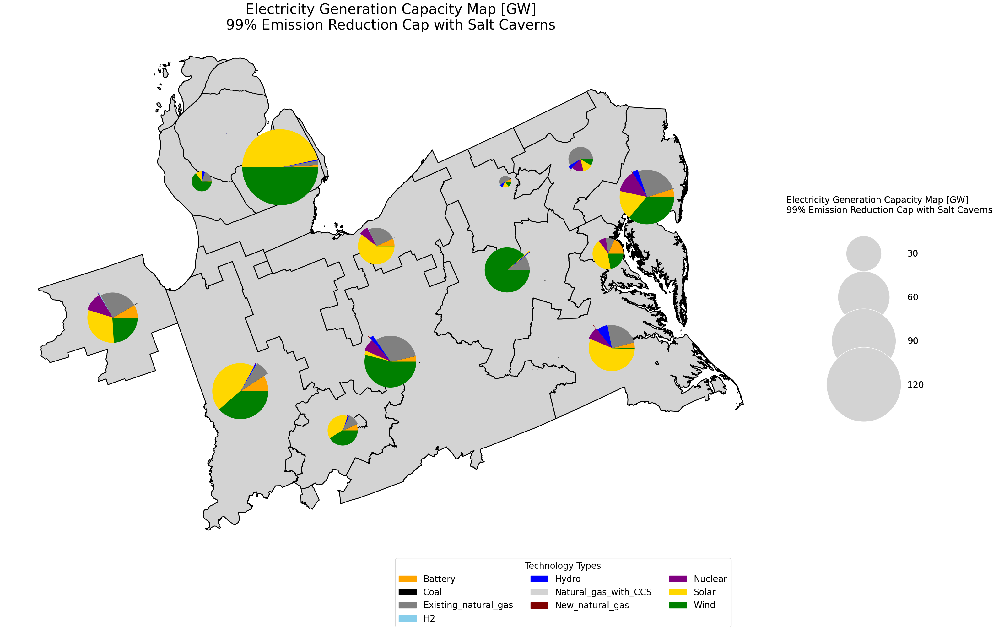

In [1407]:
analysis_type = 'capacity'

df = electricity_analysis(scenario, get_zone, analysis_type)
units = 'GW'
title = 'Electricity Generation Capacity Map [GW]\n' + rename_dict[scenario].replace('\n', '')
capacity_map = CapacityMap(df=df, units=units, colors=colors_generation, title=title,
                            max_circle_area_size=30000, zone_name=False, save_plot=True
                          )

print(scenario)
capacity_map.plot_IPM_zones_filtered_updated(title)

### Electricity Yearly Generation Mapped

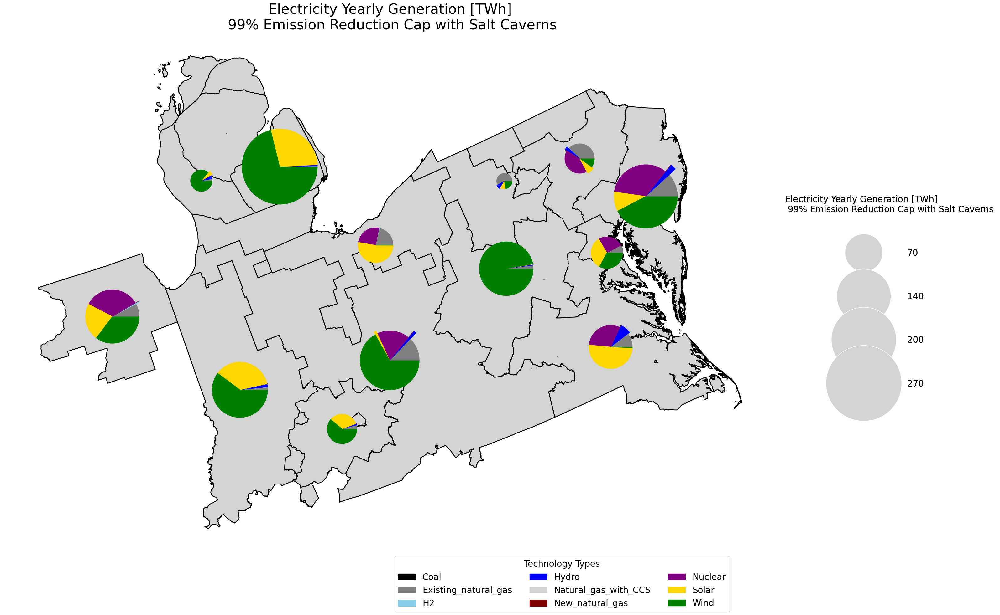

In [1408]:
analysis_type = 'generation'

df = electricity_analysis(scenario, get_zone, analysis_type)

units = 'TWh'
title = 'Electricity Yearly Generation [TWh]\n ' + rename_dict[scenario].replace('\n', '')
capacity_map = CapacityMap(df=df, units=units, colors=colors_generation, title=title,
                            max_circle_area_size=30000,
                          zone_name=False, save_plot=True)
capacity_map.plot_IPM_zones_filtered_updated(title)



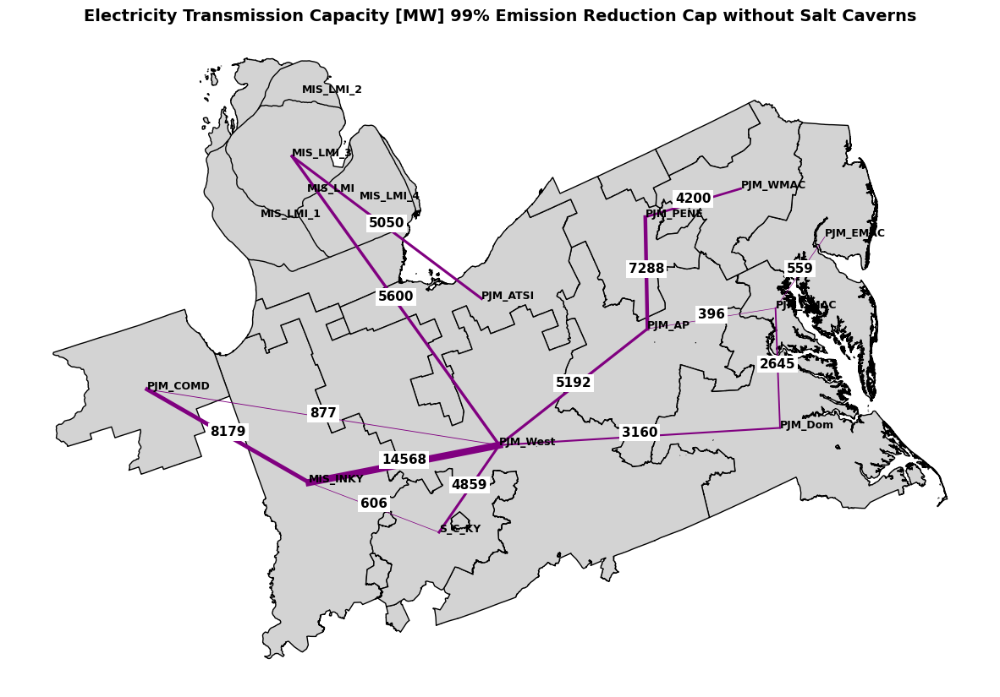

In [1378]:
def electric_transmission_df(scenario):
    wires_expansion_df = open_results_file('network_expansion.csv', scenario)
    wires_df = open_inputs_file('Network.csv', scenario)

    wires_df = wires_df.rename(columns={'Network_Lines': 'Transmission_Lines'})
    wires_expansion_df['Existing_Capacity'] = wires_df['Line_Max_Flow_MW'].astype(int)

    # Calculate total capacity
    wires_expansion_df['Total_Capacity'] = (wires_expansion_df['New_Trans_Capacity'] + wires_expansion_df['Existing_Capacity']).astype(int)
    # Removing rows withing MI that are Copper Plates 
    wires_expansion_df = wires_expansion_df.loc[wires_expansion_df['New_Trans_Capacity'] != 10000]
    wires_expansion_df['New_Trans_Capacity'] = (wires_expansion_df['New_Trans_Capacity']).astype(int)
    
    return(wires_expansion_df, wires_df)


wires_expansion_df, wires_df = electric_transmission_df(scenario)

title = 'Electricity Transmission Capacity [MW] ' + rename_dict[scenario].replace('\n', '')
grid_color = 'purple'
# Create grids object and plot grid
grid = Grid_map(zones_gdf=zones_gdf, grid_expansion_df=wires_expansion_df, grid_df=wires_df, grid_color=grid_color, title=title)
grid.plot_grid(zone_number_dict=zone_number_dict)

In [1041]:
print(scenario)

PJM_with_MI_subregions_with_caverns_95_red


## H2 Storage Capacity Maped

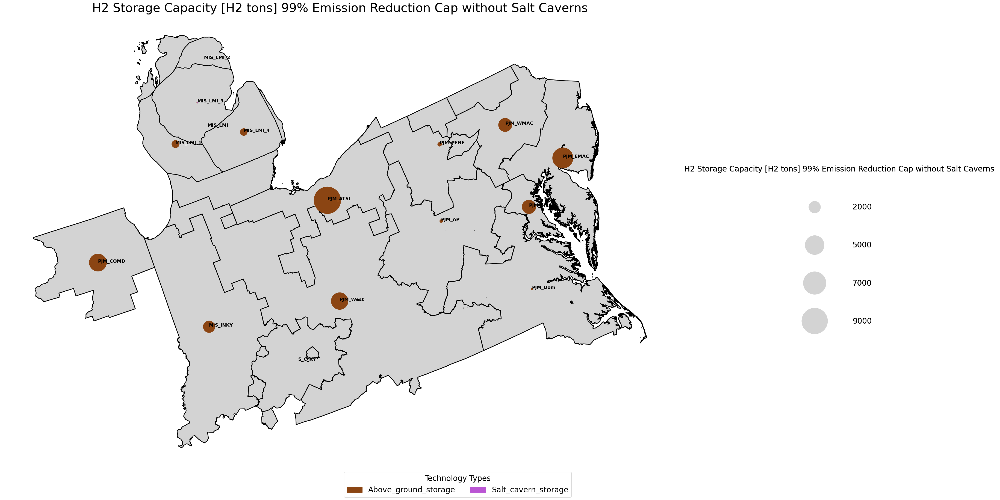

In [1394]:


def h2_storage_capacity_maped(scenario, title=title, units=2.0):
    #debugging
    #set_trace()
    units=2.0 # Tons h2

    df_main = pd.DataFrame()

    # Interested Tech:
    tech = ['Salt_cavern_storage', 'Above_ground_storage']
    

    df = h2_capacity_analysis(scenario, aggregate=False)
    # Changes zone numbers to zone name
    df['Zone'] = df['Zone'].map(zone_number_dict)
    df = df[['Tech_Type', 'EndEnergyCap', 'Zone']]
    df = df[df['Tech_Type'] != 'Total']
    # Assuming df is your DataFrame
    df = df[df['Tech_Type'].isin(tech)]
    df = df.rename(columns={'EndEnergyCap': 'H2_storage_capacity'})                     

    # Pivot the DataFrame to have each tech type as a column
    df_pivot = df.pivot(index='Zone', columns='Tech_Type', values='H2_storage_capacity')
    df  = df_pivot
    
    return(df)


# Replace 'df' with your actual DataFrame
units = ''
title = 'H2 Storage Capacity [H2 tons] ' + rename_dict[scenario].replace('\n', '')
df = h2_storage_capacity_maped(scenario, title=title, units=2.0)
capacity_map = CapacityMap(df=df, units=units, colors=H2_colors, title=title, max_circle_area_size=5000, save_plot=True)
capacity_map.plot_IPM_zones_filtered_updated(title)

### H2 Installed Capacity 

PJM_with_MI_subregions_with_caverns_99_red


FileNotFoundError: [Errno 2] No such file or directory: './plots_folder/H2 Installed Capacity [H2 tons / hour] 99% Emission Reduction Cap with Salt Caverns.png'

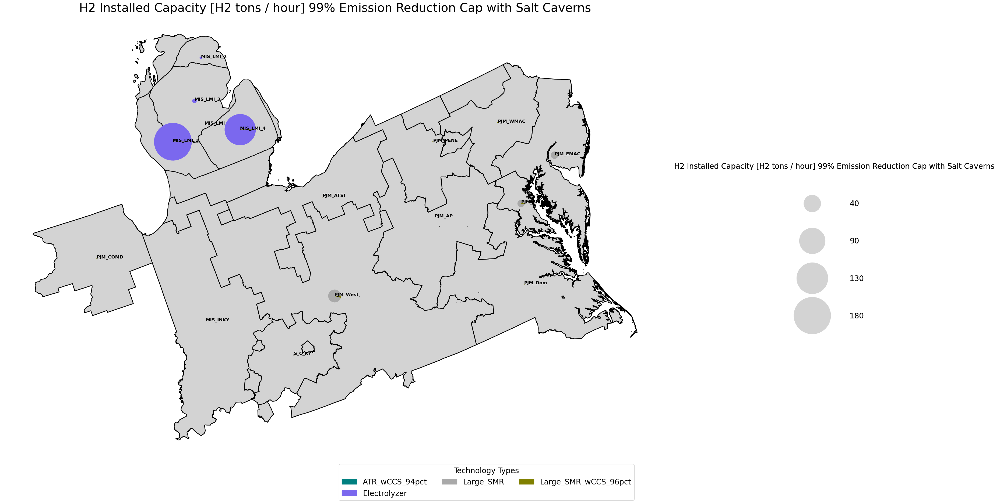

In [1401]:
def get_zone(resource):
    zones.sort(key=len, reverse=True)  # sort zones by length in descending order
    for zone in zones:
        if resource.startswith(zone):
            return zone
    return None  # return None if no zone matches

def h2_analysis_mapped(scenario, get_zone, analysis_type):
    # Perform capacity analysis and get the dataframe
    df = h2_capacity_analysis(scenario, aggregate = False)

    # Extract relevant columns to create capacity and generation dataframes
    df_capacity = df[['Resource', 'Tech_Type', 'EndCap']]
    df_generation_annual = df[['Resource', 'Tech_Type', 'AnnualGeneration']]

    # Use the appropriate dataframe for further operations
    if analysis_type == 'capacity':
        df = df_capacity.copy()
        value = 'EndCap'
        conversion_factor = 1  # Tons H2 / hr
    elif analysis_type == 'generation':
        df = df_generation_annual.copy()
        value = 'AnnualGeneration'
        conversion_factor =  1000000 / 33.33   # Tons H2 --> TWh
        # Drop the 'Battery' column for annual generation
        
    else:
        raise ValueError("Invalid analysis type. Choose either 'capacity' or 'generation'")
     

    # Remove rows where 'Tech_Type' is 'Total'
    df = df[df['Tech_Type'] != 'Total']

    # Apply the get_zone function to 'Resource' column and create a new column 'Zone'
    df.loc[:, 'Zone'] = df['Resource'].apply(get_zone)

    # Drop the now unnecessary 'Resource' column
    df.drop(columns=['Resource'], inplace=True)

    # Pivot the dataframe to make 'Tech_Type' columns and 'Zone' rows, aggregating 'EndCap' or 'AnnualGeneration' values by sum where there are multiple entries
    pivot_df = df.pivot_table(index='Zone', columns='Tech_Type', values=value, aggfunc='sum')

    # Convert units
    df = pivot_df / conversion_factor
    
    # Remove storage    
    df = df.drop(columns=['Salt_cavern_storage', 'Above_ground_storage'])
    
    return df



analysis_type = 'capacity'
df = h2_analysis_mapped(scenario, get_zone, analysis_type)


print(scenario)
# Replace 'df' with your actual DataFrame
units = ''
title = 'H2 Installed Capacity [H2 tons / hour] '  + rename_dict[scenario].replace('\n', '')

capacity_map = CapacityMap(df=df, units=units, title=title, colors=H2_colors, max_circle_area_size=10000, save_plot=True)
capacity_map.plot_IPM_zones_filtered_updated(title)

### H2 Annual Generation

PJM_with_MI_subregions_with_caverns_99_red


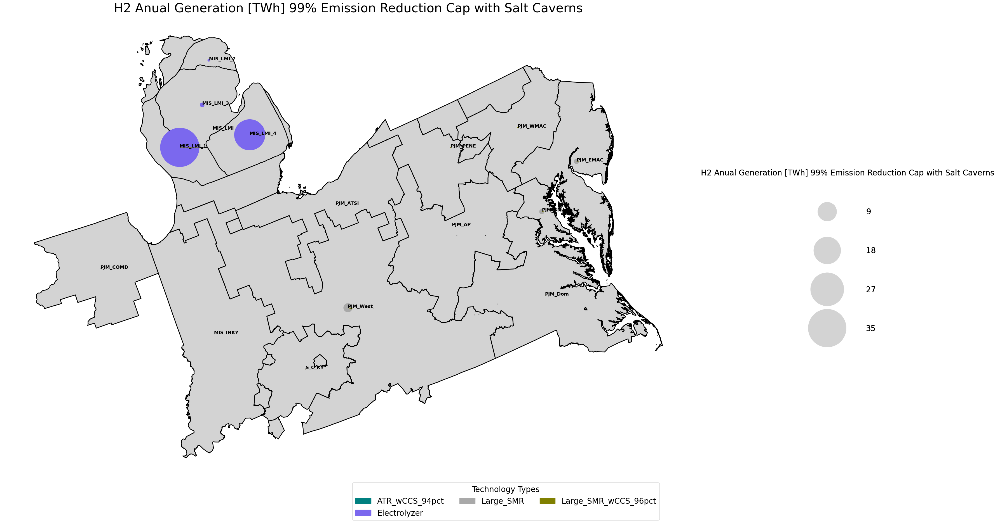

In [1403]:
analysis_type = 'generation'
df = h2_analysis_mapped(scenario, get_zone, analysis_type)


print(scenario)
# Replace 'df' with your actual DataFrame
units = ''
title = 'H2 Anual Generation [TWh] ' + rename_dict[scenario].replace('\n', '')

capacity_map = CapacityMap(df=df, units=units, title=title, colors=H2_colors, max_circle_area_size=10000, save_plot=True)
capacity_map.plot_IPM_zones_filtered_updated(title)

### H2 Pipeline Maping

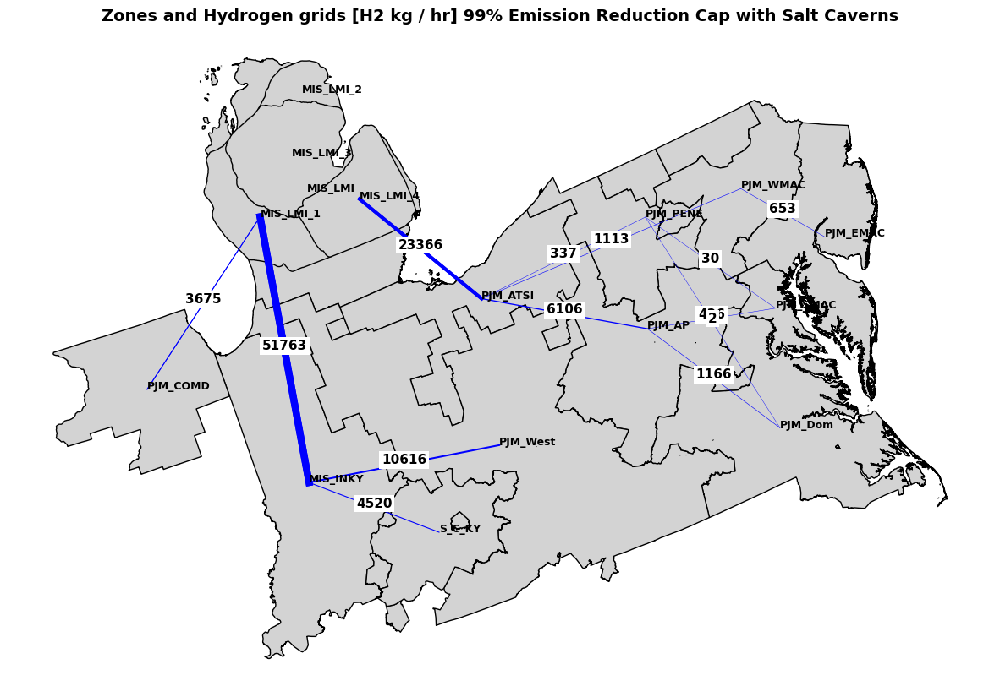

In [1404]:

pipelines_df = open_inputs_file('HSC_pipelines.csv', scenario)
pipelines_df = pipelines_df.rename(columns={'H2_Pipelines': 'Transmission_Lines'})


pipeline_expansion_df = open_results_file('HSC_pipeline_expansion.csv', scenario)
pipeline_expansion_df['New_Trans_Capacity'] = (pipeline_expansion_df['New_Trans_Capacity'] * pipeline_expansion_df['Total_Pipes'] * 1000).astype(int)
pipeline_expansion_df['Total_Capacity'] = pipeline_expansion_df['New_Trans_Capacity']
pipeline_expansion_df['Existing_Capacity'] = pipeline_expansion_df['New_Trans_Capacity'] * 0 # No current existing capacity
pipeline_expansion_df


title = 'Zones and Hydrogen grids [H2 kg / hr] ' + rename_dict[scenario].replace('\n', '')
# Create grids object and plot grid
grid = Grid_map(zones_gdf=zones_gdf, grid_expansion_df=pipeline_expansion_df, grid_df=pipelines_df, title=title)
grid.plot_grid(zone_number_dict=zone_number_dict)


### H2 Load Mapped

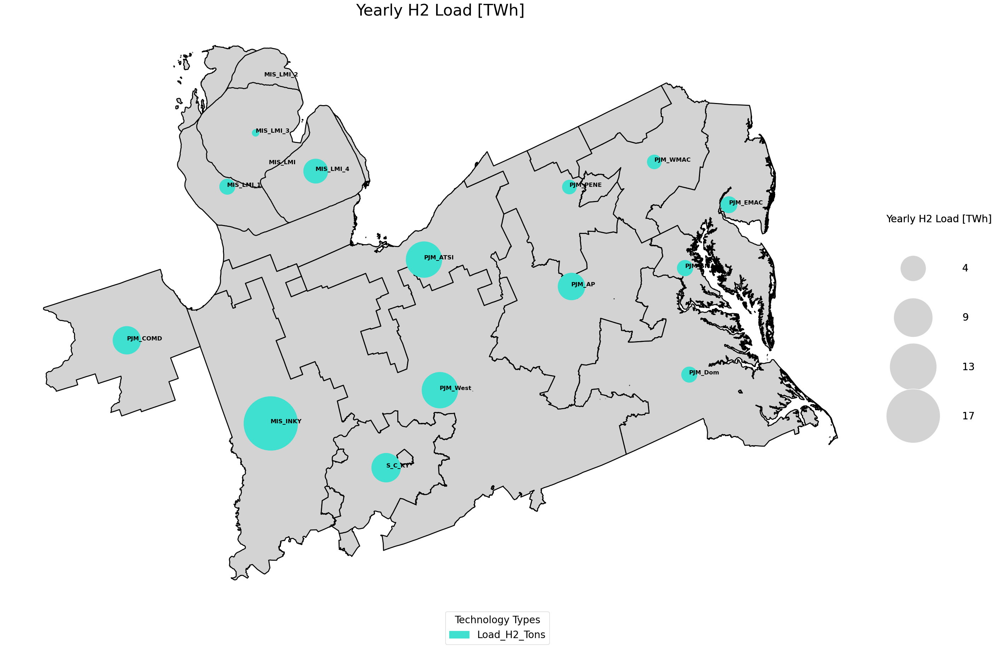

In [1402]:
def zone_h2_load_data(load_file = '../HSC_load_data.csv', scenario=scenario):

    df = open_results_file(file_name=load_file, scenario=scenario)
    #set_trace()
    zone_ID_dict, zone_number_dict = zone_ID()
    # Create a list of all columns in df that contain 'zn' in their names
    zn_columns = [col for col in df.columns if 'z' in col]
    # Create a new dictionary with the zone names from zone_ID_dict as keys and the corresponding column values from df as values
    # Multiplied by 8760 to go from tons/hr ---> tons/year
    new_dict = {}
    for key in zn_columns:
        modified_key = key.replace("Load_H2_tonne_per_hr_", "")
        value = df[key].values[0]*8760

        new_dict[zone_ID_dict[modified_key]] = int(value)
        
    df = pd.DataFrame(list(h2_load_zoned.items()), columns=['Zone', 'Load_H2_Tons'])
    df.set_index('Zone', inplace=True)
    return(df)

df = zone_h2_load_data()
# Tons H2 --> TWh
df = df * 33.33 / 1000000
#print(df)
H2_load_color = {"Load_H2_Tons": "#40E0D0"}

units = '[TWh]'
title = 'Yearly H2 Load ' + units


capacity_map = CapacityMap(df=df, units=units, title=title, colors=H2_load_color,
                            max_circle_area_size=12000)
capacity_map.plot_IPM_zones_filtered_updated(title)

# Transmission Analysis

## Electrical Transmission

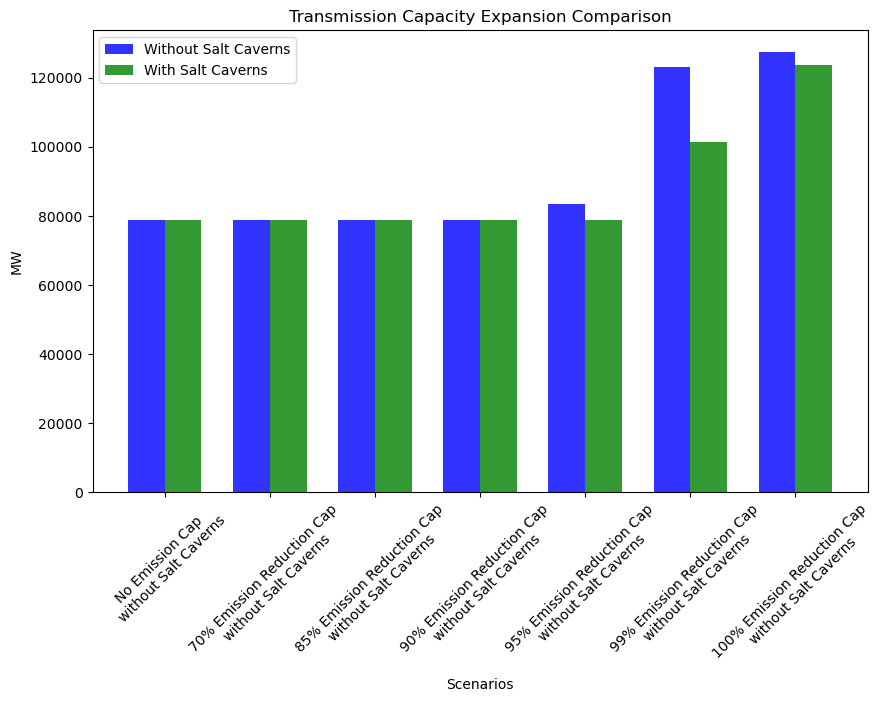

<Figure size 640x480 with 0 Axes>

In [1362]:
# Without caverns
trans_cap_list_no_caverns = []
for scenario in scenarios_no_caverns:
    df = open_results_file('network_expansion.csv', scenario)
    trans_cap_total = df['New_Trans_Capacity'].sum()
    trans_cap_list_no_caverns.append(trans_cap_total)

# With caverns
trans_cap_list_with_caverns = []
for scenario in scenarios_with_caverns:
    df = open_results_file('network_expansion.csv', scenario)
    trans_cap_total = df['New_Trans_Capacity'].sum()
    trans_cap_list_with_caverns.append(trans_cap_total)
    
# Settings for the bars
bar_width = 0.35
opacity = 0.8

# Rename scenarios
scenarios_renamed = [rename_dict[s] for s in scenarios_no_caverns]

# Create an array with the position of each bar along the x-axis
r1 = np.arange(len(trans_cap_list_no_caverns))
r2 = [x + bar_width for x in r1]

plt.figure(figsize=(10, 6))

# Plot bars
plt.bar(r1, trans_cap_list_no_caverns, color='blue', width=bar_width, alpha=opacity, label='Without Salt Caverns')
plt.bar(r2, trans_cap_list_with_caverns, color='green', width=bar_width, alpha=opacity, label='With Salt Caverns')

# Add labels, title, legend, etc
plt.xlabel('Scenarios')  
plt.ylabel('MW')
plt.title('Transmission Capacity Expansion Comparison')
plt.xticks([r + bar_width / 2 for r in range(len(trans_cap_list_no_caverns))], scenarios_renamed, rotation=45)
plt.legend()

plt.show()
plt.savefig('plots_folder/Autosave_plots/Power_Transmission_Capacity')

## H2 Pipeline Transmission

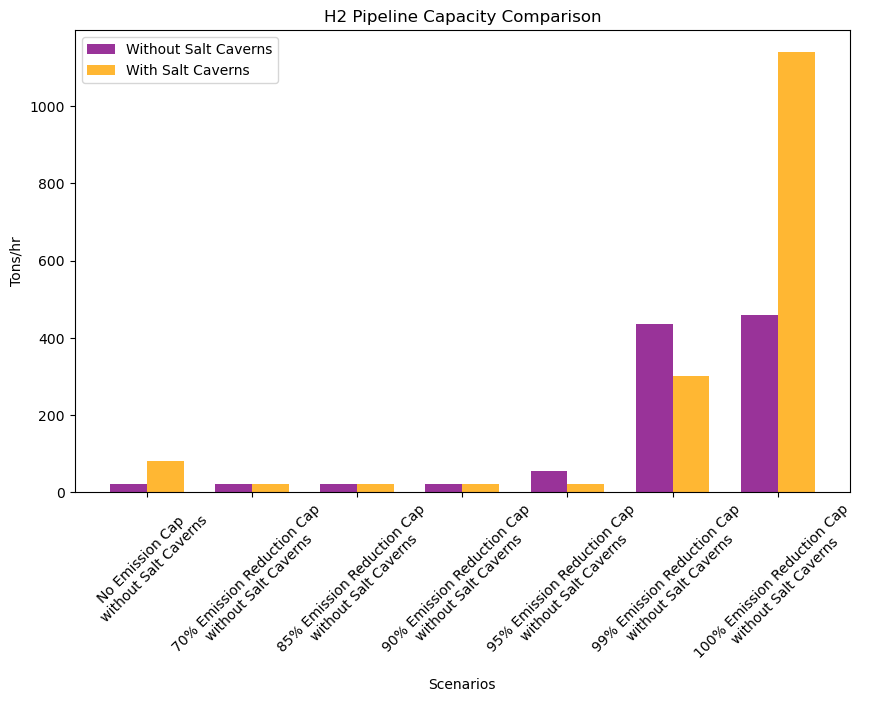

<Figure size 640x480 with 0 Axes>

In [1307]:

# Without caverns
h2_pipe_cap_list_no_caverns = []
for scenario in scenarios_no_caverns:
    df = open_results_file('HSC_pipeline_expansion.csv', scenario)
    new_h2_pipeline_cap_total = df['New_Trans_Capacity'].sum()
    h2_pipe_cap_list_no_caverns.append(new_h2_pipeline_cap_total)

# With caverns
h2_pipe_cap_list_with_caverns = []
for scenario in scenarios_with_caverns:
    df = open_results_file('HSC_pipeline_expansion.csv', scenario)
    new_h2_pipeline_cap_total = df['New_Trans_Capacity'].sum()
    h2_pipe_cap_list_with_caverns.append(new_h2_pipeline_cap_total)

    
# Settings for the bars
bar_width = 0.35
opacity = 0.8

# Rename scenarios
scenarios_renamed = [rename_dict[s] for s in scenarios_no_caverns]

# Create an array with the position of each bar along the x-axis
r1 = np.arange(len(h2_pipe_cap_list_no_caverns))
r2 = [x + bar_width for x in r1]

plt.figure(figsize=(10, 6))

# Plot bars
plt.bar(r1, h2_pipe_cap_list_no_caverns, color='purple', width=bar_width, alpha=opacity, label='Without Salt Caverns')
plt.bar(r2, h2_pipe_cap_list_with_caverns, color='orange', width=bar_width, alpha=opacity, label='With Salt Caverns')

# Add labels, title, legend, etc
plt.xlabel('Scenarios')  
plt.ylabel('Tons/hr')
plt.title('H2 Pipeline Capacity Comparison')
plt.xticks([r + bar_width / 2 for r in range(len(h2_pipe_cap_list_no_caverns))], scenarios_renamed, rotation=45)
plt.legend()

plt.show()
plt.savefig('plots_folder/Autosave_plots/h2_pipeline_capcity')

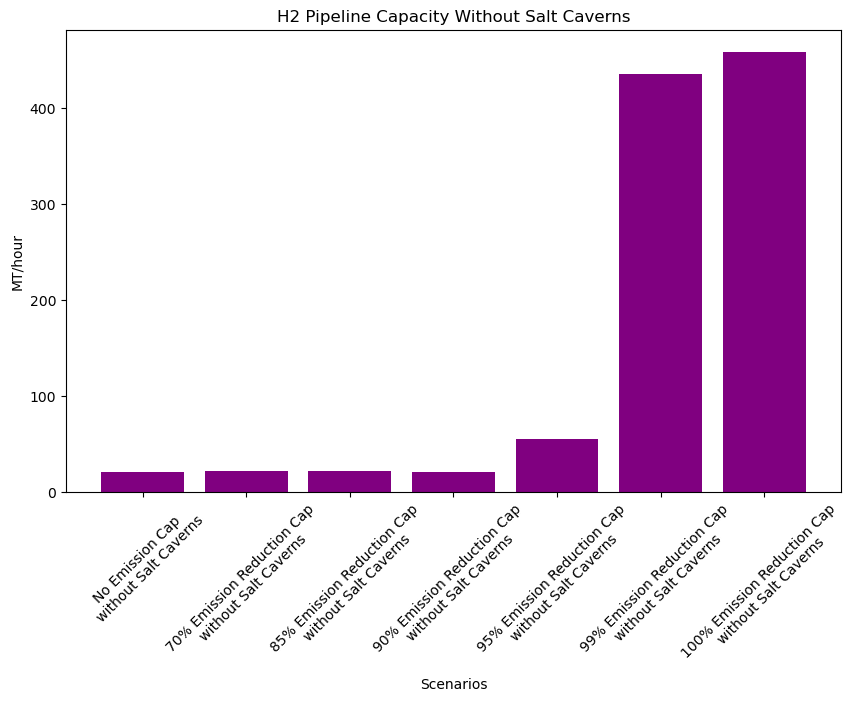

In [1308]:
h2_pipe_cap_list = []
for scenario in scenarios_no_caverns:
    df = open_results_file('HSC_pipeline_expansion.csv',scenario )
    new_h2_pipeline_cap_total = df['New_Trans_Capacity'].sum()
    h2_pipe_cap_list.append(new_h2_pipeline_cap_total)

# Rename scenarios
scenarios_renamed = [rename_dict[s] for s in scenarios]

plt.figure(figsize=(10,6))
plt.bar(scenarios_renamed, h2_pipe_cap_list, color='purple')
plt.xlabel('Scenarios')  
plt.ylabel('MT/hour')
plt.title('H2 Pipeline Capacity Without Salt Caverns')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.show()


## H2 Pipeline Map

/var/folders/m4/djjh1g0n0jgb3mrwq4sp7wd40000gn/T/ipykernel_95992/191872148.py:59: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  pipelines_gdf.to_file(dir_name + "/pipelines_gdf.shp")


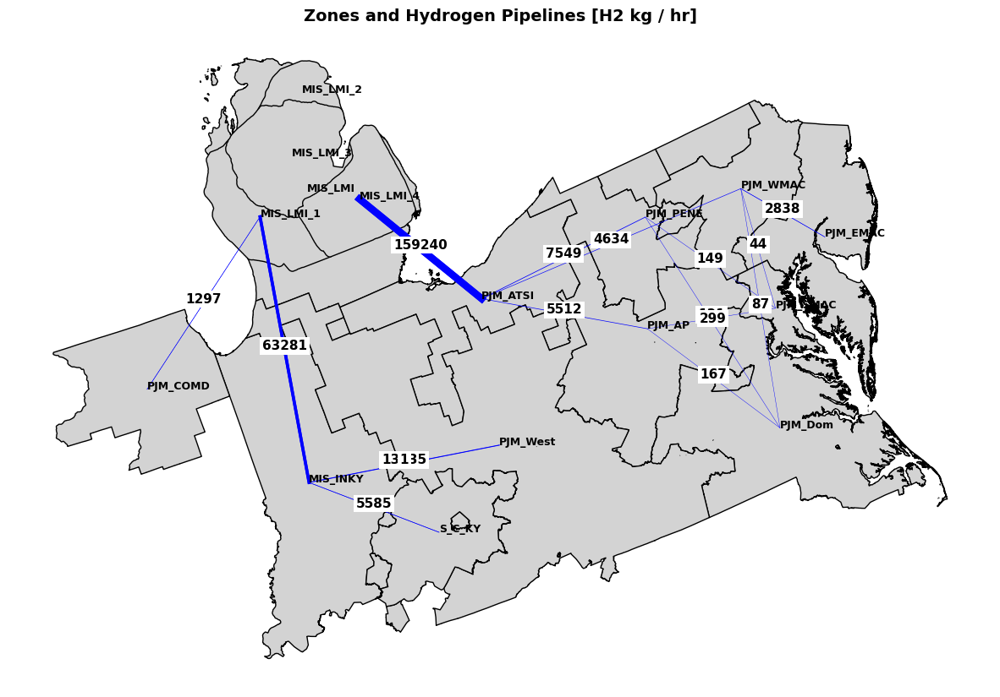

In [1154]:
#IPM_with_subregions/IPM_with_MI_subregions.shp
zones_gdf = gpd.read_file('IPM_with_subregions/IPM_with_MI_subregions.shp')
#zones_gdf = load_and_process_shapefiles(IPM_shapefile_path, MI_shapefile_path, colors=H2_colors)
pipeline_expansion_df = open_results_file('HSC_pipeline_expansion.csv', scenario)
pipelines_df = open_inputs_file('HSC_pipelines.csv', scenario)


# Function to map each pipeline to the zones it connects
def map_pipelines_to_zones(pipelines_df):
    pipeline_to_zones = {}  # Initialize an empty dictionary
    for idx, row in pipelines_df.iterrows():  # Iterate over the rows of the data frame
        # Find all columns that start with 'z' and have a non-zero value
        connected_zones = [col for col in row.index if col.startswith('z') and row[col] != 0]
        pipeline_to_zones[row['H2_Pipelines']] = connected_zones  # Add the connected zones to the dictionary
    return pipeline_to_zones

# Function to replace zone numbers with actual zone names
def replace_zone_numbers_with_names(pipeline_to_zones, zone_number_dict):
    # Use dictionary comprehension to create a new dictionary with zone names instead of numbers
    pipeline_to_zones_names = {pipeline: [zone_number_dict[int(zone[1:])] for zone in zones] for pipeline, zones in pipeline_to_zones.items()}
    return pipeline_to_zones_names

# Function to compute the geometries (lines) for each pipeline
def compute_pipeline_geometries(pipeline_to_zones_names, zones_gdf):
    pipeline_geometry = {}  # Initialize an empty dictionary
    for pipeline, zones in pipeline_to_zones_names.items():  # Iterate over the items of the dictionary
        start_zone, end_zone = zones  # Get the start and end zones
        # Get the data frames for the start and end zones
        start_zone_df = zones_gdf[zones_gdf['IPM_Region'] == start_zone]
        end_zone_df = zones_gdf[zones_gdf['IPM_Region'] == end_zone]
        if start_zone_df.empty or end_zone_df.empty:  # If either data frame is empty, print an error message and set the geometry to None
            print(f"Could not find data for zones '{start_zone}' or '{end_zone}' in the shapefile.")
            pipeline_geometry[pipeline] = None
        else:  # If both data frames are not empty, compute the centroids and create a LineString geometry
            start_centroid = start_zone_df.geometry.centroid.values[0]
            end_centroid = end_zone_df.geometry.centroid.values[0]
            line = LineString([Point(start_centroid.x, start_centroid.y), Point(end_centroid.x, end_centroid.y)])
            pipeline_geometry[pipeline] = line  # Add the geometry to the dictionary
    return pipeline_geometry

# Function to create a GeoDataFrame for the pipelines
def create_pipeline_gdf(pipeline_geometry, pipeline_expansion_df, zones_gdf):
    # Create a GeoDataFrame from the data frame, adding a 'geometry' column with the pipeline geometries
    pipelines_gdf = gpd.GeoDataFrame(pipeline_expansion_df, geometry=[pipeline_geometry.get(line) for line in pipeline_expansion_df['Line']], crs=zones_gdf.crs)
    # Convert 'New_Trans_Capacity' from tons to kg and cast to integer. Must multiple by Total_Pipes column
    # The number of pipes is modeled as continuous variables rather than an integer variable to speed up the calculation, so that’s why fractional values are allowed. For calculating throughput capacity you can just multiply number of pipes times pipeline capacity for each pipe
    pipelines_gdf['New_Trans_Capacity'] = (pipelines_gdf['New_Trans_Capacity'] * pipelines_gdf['Total_Pipes']  * 1000).astype(int)
    
    # Define the directory name
    dir_name = "pipelines_gdf"

    # Check if the directory already exists
    if not os.path.exists(dir_name):
            
    # If the directory doesn't exist, create it
        os.makedirs(dir_name)

    # Now you can save the GeoDataFrame to the Shapefile in the new directory
    pipelines_gdf.to_file(dir_name + "/pipelines_gdf.shp")
    return pipelines_gdf

# Function to normalize the 'New_Trans_Capacity' values to a range suitable for line widths
def normalize_pipeline_widths(pipelines_gdf, pipeline_widths_scalar=3):
    # Initialize a MinMaxScaler with the desired range
    scaler = MinMaxScaler(feature_range=(0.1, 2))
    # Fit the scaler to the 'New_Trans_Capacity' values and transform them
    pipeline_widths = scaler.fit_transform(pipelines_gdf['New_Trans_Capacity'].values.reshape(-1, 1))
    return(pipeline_widths * pipeline_widths_scalar)

def plot_zones_and_pipelines(pipelines_gdf, pipeline_widths, zones_gdf, annotate_capacity=True):
    # Create a figure and axes
    fig, ax = plt.subplots(figsize=(15, 15))
    
    # Plot the zones with filled color
    zones_gdf.plot(ax=ax, color='lightgray', edgecolor='black')
    
    # Add zone names at the centroid of each zone
    for x, y, label in zip(zones_gdf.geometry.centroid.x, zones_gdf.geometry.centroid.y, zones_gdf['IPM_Region']):
        ax.text(x, y, label, fontsize=9, fontweight='bold')

    
    # Iterate over the rows of the pipelines GeoDataFrame
    for idx, row in pipelines_gdf.iterrows():
        # Ignore pipelines with zero capacity
        if row['New_Trans_Capacity'] == 0:
            continue
        if not row['geometry'].is_empty:  # If the geometry is not empty, plot the pipeline
            xs, ys = row['geometry'].xy  # Get the x and y coordinates of the pipeline
            # Plot the pipeline with the color blue and a line width based on the 'New_Trans_Capacity' value
            ax.plot(xs, ys, color='blue', linewidth=pipeline_widths[idx][0])
            if annotate_capacity:  # If annotate_capacity is True, add a label with the 'New_Trans_Capacity' value
                mid_x = np.mean(xs)
                mid_y = np.mean(ys)
                ax.text(mid_x, mid_y, str(row['New_Trans_Capacity']), fontsize=11,fontweight='bold', ha='center', 
                        bbox=dict(facecolor='white', edgecolor='none', pad=2))  # Add white background
                
    # Set the title of the plot
    ax.set_title('Zones and Hydrogen Pipelines [H2 kg / hr]', fontsize=14, fontweight='bold')
    
    # Remove axes
    ax.axis('off')

    return fig, ax



# Function to add a legend to the plot
def add_legend_to_plot(ax, pipeline_expansion_df):
    # Compute min and max capacities
    min_capacity = pipeline_expansion_df['New_Trans_Capacity'].min()
    print(min_capacity)
    max_capacity = pipeline_expansion_df['New_Trans_Capacity'].max()
    print(max_capacity)
    
    # Generate rounded numbers for capacities
    capacities = generate_round_numbers(min_capacity, max_capacity, N=4)
    print(capacities)
    # Create a list to store the legend elements
    legend_elements = []

    # Scaling factor for legend line widths
    legend_scaling_factor = 3

    # For each capacity, create a line with the appropriate line width and add it to the legend elements
    for capacity in capacities:
        # Compute the line width for the current capacity and apply the scaling factor
        line_width = legend_scaling_factor * (2 + (4 * (capacity - min_capacity) / (max_capacity - min_capacity)))

        # Create a Line2D object with the appropriate line width
        line = Line2D([0], [0], color='blue', lw=line_width)

        # Add the line to the legend elements with a label displaying the capacity
        legend_elements.append((line, f'Capacity: {int(capacity)} [kg H2 / hr]'))

    # Add the legend elements to the plot with the legend located in the upper left corner
    ax.legend(*zip(*legend_elements), loc='upper left')

    # Update the plot
    plt.show()

# Main function to plot the pipelines
def plot_pipelines(zones_gdf, pipeline_expansion_df, pipelines_df, zone_number_dict=zone_number_dict, annotate_capacity=True):
    # Map pipelines to zones they connect
    pipeline_to_zones = map_pipelines_to_zones(pipelines_df)
    
    # Replace zone numbers with actual zone names
    pipeline_to_zones_names = replace_zone_numbers_with_names(pipeline_to_zones, zone_number_dict)
    
    # Compute pipeline geometries
    pipeline_geometry = compute_pipeline_geometries(pipeline_to_zones_names, zones_gdf)
    
    # Create GeoDataFrame for the pipelines
    pipelines_gdf = create_pipeline_gdf(pipeline_geometry, pipeline_expansion_df, zones_gdf)
    
    # Normalize 'New_Trans_Capacity' values for line widths
    pipeline_widths = normalize_pipeline_widths(pipelines_gdf)
    
    # Plot zones and pipelines
    fig, ax = plot_zones_and_pipelines(pipelines_gdf, pipeline_widths, zones_gdf, annotate_capacity)
    
    # Add legend to plot
    #add_legend_to_plot(ax, pipeline_expansion_df)

# Call the main function
plot_pipelines(zones_gdf=zones_gdf, pipeline_expansion_df=pipeline_expansion_df, pipelines_df=pipelines_df)

In [ ]:
# SETTINGS:
scenario = 'PJM_with_MI_subregions_with_caverns_95_red'
IPM_shapefile_path='ipm_v6_regions'
subregions_shapefile_path = 'MI_Geo_Sto'
replace_cluster_name = {'MI_Geo_Sto': {'cluster_0': 'MIS_LMI_1', 'cluster_1': 'MIS_LMI_2', 'cluster_2': 'MIS_LMI_3', 'cluster_3': 'MIS_LMI_4'}}
rename_columns_subregions = {'MI_Geo_Sto': 'IPM_Region'}
subregions_crs = "EPSG:4269"


def load_and_process_shapefiles(IPM_shapefile_path, subregions_shapefile_path,
                                replace_cluster_name='', rename_columns_subregions=rename_columns_subregions,
                               subregions_crs="EPSG:4269"):     
    # Load the IPM regions Shapefile
    #set_trace()
    #gdf = gpd.read_file(self.IPM_shapefile_path)
    IPM_shapefile = gpd.read_file(IPM_shapefile_path)
    subregions_gdf = gpd.read_file(subregions_path)
    # Replace the names of the clusters
    if replace_cluster_name != '':
        subregions_gdf = subregions_gdf.replace(replace_cluster_name)
        subregions_gdf = subregions_gdf.rename(columns=rename_columns_subregions )

    # Set the CRS of the MI Shapefile to NAD83
    subregions_gdf.crs = subregions_crs

    # Check the CRS of both Shapefiles
    crs_IPM = IPM_shapefile.crs
    crs_MI = subregions_gdf.crs

    subregions_gdf = subregions_gdf.to_crs(crs_IPM)

    gdf = IPM_shapefile
    # Filter out the MIS_LMI zone
    gdf = gdf[gdf['IPM_Region'].isin(list(colors_IPM_zones.keys()))]
    
    # Append the MI_Geo_Sto GeoDataFrame to the IPM regions GeoDataFrame
    gdf = gdf.append(subregions_gdf)
    gdf.to_file("IPM_with_MI_subregions.shp")

    return gdf

gdf = load_and_process_shapefiles(IPM_shapefile_path=IPM_shapefile_path, subregions_shapefile_path=subregions_shapefile_path,
                                  replace_cluster_name=replace_cluster_name, rename_columns_subregions=rename_columns_subregions)



In [1189]:
#IPM_with_subregions/IPM_with_MI_subregions.shp
zones_gdf = gpd.read_file('IPM_with_subregions/IPM_with_MI_subregions.shp')
#zones_gdf = load_and_process_shapefiles(IPM_shapefile_path, MI_shapefile_path, colors=H2_colors)
pipeline_expansion_df = open_results_file('HSC_pipeline_expansion.csv', scenario)
pipelines_df = open_inputs_file('HSC_pipelines.csv', scenario)
pipelines_df = pipelines_df.rename(columns={'H2_Pipelines': 'Transmission_Lines'})


pipeline_expansion_df.columns
pipeline_expansion_df['New_Trans_Capacity'] = (pipeline_expansion_df['New_Trans_Capacity'] * pipeline_expansion_df['Total_Pipes']  * 1000).astype(int)
pipeline_expansion_df['Total_Capacity'] = pipeline_expansion_df['New_Trans_Capacity']
pipeline_expansion_df['Existing_Capacity'] = pipeline_expansion_df['New_Trans_Capacity'] * 0
pipeline_expansion_df
#     dir_name = "grid_gdf"
#     if not os.path.exists(dir_name):
#         os.makedirs(dir_name)

#     grid_gdf.to_file(dir_name + "/grid_gdf.shp")
#     return grid_gdf
pipelines_df 

,Transmission_Lines,z1,z2,z3,z4,z5,z6,z7,z8,z9,...,Max_Flow_Tonne_p_Hr_Per_Pipe,H2Pipe_Inv_Cost_per_mile_yr,Pipe_length_miles,H2PipeCap_tonne_per_mile,Min_pipecap_stor_frac,len_bw_comp_mile,BoosterCompCapex_per_tonne_p_hr_yr,BoosterCompEnergy_MWh_per_tonne,H2PipeCompCapex,H2PipeCompEnergy
0,1,-1,0,0,0,0,1,0,0,0,...,87.545,90608.5,183,0.36,0,31,50700.0,0.15,225784,0.289
1,2,0,0,0,0,0,1,0,0,0,...,6.844,90608.5,320,0.36,0,31,50700.0,0.15,225784,0.289
2,3,1,0,0,0,0,-1,0,0,0,...,45.881,90608.5,183,0.36,0,31,50700.0,0.15,225784,0.289
3,4,0,0,0,0,0,-1,0,0,0,...,14.089,90608.5,320,0.36,0,31,50700.0,0.15,225784,0.289
4,5,1,0,0,0,0,0,-1,0,0,...,64.742,90608.5,340,0.36,0,31,50700.0,0.15,225784,0.289
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,58,0,0,0,0,0,0,0,0,0,...,51.250,90608.5,92,0.36,0,31,50700.0,0.15,225784,0.289
58,59,0,0,0,0,0,0,0,0,0,...,51.250,90608.5,103,0.36,0,31,50700.0,0.15,225784,0.289
59,60,0,0,0,0,0,0,0,0,0,...,51.250,90608.5,103,0.36,0,31,50700.0,0.15,225784,0.289
60,61,0,0,0,0,0,-1,0,0,0,...,51.250,90608.5,152,0.36,0,31,50700.0,0.15,225784,0.289


In [1232]:
#IPM_with_subregions/IPM_with_MI_subregions.shp
zones_gdf = gpd.read_file('IPM_with_subregions/IPM_with_MI_subregions.shp')
#zones_gdf = load_and_process_shapefiles(IPM_shapefile_path, MI_shapefile_path, colors=H2_colors)
wires_expansion_df = open_results_file('network_expansion.csv', scenario)

wires_df = open_inputs_file('Network.csv', scenario)
wires_df = wires_df.rename(columns={'Network_Lines': 'Transmission_Lines'})

wires_expansion_df['Existing_Capacity'] = wires_df['Line_Max_Flow_MW']
wires_expansion_df['Total_Capacity'] = wires_expansion_df['New_Trans_Capacity'] + wires_expansion_df['Existing_Capacity']
wires_df

,Transmission_Lines,z1,z2,z3,z4,z5,z6,z7,z8,z9,...,CapRes_Excl_6,CapRes_Excl_7,CapRes_Excl_8,CapRes_Excl_9,CapRes_Excl_10,CapRes_Excl_11,CapRes_Excl_12,CapRes_Excl_13,CapRes_Excl_14,CapRes_Excl_15
0,1,1,0,0,-1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,1,0,0,0,0,-1,0,0,0,...,-1,0,0,0,0,0,0,0,0,0
2,3,1,0,0,0,0,0,0,0,0,...,0,0,0,0,-1,0,0,0,0,0
3,4,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,-1,0,0,0
4,5,0,1,-1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,6,0,1,0,0,-1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,7,0,1,0,0,0,0,0,0,-1,...,0,0,0,-1,0,0,0,0,0,0
7,8,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,-1,0,0,0,0
8,9,0,0,1,0,-1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,10,0,0,1,0,0,0,0,-1,0,...,0,0,-1,0,0,0,0,0,0,0


## Directional Pipelines

/var/folders/m4/djjh1g0n0jgb3mrwq4sp7wd40000gn/T/ipykernel_95992/3541005112.py:96: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  pipelines_gdf.to_file(dir_name + "/pipelines_gdf.shp")


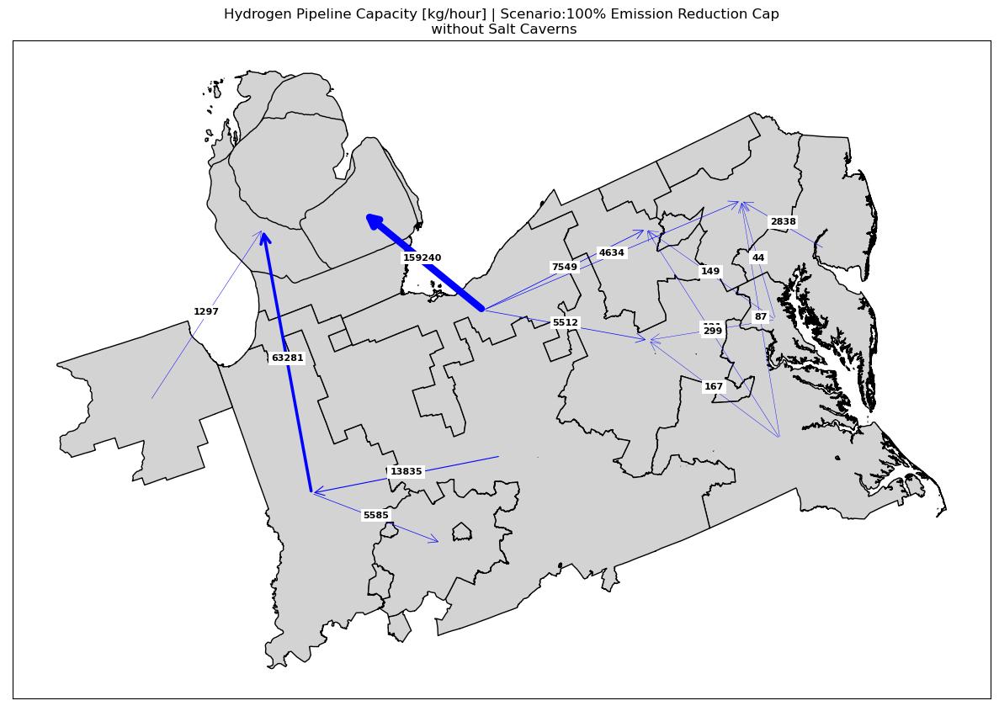

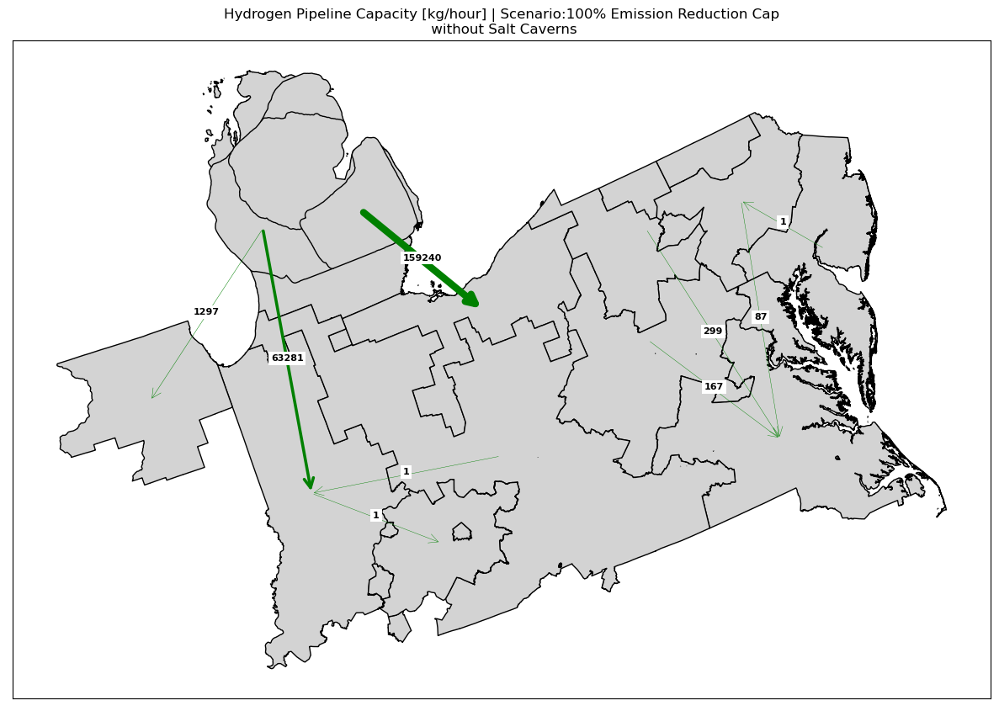

In [1155]:
#IPM_with_subregions/IPM_with_MI_subregions.shp
zones_gdf = gpd.read_file('IPM_with_subregions/IPM_with_MI_subregions.shp')
#zones_gdf = load_and_process_shapefiles(IPM_shapefile_path, MI_shapefile_path, colors=H2_colors)
pipeline_expansion_df = open_results_file('HSC_pipeline_expansion.csv', scenario)
pipelines_df = open_inputs_file('HSC_pipelines.csv', scenario)


# Function to map each pipeline to the zones it connects
def map_pipelines_to_zones(pipelines_df):
    pipeline_to_zones = {}  # Initialize an empty dictionary
    for idx, row in pipelines_df.iterrows():  # Iterate over the rows of the data frame
        # Find all columns that start with 'z' and have a non-zero value
        connected_zones = [(col, row[col]) for col in row.index if col.startswith('z') and row[col] != 0]
        pipeline_to_zones[row['H2_Pipelines']] = connected_zones  # Add the connected zones to the dictionary
    
    return pipeline_to_zones

# Function to replace zone numbers with actual zone names
def replace_zone_numbers_with_names(pipeline_to_zones, zone_number_dict):
    # Use dictionary comprehension to create a new dictionary with zone names instead of numbers
    pipeline_to_zones_names = {pipeline: [(zone_number_dict[int(zone[0][1:])], zone[1]) for zone in zones] for pipeline, zones in pipeline_to_zones.items()}
    return pipeline_to_zones_names

# Function to compute the geometries (lines) for each pipeline
def compute_pipeline_geometries(pipeline_to_zones_names, zones_gdf):
    pipeline_geometry = {}  # Initialize an empty dictionary
    for pipeline, zones in pipeline_to_zones_names.items():  # Iterate over the items of the dictionary
        # Sort the zones based on the direction
        sorted_zones = sorted(zones, key=lambda x: x[1])
        start_zone, end_zone = sorted_zones[0][0], sorted_zones[1][0]  # Get the start and end zones
        # Get the data frames for the start and end zones
        start_zone_df = zones_gdf[zones_gdf['IPM_Region'] == start_zone]
        end_zone_df = zones_gdf[zones_gdf['IPM_Region'] == end_zone]
        if start_zone_df.empty or end_zone_df.empty:  # If either data frame is empty, print an error message and set the geometry to None
            print(f"Could not find data for zones '{start_zone}' or '{end_zone}' in the shapefile.")
            pipeline_geometry[pipeline] = None
        else:  # If both data frames are not empty, compute the centroids and create a LineString geometry
            start_centroid = start_zone_df.geometry.centroid.values[0]
            end_centroid = end_zone_df.geometry.centroid.values[0]
            line = LineString([Point(start_centroid.x, start_centroid.y), Point(end_centroid.x, end_centroid.y)])
            pipeline_geometry[pipeline] = line  # Add the geometry to the dictionary
    return pipeline_geometry

# Function to identify the zones that are connected and start and end zones
def identify_zones(row):
    zones = row.index[row != 0]
    sorted_zones = sorted(zones)
    start_zone = row.index[row == 1][0] if (row == 1).any() else None
    end_zone = row.index[row == -1][0] if (row == -1).any() else None
    return pd.Series([','.join(sorted_zones), start_zone, end_zone])

# Function to create a GeoDataFrame for the pipelines
def create_pipeline_gdf(pipeline_geometry, pipeline_expansion_df, zones_gdf, pipeline_to_zones_names):
    pipelines_df = open_inputs_file('HSC_pipelines.csv', scenario)

    # Get all zone column names
    zone_cols = [col for col in pipelines_df.columns if col.startswith('z')]

    adj_matrix = pipelines_df[zone_cols]
    # Set the index of the adj_matrix to be the 'H2_Pipelines' column
    adj_matrix = adj_matrix.set_index(pipelines_df['H2_Pipelines'])

    # Apply the function to each row in the dataframe
    adj_matrix[['Connected_Zones', 'Start_Zone', 'End_Zone']] = adj_matrix.apply(identify_zones, axis=1)

    # Create a list to store the rows of the new GeoDataFrame
    rows = []
    # Iterate over the items of the dictionary
    for pipeline, geometry in pipeline_geometry.items():
        # Get the start and end zone names from `pipeline_to_zones_names`
        sorted_zones = sorted(pipeline_to_zones_names[pipeline], key=lambda x: x[1])
        start_zone, end_zone = sorted_zones[0][0], sorted_zones[1][0]
        # Get the pipeline data from `pipeline_expansion_df`
        pipeline_data = pipeline_expansion_df.loc[pipeline_expansion_df['Line'] == pipeline]
        if not pipeline_data.empty:
            new_trans_capacity = (pipeline_data['New_Trans_Capacity'].values[0] * pipeline_data['Total_Pipes'].values[0] * 1000).astype(int)
            # Append a row to the list with the pipeline data
            rows.append({'H2_Pipelines': pipeline, 'Start_Zone': start_zone, 'End_Zone': end_zone, 
                         'New_Trans_Capacity': new_trans_capacity, 'geometry': geometry})

    # Create a GeoDataFrame from the rows list
    pipelines_gdf = gpd.GeoDataFrame(rows, crs=zones_gdf.crs)
    
    # Merge the pipelines_gdf and adj_matrix on 'H2_Pipelines'
    pipelines_gdf = pd.merge(pipelines_gdf, adj_matrix.reset_index(), on='H2_Pipelines')
    
    # Define the directory name
    dir_name = "pipelines_gdf"

    # Check if the directory already exists
    if not os.path.exists(dir_name):
        # If the directory doesn't exist, create it
        os.makedirs(dir_name)

    # Now you can save the GeoDataFrame to the Shapefile in the new directory
    pipelines_gdf.to_file(dir_name + "/pipelines_gdf.shp")
    pipelines_gdf.to_csv(dir_name + "/pipelines_gdf.csv")

    # Group by 'Connected_Zones' and keep the row with the maximum 'New_Trans_Capacity'
    max_capacity_gdf = pipelines_gdf.loc[pipelines_gdf.groupby('Connected_Zones')['New_Trans_Capacity'].idxmax()]

    # Group by 'Connected_Zones' and keep the row with the minimum 'New_Trans_Capacity'
    min_capacity_gdf = pipelines_gdf.loc[pipelines_gdf.groupby('Connected_Zones')['New_Trans_Capacity'].idxmin()]

    #print(pipelines_gdf)
    return max_capacity_gdf, min_capacity_gdf



# Function to normalize the 'New_Trans_Capacity' values to a range suitable for line widths
def normalize_pipeline_widths(pipelines_gdf, pipeline_widths_scalar=3, global_max_capacity=0):
    # Initialize a MinMaxScaler with the desired range
    scaler = MinMaxScaler(feature_range=(0.1, 2))
    # Fit the scaler to the 'New_Trans_Capacity' values and transform them
    
    pipelines_gdf.reset_index(drop=True, inplace=True)

    pipeline_widths = scaler.fit_transform(pipelines_gdf['New_Trans_Capacity'].values.reshape(-1, 1))
    
    if global_max_capacity != 0:
        # Normalize the 'New_Trans_Capacity' values based on the global_max_capacity
        normalized_capacity = pipelines_gdf['New_Trans_Capacity'] / global_max_capacity

        # Rescale the normalized values to the desired range for line widths
        pipeline_widths = 0.1 + (2 - 0.1) * normalized_capacity

        # Apply the scalar
        pipeline_widths *= pipeline_widths_scalar * 0.01
        return(pipeline_widths.values.reshape(-1, 1))
    
    else:
        return(pipeline_widths * pipeline_widths_scalar)


def plot_zones_and_pipelines(pipelines_gdf, pipeline_widths, zones_gdf, annotate_capacity=True, color='blue', reverse=False, scenario=scenario, rename_dict=rename_dict):
    # Create a figure and axes
    fig, ax = plt.subplots(figsize=(15, 15))
    # Plot the zones with filled color
    zones_gdf.plot(ax=ax, color='lightgray', edgecolor='black')
    # Iterate over the rows of the pipelines GeoDataFrame
    for idx, row in pipelines_gdf.iterrows():
        # Ignore pipelines with zero capacity
        if row['New_Trans_Capacity'] == 0:
            continue
        if row['geometry'] is not None:  # If the geometry is not None, plot the pipeline
            x, y = row['geometry'].xy
            # Reverse the direction if reverse=True
            start = (x[-1], y[-1]) if reverse else (x[0], y[0])
            end = (x[0], y[0]) if reverse else (x[-1], y[-1])
            # Create arrow at the end of line
            arrow = FancyArrowPatch(start, end, color=color, 
                                    arrowstyle='->', mutation_scale=20, linewidth=pipeline_widths[idx][0])
            ax.add_patch(arrow)
            if annotate_capacity:  # If annotate_capacity is True, add a label with the 'New_Trans_Capacity' value
                mid_x = start[0] + (end[0] - start[0]) / 2
                mid_y = start[1] + (end[1] - start[1]) / 2
                ax.text(mid_x, mid_y, str(row['New_Trans_Capacity']), fontsize=8, fontweight='bold', ha='center', 
                        bbox=dict(facecolor='white', edgecolor='none', pad=2))  # Add white background
    
    
    scenario_name = rename_dict[scenario]
    # Set the title of the plot
    ax.set_title('Hydrogen Pipeline Capacity [kg/hour] | Scenario:' + scenario_name)
    # Remove the x and y axis numbers and ticks
    ax.set_xticks([])
    ax.set_yticks([])
    return fig, ax



# Function to add a legend to the plot
def add_legend_to_plot(ax, pipeline_expansion_df,scenario):
    # Compute min and max capacities
    min_capacity = pipeline_expansion_df['New_Trans_Capacity'].min()
    #print(min_capacity)
    max_capacity = pipeline_expansion_df['New_Trans_Capacity'].max()
    #print(max_capacity)
    
    # Generate rounded numbers for capacities
    capacities = generate_round_numbers(min_capacity, max_capacity, N=4)
    #print(capacities)
    # Create a list to store the legend elements
    legend_elements = []

    # Scaling factor for legend line widths
    legend_scaling_factor = 3

    # For each capacity, create a line with the appropriate line width and add it to the legend elements
    for capacity in capacities:
        # Compute the line width for the current capacity and apply the scaling factor
        line_width = legend_scaling_factor * (2 + (4 * (capacity - min_capacity) / (max_capacity - min_capacity)))

        # Create a Line2D object with the appropriate line width
        line = Line2D([0], [0], color='blue', lw=line_width)

        # Get the right name for scenario
        scenario_name = rename_dict[scenario]
        print(scenario_name)
        # Add the line to the legend elements with a label displaying the capacity
        legend_elements.append((line, f'H2 Pipeline Capacity: {int(capacity)} [kg H2 / hr] | Scenario: ' + scenario_name))

    # Add the legend elements to the plot with the legend located in the upper left corner
    ax.legend(*zip(*legend_elements), loc='upper left')

    # Update the plot
    plt.show()

# Main function to plot the pipelines
def plot_pipelines(zones_gdf, pipeline_expansion_df, pipelines_df, global_max_capacity, zone_number_dict=zone_number_dict, annotate_capacity=True, scenario=scenario, rename_dict = rename_dict):
    # Map pipelines to zones they connect
    pipeline_to_zones = map_pipelines_to_zones(pipelines_df)
    
    # Replace zone numbers with actual zone names
    pipeline_to_zones_names = replace_zone_numbers_with_names(pipeline_to_zones, zone_number_dict)
    
   # Compute pipeline geometries
    pipeline_geometry = compute_pipeline_geometries(pipeline_to_zones_names, zones_gdf)
    # Create GeoDataFrames for the pipelines
    max_capacity_gdf, min_capacity_gdf = create_pipeline_gdf(pipeline_geometry, pipeline_expansion_df, zones_gdf, pipeline_to_zones_names)
    
    # Normalize 'New_Trans_Capacity' values for line widths
    max_pipeline_widths = normalize_pipeline_widths(max_capacity_gdf, global_max_capacity=global_max_capacity)
    min_pipeline_widths = normalize_pipeline_widths(min_capacity_gdf, global_max_capacity=global_max_capacity)
    # Plot zones and pipelines
    max_fig, max_ax = plot_zones_and_pipelines(max_capacity_gdf, max_pipeline_widths, zones_gdf, annotate_capacity, scenario=scenario)
    min_fig, min_ax = plot_zones_and_pipelines(min_capacity_gdf, min_pipeline_widths, zones_gdf, annotate_capacity, color='green', reverse=True, scenario=scenario)
    # Add legend to plot
    #add_legend_to_plot(max_ax, pipeline_expansion_df)
    #add_legend_to_plot(min_ax, pipeline_expansion_df)

# Call the main function
plot_pipelines(zones_gdf=zones_gdf, pipeline_expansion_df=pipeline_expansion_df, pipelines_df=pipelines_df,scenario=scenario, global_max_capacity=0)


def plot_pipelines_for_scenarios(scenarios, zones_gdf, rename_dict, global_max_capacity):
    for scenario in scenarios:
        # Rename the scenario
        print(scenario)
        # Open the corresponding files for the scenario
        pipeline_expansion_df = open_results_file('HSC_pipeline_expansion.csv', scenario)
        pipelines_df = open_inputs_file('HSC_pipelines.csv', scenario)

        # Call the main function
        plot_pipelines(zones_gdf=zones_gdf, pipeline_expansion_df=pipeline_expansion_df, pipelines_df=pipelines_df,scenario=scenario, rename_dict=rename_dict, global_max_capacity=global_max_capacity)


        print("Plots saved to 'pipeline_plots' directory.")



PJM_with_MI_subregions_with_caverns_0_red


/var/folders/m4/djjh1g0n0jgb3mrwq4sp7wd40000gn/T/ipykernel_95992/3541005112.py:96: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  pipelines_gdf.to_file(dir_name + "/pipelines_gdf.shp")


Plots saved to 'pipeline_plots' directory.
PJM_with_MI_subregions_with_caverns_70_red


/var/folders/m4/djjh1g0n0jgb3mrwq4sp7wd40000gn/T/ipykernel_95992/3541005112.py:96: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  pipelines_gdf.to_file(dir_name + "/pipelines_gdf.shp")


Plots saved to 'pipeline_plots' directory.
PJM_with_MI_subregions_with_caverns_85_red


/var/folders/m4/djjh1g0n0jgb3mrwq4sp7wd40000gn/T/ipykernel_95992/3541005112.py:96: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  pipelines_gdf.to_file(dir_name + "/pipelines_gdf.shp")


Plots saved to 'pipeline_plots' directory.
PJM_with_MI_subregions_with_caverns_90_red


/var/folders/m4/djjh1g0n0jgb3mrwq4sp7wd40000gn/T/ipykernel_95992/3541005112.py:96: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  pipelines_gdf.to_file(dir_name + "/pipelines_gdf.shp")


Plots saved to 'pipeline_plots' directory.
PJM_with_MI_subregions_with_caverns_95_red


/var/folders/m4/djjh1g0n0jgb3mrwq4sp7wd40000gn/T/ipykernel_95992/3541005112.py:96: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  pipelines_gdf.to_file(dir_name + "/pipelines_gdf.shp")


Plots saved to 'pipeline_plots' directory.
PJM_with_MI_subregions_with_caverns_99_red


/var/folders/m4/djjh1g0n0jgb3mrwq4sp7wd40000gn/T/ipykernel_95992/3541005112.py:96: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  pipelines_gdf.to_file(dir_name + "/pipelines_gdf.shp")


Plots saved to 'pipeline_plots' directory.
PJM_with_MI_subregions_with_caverns_100_red


/var/folders/m4/djjh1g0n0jgb3mrwq4sp7wd40000gn/T/ipykernel_95992/3541005112.py:96: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  pipelines_gdf.to_file(dir_name + "/pipelines_gdf.shp")


Plots saved to 'pipeline_plots' directory.


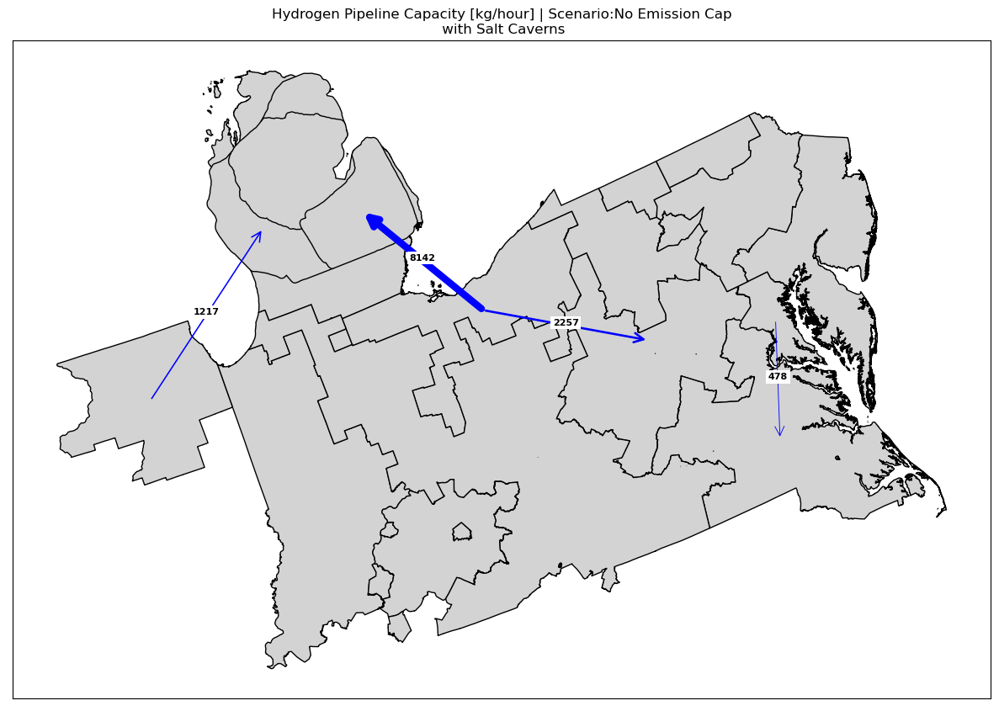

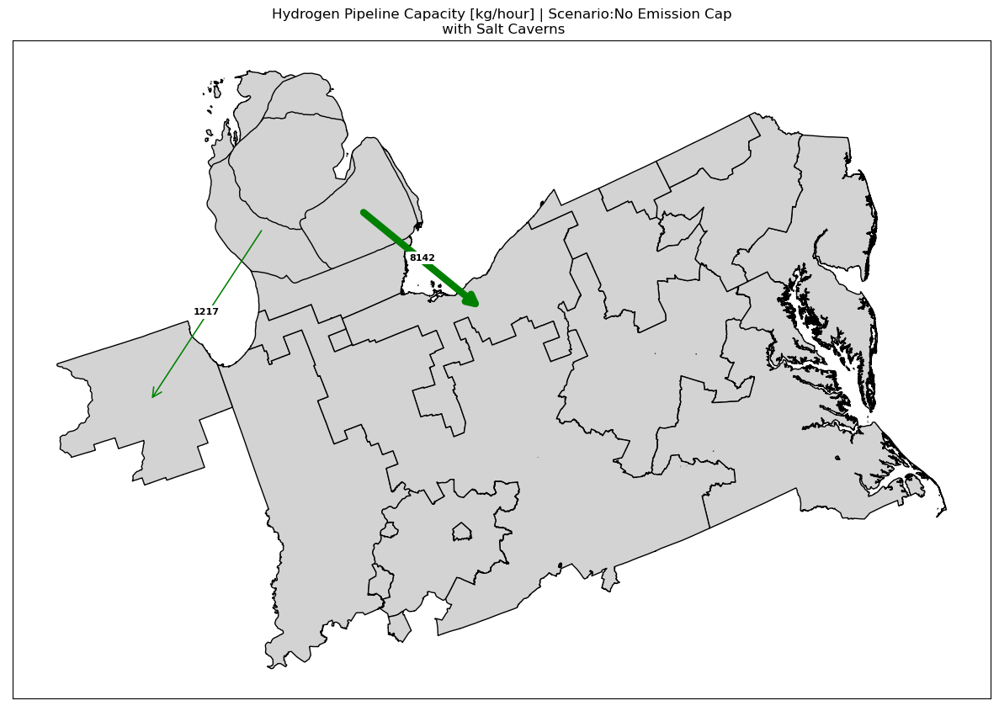

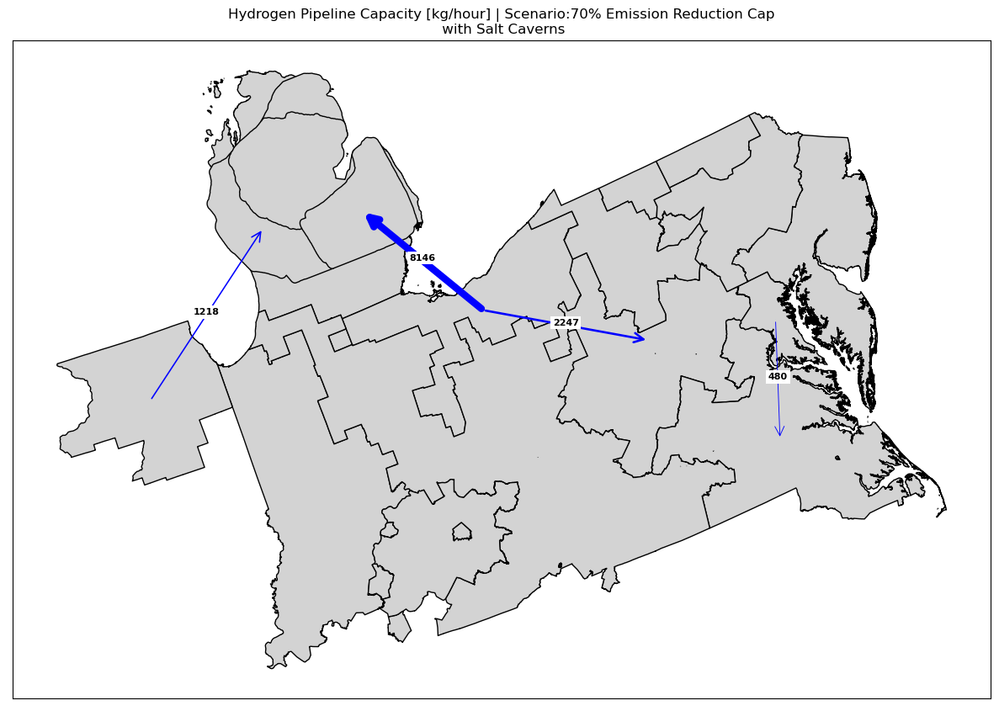

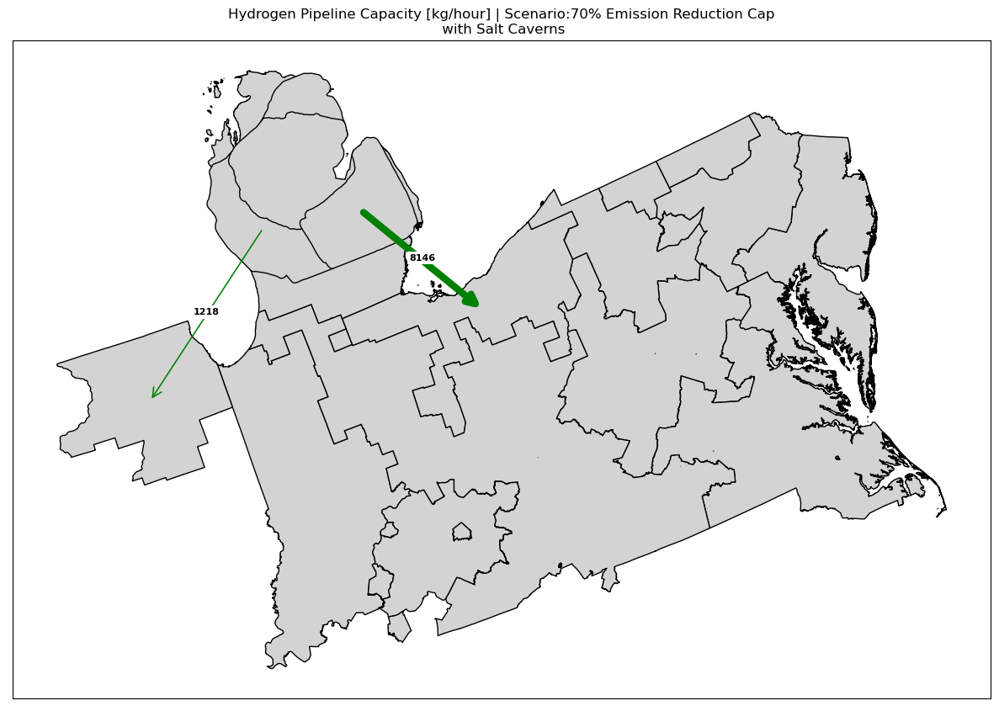

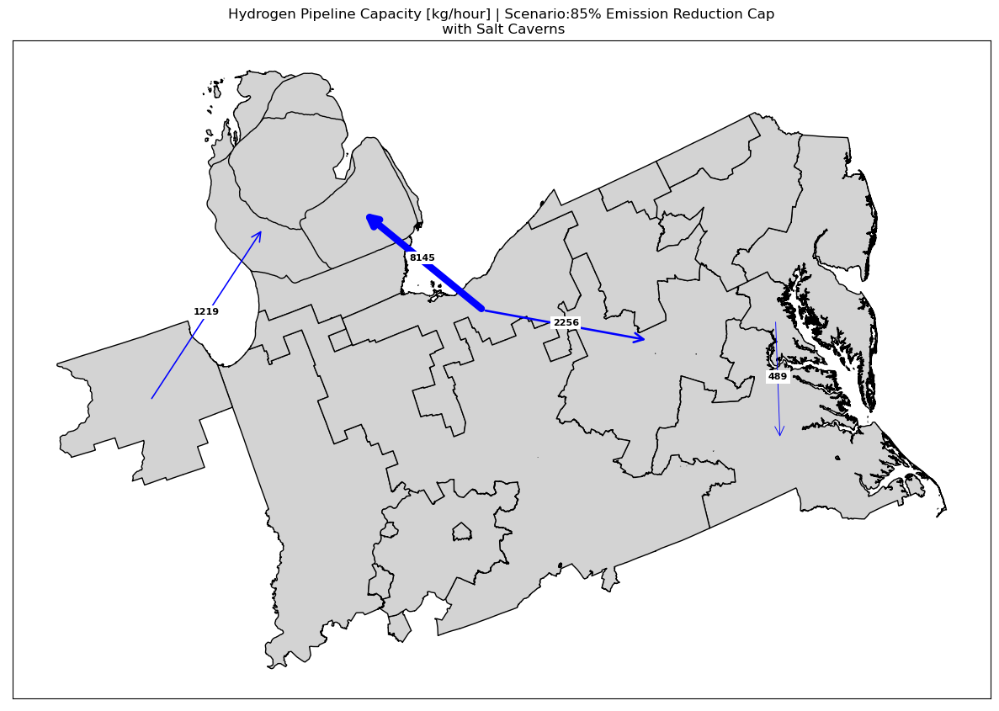

...

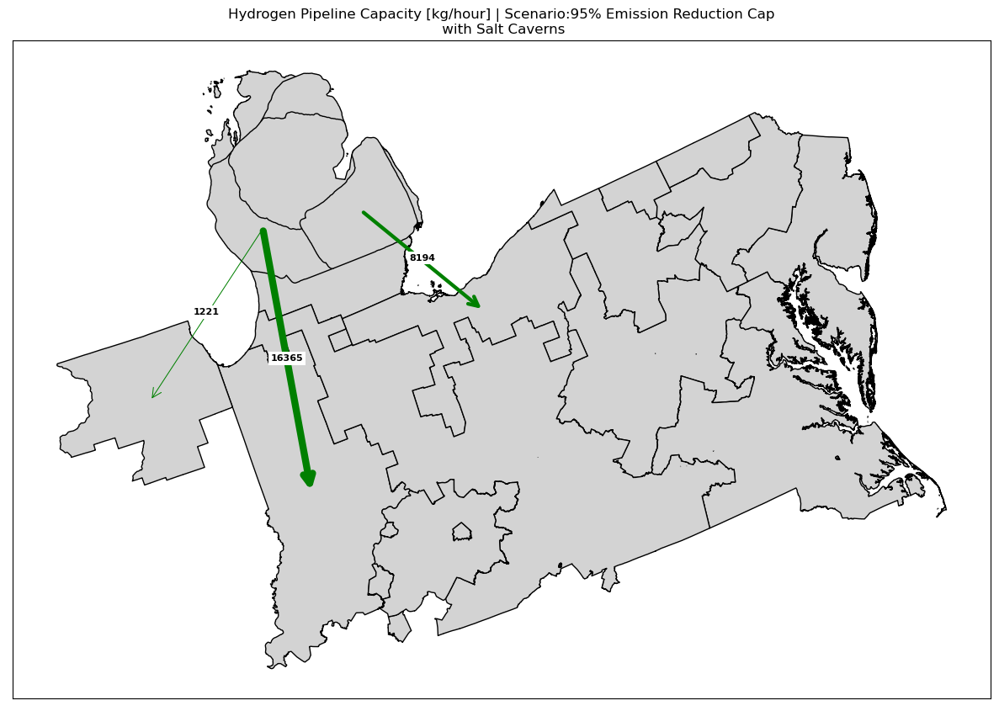

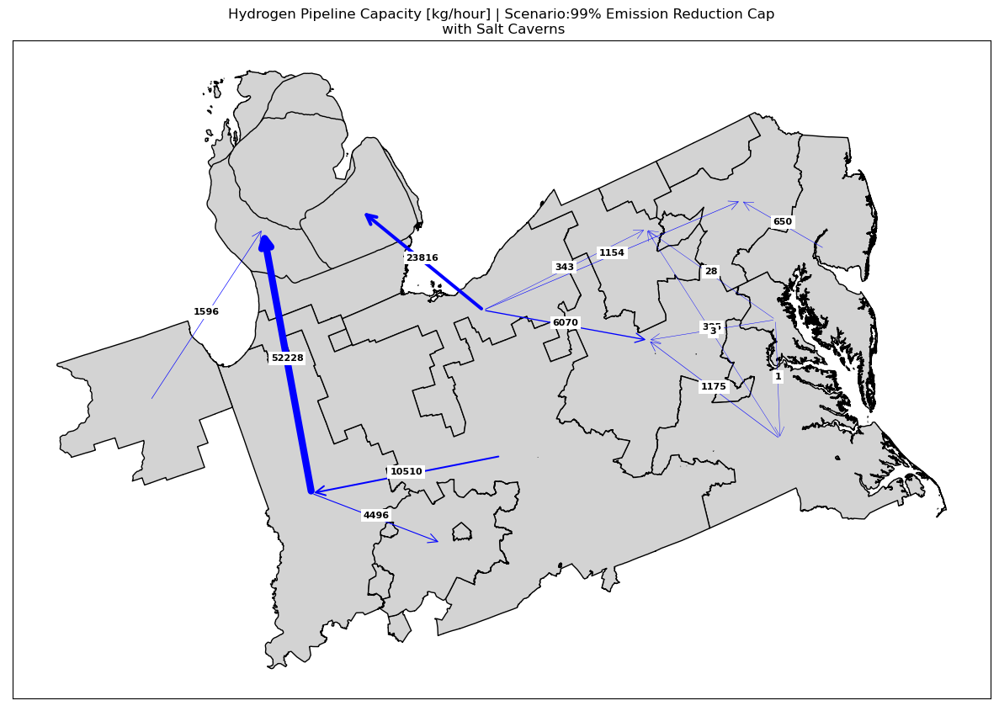

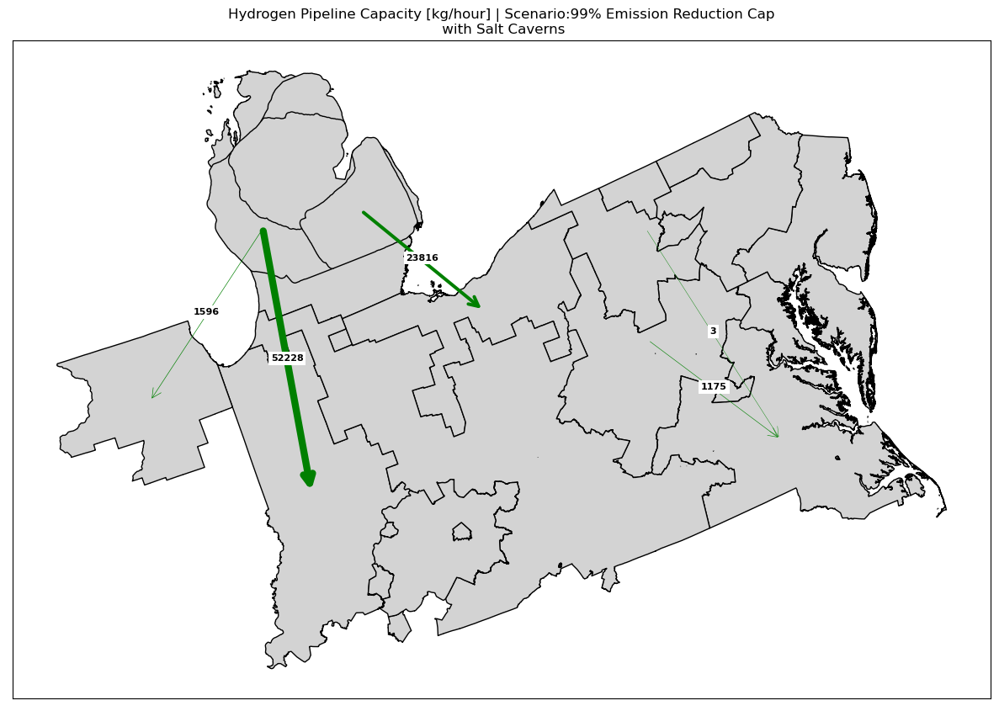

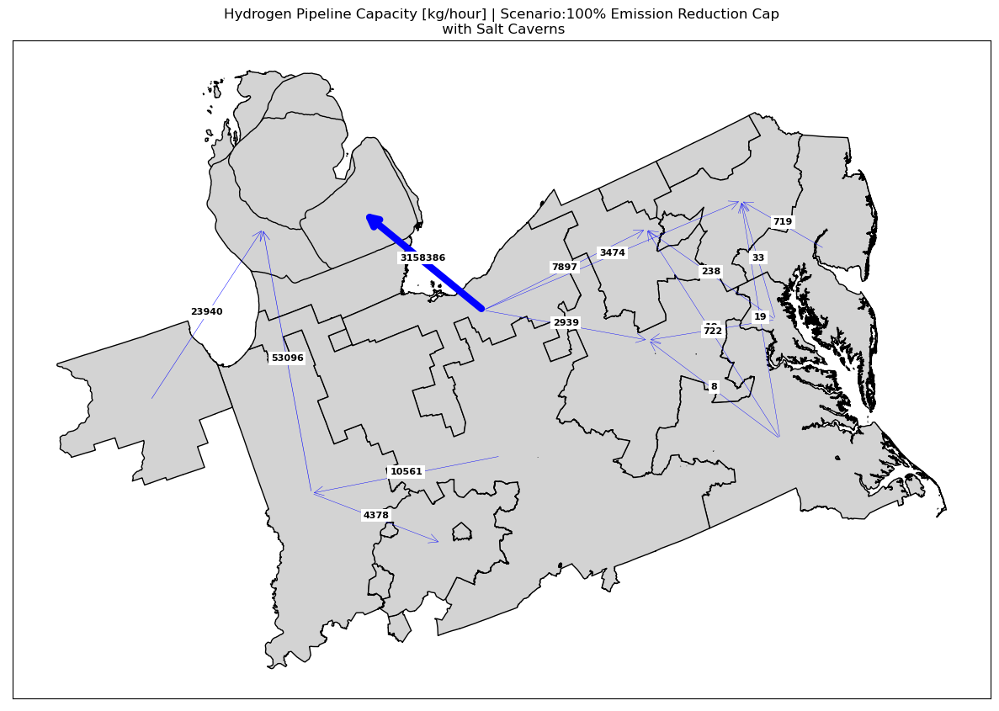

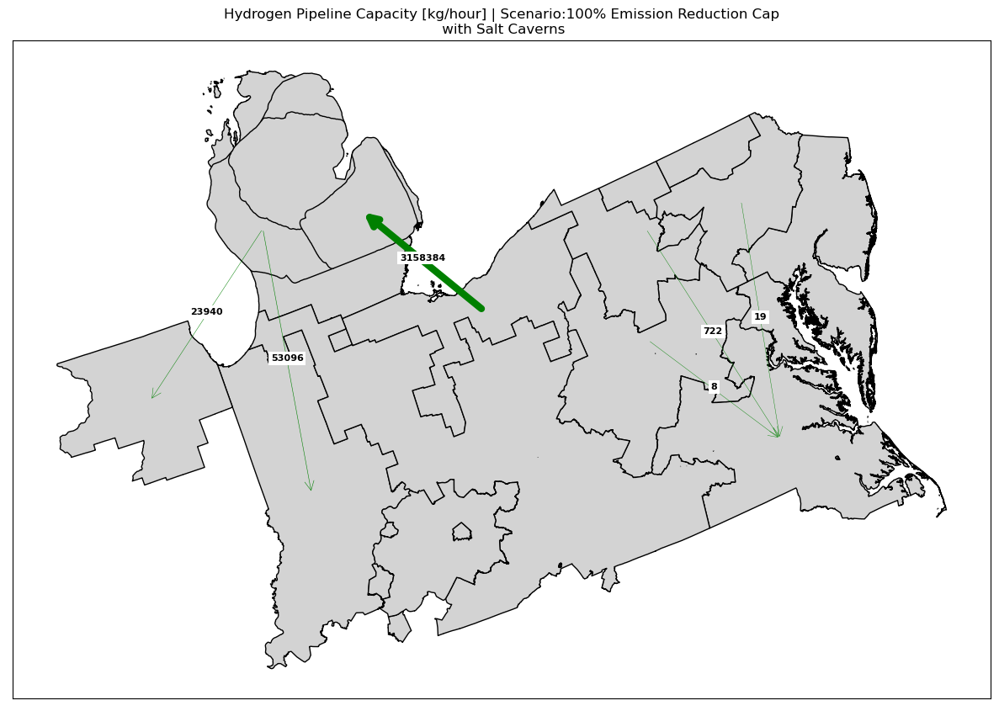

In [1156]:
# Assuming re name_dictand scenarios_with_caverns are defined and valid
zones_gdf = gpd.read_file('IPM_with_subregions/IPM_with_MI_subregions.shp')

def get_global_max_capacity(scenarios):
    global_max_capacity = 0
    for scenario in scenarios:
        pipeline_expansion_df = open_results_file('HSC_pipeline_expansion.csv', scenario)
        max_capacity = pipeline_expansion_df['New_Trans_Capacity'].max()
        if max_capacity > global_max_capacity:
            global_max_capacity = max_capacity
    return global_max_capacity

global_max_capacity = get_global_max_capacity(scenarios)

# Create the output directory if it doesn't exist
if not os.path.exists("pipeline_plots"):
    os.makedirs("pipeline_plots")
    
rename_dict_ = {k: v.replace('\n', '') for k, v in rename_dict.items()}

plot_pipelines_for_scenarios(scenarios_with_caverns, zones_gdf, rename_dict=rename_dict_, global_max_capacity=0)


In [537]:
scenarios_with_caverns

scenarios = scenarios_with_caverns
scenarios_renamed = [rename_dict[s] for s in scenarios]
scenarios_renamed 

['No Emission Cap\n with Salt Caverns',
 '70% Emission Reduction Cap\n with Salt Caverns',
 '85% Emission Reduction Cap\n with Salt Caverns',
 '90% Emission Reduction Cap\n with Salt Caverns',
 '95% Emission Reduction Cap\n with Salt Caverns',
 '99% Emission Reduction Cap\n with Salt Caverns',
 '100% Emission Reduction Cap\n with Salt Caverns']

In [561]:
rename_dict_ = {k: v.replace('\n', '') for k, v in rename_dict.items()}
rename_dict_ 

{'PJM_with_MI_subregions_no_caverns_0_red': 'No Emission Cap without Salt Caverns',
 'PJM_with_MI_subregions_no_caverns_70_red': '70% Emission Reduction Cap without Salt Caverns',
 'PJM_with_MI_subregions_no_caverns_85_red': '85% Emission Reduction Cap without Salt Caverns',
 'PJM_with_MI_subregions_no_caverns_90_red': '90% Emission Reduction Cap without Salt Caverns',
 'PJM_with_MI_subregions_no_caverns_95_red': '95% Emission Reduction Cap without Salt Caverns',
 'PJM_with_MI_subregions_no_caverns_99_red': '99% Emission Reduction Cap without Salt Caverns',
 'PJM_with_MI_subregions_no_caverns_100_red': '100% Emission Reduction Cap without Salt Caverns',
 'PJM_with_MI_subregions_with_caverns_0_red': 'No Emission Cap with Salt Caverns',
 'PJM_with_MI_subregions_with_caverns_70_red': '70% Emission Reduction Cap with Salt Caverns',
 'PJM_with_MI_subregions_with_caverns_85_red': '85% Emission Reduction Cap with Salt Caverns',
 'PJM_with_MI_subregions_with_caverns_90_red': '90% Emission Redu

# Maping with Capacity + Grid

In [1276]:
class SystemMap(CapacityMap, Grid_map):
    def __init__(self, df, gdf, units, max_circle_area_size, zone_name,
                 colors_IPM_zones, title, colors, zones_gdf, grid_expansion_df, grid_df, grid_color):
        
        CapacityMap.__init__(self, df, gdf, units, max_circle_area_size, zone_name, colors_IPM_zones, title, colors)
        Grid_map.__init__(self, zones_gdf, grid_expansion_df, grid_df, title, grid_color)
        
    
    def plot_combined_map(self):
        # Create a new figure and axes
        fig, ax = plt.subplots(figsize=(15, 15))

        # Generate the capacity plot
        self.plot_zones(ax)
        self.plot_storage(2, ax)  # or whichever layer you want to plot
        self.create_legends(2, ax)

        # Generate and plot the grid
        grid_to_zones = self.map_grid_to_zones()
        grid_to_zones_names = self.replace_zone_numbers_with_names(grid_to_zones, zone_number_dict)
        grid_geometry = self.compute_grid_geometries(grid_to_zones_names)
        grid_gdf = self.create_grid_gdf(grid_geometry, grid_expansion_df, zones_gdf)
        grid_widths = self.normalize_grid_widths(grid_gdf, grid_widths_scalar=3)

        self.plot_zones_and_grid(grid_gdf, grid_widths, annotate_capacity=True)

        ax.set_title('Combined Capacity and Grid Map', fontsize=14, fontweight='bold')
        ax.axis('off')
        plt.show()


        


NameError: name 'grid_expansion_df' is not defined

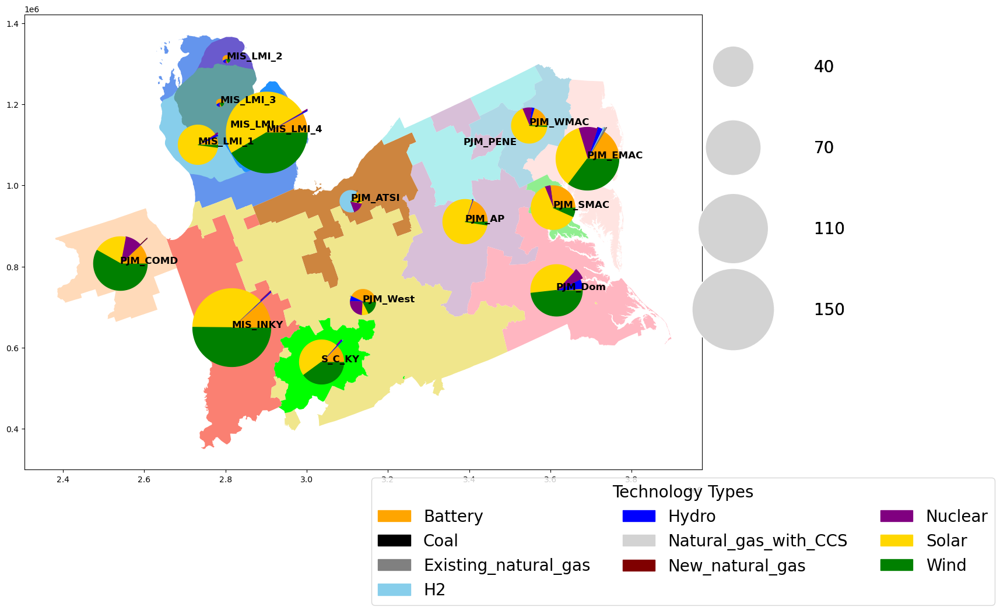

In [1280]:
## Generation Capacity
analysis_type = 'capacity'

df_capacity = electricity_analysis(scenario, get_zone, analysis_type)
units = 'GW'
title = 'Electricity Generation Capacity [GW]\n ' + rename_dict[scenario]
capacity_map = CapacityMap(df=df_capacity, units=units, colors=colors_generation, title=title,
                            max_circle_area_size=12000, zone_name=False)
colors = colors_generation
wires_expansion_df, wires_df = electric_transmission_df(scenario)


# Electric Grid
title = 'Electricity Transmission Capacity [MW]'
grid_color = 'purple'
# Create grids object and plot grid
grid_map = Grid_map(zones_gdf=zones_gdf, grid_expansion_df=wires_expansion_df, grid_df=wires_df, grid_color=grid_color)


electric_system_map = SystemMap(df_capacity, gdf, units='', max_circle_area_size=10000, zone_name=True, 
                           colors_IPM_zones=colors_IPM_zones, title='', colors=colors, zones_gdf=zones_gdf, 
                           grid_expansion_df=wires_expansion_df, grid_df=wires_df, grid_color=grid_color)

electric_system_map.plot_combined_map()
